In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import datetime
%matplotlib inline

In [2]:
n_sensors=16

In [3]:
x = np.linspace(0, 1, 101)
y = np.linspace(0, 1, 101)

In [4]:
t = np.linspace(0, 1, 41)

In [5]:
xrange = np.linspace(0, 1, 101)
yrange = np.linspace(0, 1, 101)
xmesh, ymesh = np.meshgrid(xrange, yrange)

In [6]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

$$ f_1(x, y, t) = e^{-t}(cos2\pi xcos2\pi y + sin2\pi xsin2\pi y) $$
$$ f_2(x, y, t) = x + y + t $$
$$ f_3(x, y, t) = e^{-t}(2sin2\pi x + sin2\pi xcos2\pi y) $$

Case 1: f1

In [7]:
out1 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out1[i, j, k] = np.exp(-t[i])*(np.cos(2*np.pi*x[j])*np.cos(2*np.pi*y[k])
                                           + np.sin(2*np.pi*x[j])*np.sin(2*np.pi*y[k]))

In [8]:
out1[0, :, :]

array([[1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ],
       [0.99802673, 1.        , 0.99802673, ..., 0.98228725, 0.9921147 ,
        0.99802673],
       [0.9921147 , 0.99802673, 1.        , ..., 0.96858316, 0.98228725,
        0.9921147 ],
       ...,
       [0.9921147 , 0.98228725, 0.96858316, ..., 1.        , 0.99802673,
        0.9921147 ],
       [0.99802673, 0.9921147 , 0.98228725, ..., 0.99802673, 1.        ,
        0.99802673],
       [1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ]])

In [9]:
sensor1 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor1[i, j, k] = out1[i, 20*(j+1)+1, 20*(k+1)+1]

In [10]:
sensor1.shape

(41, 4, 4)

In [11]:
sensor1 = sensor1.reshape(41, 16, 1)

In [12]:
sensor1.shape

(41, 16, 1)

In [13]:
x_train1, x_test1, y_train1, y_test1, t_train, t_test = train_test_split(sensor1, out1, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [14]:
t_train

array([[0.725],
       [0.15 ],
       [0.65 ],
       [0.3  ],
       [0.425],
       [0.225],
       [0.375],
       [0.8  ],
       [0.4  ],
       [0.875],
       [0.85 ],
       [0.   ],
       [0.675],
       [0.125],
       [0.275],
       [0.025],
       [0.75 ],
       [0.525],
       [0.05 ],
       [0.775],
       [0.925],
       [0.075],
       [0.9  ],
       [0.575],
       [0.825],
       [0.25 ],
       [0.55 ],
       [0.45 ],
       [0.5  ],
       [0.175],
       [0.35 ],
       [0.7  ],
       [0.95 ]])

In [15]:
x_train1

array([[[ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457]],

       [[ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798]],

       [[ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
       

In [16]:
x_test1

array([[[ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164]],

       [[ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735]],

       [[ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
       

In [17]:
input_time = tf.keras.Input(shape=(1))
reshape = tf.keras.layers.Reshape((1,))(input_time)

x_ = tf.keras.layers.Dense(units=4, activation='relu', name='firstHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=8, activation='relu', name='secondHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=16, activation='relu', name='thirdHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=16, activation=None, name='outputLayerSensor')(x_)
output_sensor = tf.keras.layers.Reshape((16, 1))(output_data)
# MLP
sensor_pred1 = tf.keras.Model(input_time, output_sensor)
sensor_pred2 = tf.keras.Model(input_time, output_sensor)
sensor_pred3 = tf.keras.Model(input_time, output_sensor)

In [18]:
sensor_pred1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 reshape (Reshape)           (None, 1)                 0         
                                                                 
 firstHiddenLayerSensor (Den  (None, 4)                8         
 se)                                                             
                                                                 
 batch_normalization (BatchN  (None, 4)                16        
 ormalization)                                                   
                                                                 
 secondHiddenLayerSensor (De  (None, 8)                40        
 nse)                                                            
                                                             

In [19]:
sensor_pred1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [20]:
start1 = datetime.datetime.now()
history1 = sensor_pred1.fit(t_train, x_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 8ms/step - loss: 1.0211 - rmse: 1.0022
Epoch 2/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.0184 - rmse: 1.0009
Epoch 3/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0081 - rmse: 0.9957
Epoch 4/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0041 - rmse: 0.9937
Epoch 5/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0009 - rmse: 0.9921
Epoch 6/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.9896 - rmse: 0.9864
Epoch 7/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.9839 - rmse: 0.9835
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.9854 - rmse: 0.9843
Epoch 9/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.9758 - rmse: 0.9794
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.9720 - rmse: 0.9774
Epoch 11/10000
2/2 [=============================

2/2 [==============================] - 0s 6ms/step - loss: 0.4912 - rmse: 0.6894
Epoch 171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4971 - rmse: 0.6937
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4912 - rmse: 0.6895
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4919 - rmse: 0.6899
Epoch 174/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4869 - rmse: 0.6863
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4855 - rmse: 0.6853
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4903 - rmse: 0.6888
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4821 - rmse: 0.6828
Epoch 178/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4871 - rmse: 0.6865
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4805 - rmse: 0.6816
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 12ms/step - loss: 0.2926 - rmse: 0.5267
Epoch 339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2927 - rmse: 0.5269
Epoch 340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2865 - rmse: 0.5210
Epoch 341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2889 - rmse: 0.5233
Epoch 342/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2891 - rmse: 0.5235
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2850 - rmse: 0.5195
Epoch 344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2888 - rmse: 0.5232
Epoch 345/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2814 - rmse: 0.5161
Epoch 346/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2851 - rmse: 0.5197
Epoch 347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2843 - rmse: 0.5188
Epoch 348/10000
2/2 [====================

2/2 [==============================] - 0s 11ms/step - loss: 0.1757 - rmse: 0.4017
Epoch 507/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1753 - rmse: 0.4012
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1729 - rmse: 0.3982
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1760 - rmse: 0.4020
Epoch 510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1762 - rmse: 0.4023
Epoch 511/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1752 - rmse: 0.4011
Epoch 512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1739 - rmse: 0.3995
Epoch 513/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1703 - rmse: 0.3949
Epoch 514/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1716 - rmse: 0.3966
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1702 - rmse: 0.3949
Epoch 516/10000
2/2 [===================

2/2 [==============================] - 0s 11ms/step - loss: 0.1372 - rmse: 0.3510
Epoch 591/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1358 - rmse: 0.3491
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1367 - rmse: 0.3504
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1349 - rmse: 0.3477
Epoch 594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1351 - rmse: 0.3480
Epoch 595/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1352 - rmse: 0.3482
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1340 - rmse: 0.3465
Epoch 597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1322 - rmse: 0.3438
Epoch 598/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1337 - rmse: 0.3460
Epoch 599/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1317 - rmse: 0.3432
Epoch 600/10000
2/2 [===================

2/2 [==============================] - 0s 11ms/step - loss: 0.1055 - rmse: 0.3031
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1046 - rmse: 0.3017
Epoch 676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1043 - rmse: 0.3011
Epoch 677/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1038 - rmse: 0.3002
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1043 - rmse: 0.3011
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1031 - rmse: 0.2991
Epoch 680/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1043 - rmse: 0.3011
Epoch 681/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1033 - rmse: 0.2995
Epoch 682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1042 - rmse: 0.3011
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1019 - rmse: 0.2972
Epoch 684/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 0.0673 - rmse: 0.2331
Epoch 843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0647 - rmse: 0.2274
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0640 - rmse: 0.2259
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0645 - rmse: 0.2272
Epoch 846/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0637 - rmse: 0.2254
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0633 - rmse: 0.2244
Epoch 848/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0661 - rmse: 0.2305
Epoch 849/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0628 - rmse: 0.2234
Epoch 850/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0636 - rmse: 0.2252
Epoch 851/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0639 - rmse: 0.2259
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0396 - rmse: 0.1653
Epoch 1011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0404 - rmse: 0.1675
Epoch 1012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0399 - rmse: 0.1661
Epoch 1013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0391 - rmse: 0.1639
Epoch 1014/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0394 - rmse: 0.1647
Epoch 1015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0396 - rmse: 0.1652
Epoch 1016/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0415 - rmse: 0.1708
Epoch 1017/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0395 - rmse: 0.1652
Epoch 1018/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0397 - rmse: 0.1657
Epoch 1019/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0382 - rmse: 0.1611
Epoch 1020/10000
2/2 [==============

2/2 [==============================] - 0s 7ms/step - loss: 0.0259 - rmse: 0.1191
Epoch 1177/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0262 - rmse: 0.1203
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0269 - rmse: 0.1235
Epoch 1179/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0258 - rmse: 0.1189
Epoch 1180/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0262 - rmse: 0.1206
Epoch 1181/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0258 - rmse: 0.1190
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0260 - rmse: 0.1196
Epoch 1183/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0269 - rmse: 0.1234
Epoch 1184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0268 - rmse: 0.1232
Epoch 1185/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0283 - rmse: 0.1290
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0202 - rmse: 0.0957
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0194 - rmse: 0.0913
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0196 - rmse: 0.0924
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0192 - rmse: 0.0901
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0194 - rmse: 0.0911
Epoch 1347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0190 - rmse: 0.0890
Epoch 1348/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0219 - rmse: 0.1040
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0196 - rmse: 0.0927
Epoch 1350/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0189 - rmse: 0.0889
Epoch 1351/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0190 - rmse: 0.0891
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0159 - rmse: 0.0736
Epoch 1509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0154 - rmse: 0.0701
Epoch 1510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0163 - rmse: 0.0762
Epoch 1511/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0154 - rmse: 0.0697
Epoch 1512/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0160 - rmse: 0.0742
Epoch 1513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0160 - rmse: 0.0745
Epoch 1514/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0152 - rmse: 0.0690
Epoch 1515/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0161 - rmse: 0.0750
Epoch 1516/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0154 - rmse: 0.0705
Epoch 1517/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0179 - rmse: 0.0862
Epoch 1518/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0140 - rmse: 0.0636
Epoch 1675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0135 - rmse: 0.0598
Epoch 1676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0141 - rmse: 0.0643
Epoch 1677/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0139 - rmse: 0.0628
Epoch 1678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0140 - rmse: 0.0641
Epoch 1679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0146 - rmse: 0.0686
Epoch 1680/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0134 - rmse: 0.0593
Epoch 1681/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0152 - rmse: 0.0728
Epoch 1682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0159 - rmse: 0.0774
Epoch 1683/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0134 - rmse: 0.0590
Epoch 1684/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0122 - rmse: 0.0529
Epoch 1841/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0119 - rmse: 0.0504
Epoch 1842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0122 - rmse: 0.0531
Epoch 1843/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0128 - rmse: 0.0583
Epoch 1844/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0118 - rmse: 0.0494
Epoch 1845/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0127 - rmse: 0.0572
Epoch 1846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0117 - rmse: 0.0483
Epoch 1847/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0128 - rmse: 0.0584
Epoch 1848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0121 - rmse: 0.0519
Epoch 1849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0124 - rmse: 0.0549
Epoch 1850/10000
2/2 [==============

2/2 [==============================] - 0s 7ms/step - loss: 0.0120 - rmse: 0.0558
Epoch 2007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0119 - rmse: 0.0549
Epoch 2008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0126 - rmse: 0.0607
Epoch 2009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0118 - rmse: 0.0545
Epoch 2010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.0488
Epoch 2011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.0481
Epoch 2012/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0118 - rmse: 0.0542
Epoch 2013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0132 - rmse: 0.0660
Epoch 2014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0117 - rmse: 0.0532
Epoch 2015/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0108 - rmse: 0.0436
Epoch 2016/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0410
Epoch 2173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0108 - rmse: 0.0490
Epoch 2174/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0101 - rmse: 0.0419
Epoch 2175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0418
Epoch 2176/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0104 - rmse: 0.0450
Epoch 2177/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0119 - rmse: 0.0592
Epoch 2178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0116 - rmse: 0.0567
Epoch 2179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0108 - rmse: 0.0496
Epoch 2180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0109 - rmse: 0.0508
Epoch 2181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0108 - rmse: 0.0492
Epoch 2182/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0417
Epoch 2339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0383
Epoch 2340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0447
Epoch 2341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0476
Epoch 2342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0102 - rmse: 0.0488
Epoch 2343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0409
Epoch 2344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0425
Epoch 2345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0464
Epoch 2346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0113 - rmse: 0.0590
Epoch 2347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0408
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0105 - rmse: 0.0554
Epoch 2505/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0455
Epoch 2506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0447
Epoch 2507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0412
Epoch 2508/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0368
Epoch 2509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0480
Epoch 2510/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0459
Epoch 2511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0450
Epoch 2512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0435
Epoch 2513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0459
Epoch 2514/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0364
Epoch 2671/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0085 - rmse: 0.0399
Epoch 2672/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0092 - rmse: 0.0473
Epoch 2673/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0393
Epoch 2674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0390
Epoch 2675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0374
Epoch 2676/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0085 - rmse: 0.0399
Epoch 2677/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0449
Epoch 2678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0339
Epoch 2679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0447
Epoch 2680/10000
2/2 [===========

2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0332
Epoch 2837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0435
Epoch 2838/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0330
Epoch 2839/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0538
Epoch 2840/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0321
Epoch 2841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0442
Epoch 2842/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0443
Epoch 2843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0380
Epoch 2844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0452
Epoch 2845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0415
Epoch 2846/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0292
Epoch 3003/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0497
Epoch 3004/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0424
Epoch 3005/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0384
Epoch 3006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0330
Epoch 3007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0310
Epoch 3008/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0349
Epoch 3009/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0423
Epoch 3010/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0290
Epoch 3011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0386
Epoch 3012/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0514
Epoch 3169/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0277
Epoch 3170/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0424
Epoch 3171/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0288
Epoch 3172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0364
Epoch 3173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0408
Epoch 3174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0430
Epoch 3175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0429
Epoch 3176/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0427
Epoch 3177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0287
Epoch 3178/10000
2/2 [==============

2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0267
Epoch 3335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0474
Epoch 3336/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0421
Epoch 3337/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0354
Epoch 3338/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0345
Epoch 3339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0257
Epoch 3340/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0409
Epoch 3341/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0062 - rmse: 0.0318
Epoch 3342/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0348
Epoch 3343/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0524
Epoch 3344/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0413
Epoch 3418/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0365
Epoch 3419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0330
Epoch 3420/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0355
Epoch 3421/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0391
Epoch 3422/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0242
Epoch 3423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0322
Epoch 3424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0317
Epoch 3425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0258
Epoch 3426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0543
Epoch 3427/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0260
Epoch 3501/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0292
Epoch 3502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0237
Epoch 3503/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0467
Epoch 3504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0236
Epoch 3505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0376
Epoch 3506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0488
Epoch 3507/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0454
Epoch 3508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0356
Epoch 3509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0242
Epoch 3510/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0369
Epoch 3667/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0355
Epoch 3668/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0353
Epoch 3669/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0243
Epoch 3670/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0050 - rmse: 0.0227
Epoch 3671/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0353
Epoch 3672/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0226
Epoch 3673/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0279
Epoch 3674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0365
Epoch 3675/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0310
Epoch 3676/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0328
Epoch 3833/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0382
Epoch 3834/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0469
Epoch 3835/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0288
Epoch 3836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0519
Epoch 3837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0231
Epoch 3838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0225
Epoch 3839/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0325
Epoch 3840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0302
Epoch 3841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0214
Epoch 3842/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0277
Epoch 3999/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0257
Epoch 4000/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0212
Epoch 4001/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0437
Epoch 4002/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0210
Epoch 4003/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0257
Epoch 4004/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0286
Epoch 4005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0238
Epoch 4006/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0221
Epoch 4007/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0273
Epoch 4008/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0460
Epoch 4082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0358
Epoch 4083/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0375
Epoch 4084/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0361
Epoch 4085/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0454
Epoch 4086/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0508
Epoch 4087/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0377
Epoch 4088/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0229
Epoch 4089/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0368
Epoch 4090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0206
Epoch 4091/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0348
Epoch 4165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0266
Epoch 4166/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0281
Epoch 4167/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0272
Epoch 4168/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0489
Epoch 4169/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0319
Epoch 4170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0249
Epoch 4171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0193
Epoch 4172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0463
Epoch 4173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0195
Epoch 4174/10000
2/2 [=========

Epoch 4247/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0489
Epoch 4248/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0285
Epoch 4249/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0055 - rmse: 0.0454
Epoch 4250/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0362
Epoch 4251/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0224
Epoch 4252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0451
Epoch 4253/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0278
Epoch 4254/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0281
Epoch 4255/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0263
Epoch 4256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0263
Epoch 4257

2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0236
Epoch 4413/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0235
Epoch 4414/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0280
Epoch 4415/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0235
Epoch 4416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0318
Epoch 4417/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0323
Epoch 4418/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0320
Epoch 4419/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0271
Epoch 4420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0244
Epoch 4421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0237
Epoch 4422/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0502
Epoch 4579/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0368
Epoch 4580/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0276
Epoch 4581/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0253
Epoch 4582/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0471
Epoch 4583/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0305
Epoch 4584/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0175
Epoch 4585/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0169
Epoch 4586/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0161
Epoch 4587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0327
Epoch 4588/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0313
Epoch 4745/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0246
Epoch 4746/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0236
Epoch 4747/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0137
Epoch 4748/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0235
Epoch 4749/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0438
Epoch 4750/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0140
Epoch 4751/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0208
Epoch 4752/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0347
Epoch 4753/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0333
Epoch 4754/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0113
Epoch 4911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0145
Epoch 4912/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0119
Epoch 4913/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0332
Epoch 4914/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0193
Epoch 4915/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0256
Epoch 4916/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0195
Epoch 4917/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0344
Epoch 4918/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0166
Epoch 4919/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0348
Epoch 4920/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0262
Epoch 5075/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0102
Epoch 5076/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0430
Epoch 5077/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0198
Epoch 5078/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0226
Epoch 5079/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0165
Epoch 5080/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0302
Epoch 5081/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0235
Epoch 5082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0420
Epoch 5083/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0240
Epoch 5084/10000
2/2 [=======

Epoch 5157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0208
Epoch 5158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0115
Epoch 5159/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0193
Epoch 5160/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0112
Epoch 5161/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0402
Epoch 5162/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0221
Epoch 5163/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0222
Epoch 5164/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0396
Epoch 5165/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0166
Epoch 5166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0106
Epoch 5167/

Epoch 5322/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0130
Epoch 5323/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0154
Epoch 5324/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0261
Epoch 5325/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0258
Epoch 5326/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0320
Epoch 5327/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0224
Epoch 5328/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0349
Epoch 5329/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0152
Epoch 5330/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0215
Epoch 5331/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0294
Epoch 5332

Epoch 5487/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0092
Epoch 5488/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0114
Epoch 5489/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0098
Epoch 5490/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0171
Epoch 5491/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0287
Epoch 5492/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0339
Epoch 5493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0198
Epoch 5494/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0133
Epoch 5495/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0098
Epoch 5496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0238
Epoch 5497/1

Epoch 5652/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0342
Epoch 5653/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0130
Epoch 5654/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0428
Epoch 5655/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0190
Epoch 5656/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0305
Epoch 5657/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0147
Epoch 5658/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0131
Epoch 5659/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0144
Epoch 5660/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0302
Epoch 5661/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0133
Epoch 5662

2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0264
Epoch 5818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0268
Epoch 5819/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0318
Epoch 5820/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0251
Epoch 5821/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0246
Epoch 5822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0333
Epoch 5823/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0131
Epoch 5824/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0400
Epoch 5825/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0241
Epoch 5826/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0241
Epoch 5827/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0385
Epoch 5984/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0142
Epoch 5985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0107
Epoch 5986/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0482
Epoch 5987/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0187
Epoch 5988/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0324
Epoch 5989/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0286
Epoch 5990/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0273
Epoch 5991/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0246
Epoch 5992/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0115
Epoch 5993/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0135
Epoch 6150/10000
2/2 [==============================] - ETA: 0s - loss: 0.0016 - rmse: 0.01 - 0s 13ms/step - loss: 0.0038 - rmse: 0.0482
Epoch 6151/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0141
Epoch 6152/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0274
Epoch 6153/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0112
Epoch 6154/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0207
Epoch 6155/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0280
Epoch 6156/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0118
Epoch 6157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0270
Epoch 6158/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse:

2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0279
Epoch 6315/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0302
Epoch 6316/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0325
Epoch 6317/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0287
Epoch 6318/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0136
Epoch 6319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0330
Epoch 6320/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0231
Epoch 6321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0314
Epoch 6322/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0389
Epoch 6323/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0263
Epoch 6324/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0100
Epoch 6481/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0329
Epoch 6482/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0110
Epoch 6483/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0254
Epoch 6484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0454
Epoch 6485/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0229
Epoch 6486/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0191
Epoch 6487/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0209
Epoch 6488/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0114
Epoch 6489/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0212
Epoch 6490/10000
2/2 [======

Epoch 6563/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0356
Epoch 6564/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0490
Epoch 6565/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0489
Epoch 6566/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0282
Epoch 6567/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0267
Epoch 6568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0255
Epoch 6569/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0365
Epoch 6570/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0253
Epoch 6571/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0196
Epoch 6572/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0189
Epoch 6573/100

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0287
Epoch 6647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0199
Epoch 6648/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0157
Epoch 6649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0293
Epoch 6650/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0133
Epoch 6651/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0111
Epoch 6652/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0130
Epoch 6653/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0149
Epoch 6654/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0222
Epoch 6655/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0205
Epoch 6656/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0224
Epoch 6813/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0476
Epoch 6814/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0145
Epoch 6815/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0096
Epoch 6816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0223
Epoch 6817/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0451
Epoch 6818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0243
Epoch 6819/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0259
Epoch 6820/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0126
Epoch 6821/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0274
Epoch 6822/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0194
Epoch 6979/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0239
Epoch 6980/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0449
Epoch 6981/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0119
Epoch 6982/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0180
Epoch 6983/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0231
Epoch 6984/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0186
Epoch 6985/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0315
Epoch 6986/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0150
Epoch 6987/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0298
Epoch 6988/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0393
Epoch 7145/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0280
Epoch 7146/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0137
Epoch 7147/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0308
Epoch 7148/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0397
Epoch 7149/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0457
Epoch 7150/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0235
Epoch 7151/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0341
Epoch 7152/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0224
Epoch 7153/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0328
Epoch 7154/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0148
Epoch 7311/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0312
Epoch 7312/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0014 - rmse: 0.0199
Epoch 7313/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0177
Epoch 7314/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0261
Epoch 7315/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0332
Epoch 7316/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0275
Epoch 7317/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0259
Epoch 7318/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0339
Epoch 7319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0144
Epoch 7320/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0289
Epoch 7477/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0163
Epoch 7478/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0190
Epoch 7479/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0283
Epoch 7480/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0110
Epoch 7481/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0279
Epoch 7482/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0156
Epoch 7483/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0328
Epoch 7484/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0286
Epoch 7485/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0203
Epoch 7486/10000
2/2 [============

2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0263
Epoch 7560/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0283
Epoch 7561/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0209
Epoch 7562/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0280
Epoch 7563/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0389
Epoch 7564/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0161
Epoch 7565/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0306
Epoch 7566/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0307
Epoch 7567/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0230
Epoch 7568/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0153
Epoch 7569/10000
2/2 [=====

Epoch 7642/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0090
Epoch 7643/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0231
Epoch 7644/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0176
Epoch 7645/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0220
Epoch 7646/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0272
Epoch 7647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0139
Epoch 7648/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0132
Epoch 7649/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0262
Epoch 7650/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0286
Epoch 7651/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0215
Epoch 7652

2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0112
Epoch 7807/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0256
Epoch 7808/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0269
Epoch 7809/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0309
Epoch 7810/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0216
Epoch 7811/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0255
Epoch 7812/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0320
Epoch 7813/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0179
Epoch 7814/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0332
Epoch 7815/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0201
Epoch 7816/10000
2/2 [=====

Epoch 7889/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0162
Epoch 7890/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0114
Epoch 7891/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0090
Epoch 7892/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0337
Epoch 7893/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0336
Epoch 7894/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0111
Epoch 7895/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0189
Epoch 7896/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0390
Epoch 7897/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0119
Epoch 7898/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0479
Epoch 7899/

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0317
Epoch 8054/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0125
Epoch 8055/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0109
Epoch 8056/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0177
Epoch 8057/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8295e-04 - rmse: 0.0095
Epoch 8058/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.8252e-04 - rmse: 0.0095
Epoch 8059/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0263
Epoch 8060/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0124
Epoch 8061/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0172
Epoch 8062/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0219
Epoch 8063/10000
2/2

2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0304
Epoch 8218/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0219
Epoch 8219/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0306
Epoch 8220/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0130
Epoch 8221/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0279
Epoch 8222/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0211
Epoch 8223/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0128
Epoch 8224/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0182
Epoch 8225/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0485
Epoch 8226/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0209
Epoch 8227/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0321
Epoch 8382/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0205
Epoch 8383/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5238e-04 - rmse: 0.0108
Epoch 8384/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0270
Epoch 8385/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0450
Epoch 8386/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0184
Epoch 8387/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0310
Epoch 8388/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0233
Epoch 8389/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0332
Epoch 8390/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.4347e-04 - rmse: 0.0105
Epoch 8391/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0198
Epoch 8464/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0153
Epoch 8465/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0338
Epoch 8466/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1235e-04 - rmse: 0.0095
Epoch 8467/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0295
Epoch 8468/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0242
Epoch 8469/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0268
Epoch 8470/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0287
Epoch 8471/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.9471e-04 - rmse: 0.0086
Epoch 8472/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0200
Epoch 8473/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0418
Epoch 8546/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0208
Epoch 8547/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0193
Epoch 8548/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0288
Epoch 8549/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0257
Epoch 8550/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0278
Epoch 8551/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0273
Epoch 8552/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0183
Epoch 8553/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0175
Epoch 8554/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0247
Epoch 8555/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0177
Epoch 8628/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0256
Epoch 8629/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0270
Epoch 8630/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0423
Epoch 8631/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.9321e-04 - rmse: 0.0099
Epoch 8632/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0310
Epoch 8633/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0236
Epoch 8634/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0286
Epoch 8635/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0444
Epoch 8636/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8223e-04 - rmse: 0.0094
Epoch 8637/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 8.8076e-04 - rmse: 0.0100
Epoch 8710/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2040e-04 - rmse: 0.0118
Epoch 8711/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0323
Epoch 8712/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0329
Epoch 8713/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0477
Epoch 8714/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0322
Epoch 8715/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0442
Epoch 8716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0382
Epoch 8717/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0306
Epoch 8718/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.3111e-04 - rmse: 0.0123
Epoch 8719/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0283
Epoch 8792/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0443
Epoch 8793/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0176
Epoch 8794/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0288
Epoch 8795/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0297
Epoch 8796/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.9540e-04 - rmse: 0.0113
Epoch 8797/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0304
Epoch 8798/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.3328e-04 - rmse: 0.0081
Epoch 8799/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0228
Epoch 8800/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.5798e-04 - rmse: 0.0095
Epoch 8801/1000

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0272
Epoch 8874/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0323
Epoch 8875/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0328
Epoch 8876/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3044e-04 - rmse: 0.0132
Epoch 8877/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0299
Epoch 8878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0301
Epoch 8879/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2867e-04 - rmse: 0.0086
Epoch 8880/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0269
Epoch 8881/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1164e-04 - rmse: 0.0075
Epoch 8882/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1290e-04 - rmse: 0.0076
Epoch 8883/1000

2/2 [==============================] - 0s 12ms/step - loss: 8.8575e-04 - rmse: 0.0119
Epoch 8956/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8468e-04 - rmse: 0.0119
Epoch 8957/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0337
Epoch 8958/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3805e-04 - rmse: 0.0097
Epoch 8959/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0261
Epoch 8960/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0259
Epoch 8961/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.5593e-04 - rmse: 0.0106
Epoch 8962/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0395
Epoch 8963/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.5359e-04 - rmse: 0.0105
Epoch 8964/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0287
Epoch 8965/1

2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0322
Epoch 9120/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0477
Epoch 9121/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0446
Epoch 9122/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0306
Epoch 9123/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0235
Epoch 9124/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1183e-04 - rmse: 0.0097
Epoch 9125/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0298
Epoch 9126/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0249
Epoch 9127/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0452
Epoch 9128/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0310
Epoch 9129/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0390
Epoch 9283/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0387
Epoch 9284/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.3720e-04 - rmse: 0.0119
Epoch 9285/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0225
Epoch 9286/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0322
Epoch 9287/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0477
Epoch 9288/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5070e-04 - rmse: 0.0160
Epoch 9289/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0309
Epoch 9290/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0333
Epoch 9291/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0278
Epoch 9292/10000
2/2

2/2 [==============================] - 0s 10ms/step - loss: 8.2101e-04 - rmse: 0.0122
Epoch 9445/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0218
Epoch 9446/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7081e-04 - rmse: 0.0173
Epoch 9447/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0272
Epoch 9448/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0289
Epoch 9449/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7022e-04 - rmse: 0.0099
Epoch 9450/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.0117e-04 - rmse: 0.0113
Epoch 9451/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0326
Epoch 9452/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.5425e-04 - rmse: 0.0168
Epoch 9453/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0231
Epoch 9

2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0219
Epoch 9607/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0298
Epoch 9608/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0210
Epoch 9609/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0294
Epoch 9610/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0269
Epoch 9611/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8297e-04 - rmse: 0.0182
Epoch 9612/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0276
Epoch 9613/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0251
Epoch 9614/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0201
Epoch 9615/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4604e-04 - rmse: 0.0172
Epoch 9616/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0379
Epoch 9769/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0199
Epoch 9770/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2191e-04 - rmse: 0.0171
Epoch 9771/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0474
Epoch 9772/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1054e-04 - rmse: 0.0090
Epoch 9773/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.6696e-04 - rmse: 0.0117
Epoch 9774/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0295
Epoch 9775/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.0560e-04 - rmse: 0.0087
Epoch 9776/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0294
Epoch 9777/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0212
Epoch 9778/

2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 9931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0474
Epoch 9932/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.0490e-04 - rmse: 0.0097
Epoch 9933/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0310
Epoch 9934/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0283
Epoch 9935/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0256
Epoch 9936/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0321
Epoch 9937/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.8101e-04 - rmse: 0.0085
Epoch 9938/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0241
Epoch 9939/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0321
Epoch 9940/10000
2/

In [21]:
time1_sensor = end1 - start1
print("Training time (Case 1, sensor prediction):", time1_sensor)

Training time (Case 1, sensor prediction): 0:03:45.729886


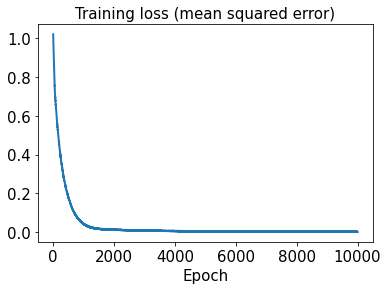

In [22]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

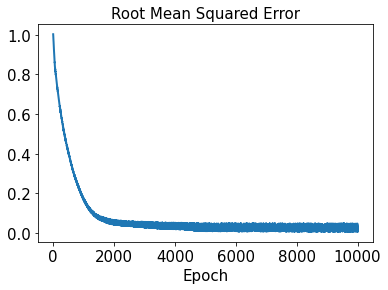

In [23]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [24]:
input_data = tf.keras.Input(shape=(n_sensors, 1))
reshape = tf.keras.layers.Reshape((n_sensors,))(input_data)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=101*101, activation=None, name='outputLayer')(x_)
output_img = tf.keras.layers.Reshape((101,101))(output_data)
# Shallow Decoder (SD)
sd1 = tf.keras.Model(input_data, output_img)
sd2 = tf.keras.Model(input_data, output_img)
sd3 = tf.keras.Model(input_data, output_img)

In [25]:
sd1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 reshape_2 (Reshape)         (None, 16)                0         
                                                                 
 firstHiddenLayer (Dense)    (None, 128)               2176      
                                                                 
 batch_normalization_3 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 secondHiddenLayer (Dense)   (None, 128)               16512     
                                                                 
 batch_normalization_4 (Batc  (None, 128)              512       
 hNormalization)                                           

In [26]:
sd1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [27]:
start1 = datetime.datetime.now()
history1 = sd1.fit(x_train1, y_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 22ms/step - loss: 0.5272 - rmse: 0.4952
Epoch 2/10000
2/2 [==============================] - 0s 51ms/step - loss: 0.5220 - rmse: 0.4909
Epoch 3/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5175 - rmse: 0.4874
Epoch 4/10000
2/2 [==============================] - 0s 25ms/step - loss: 0.5130 - rmse: 0.4837
Epoch 5/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5089 - rmse: 0.4806
Epoch 6/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5051 - rmse: 0.4777
Epoch 7/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.5011 - rmse: 0.4746
Epoch 8/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4978 - rmse: 0.4722
Epoch 9/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4944 - rmse: 0.4696
Epoch 10/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4920 - rmse: 0.4681
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 7ms/step - loss: 0.2749 - rmse: 0.3540
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2736 - rmse: 0.3529
Epoch 172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2720 - rmse: 0.3513
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2699 - rmse: 0.3492
Epoch 174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2689 - rmse: 0.3486
Epoch 175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2675 - rmse: 0.3472
Epoch 176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2663 - rmse: 0.3463
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2642 - rmse: 0.3440
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2623 - rmse: 0.3420
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2608 - rmse: 0.3406
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0910 - rmse: 0.0844
Epoch 339/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0909 - rmse: 0.0858
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0901 - rmse: 0.0824
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0898 - rmse: 0.0820
Epoch 342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0907 - rmse: 0.0892
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0897 - rmse: 0.0851
Epoch 344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0888 - rmse: 0.0811
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0880 - rmse: 0.0778
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0892 - rmse: 0.0865
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0876 - rmse: 0.0788
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0501 - rmse: 0.0245
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0506 - rmse: 0.0352
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0502 - rmse: 0.0313
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0500 - rmse: 0.0299
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0492 - rmse: 0.0161
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0494 - rmse: 0.0242
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0494 - rmse: 0.0280
Epoch 513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0489 - rmse: 0.0207
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0488 - rmse: 0.0212
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0485 - rmse: 0.0162
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0315 - rmse: 0.0271
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0310 - rmse: 0.0179
Epoch 676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0307 - rmse: 0.0129
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0312 - rmse: 0.0260
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0309 - rmse: 0.0224
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0305 - rmse: 0.0112
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0304 - rmse: 0.0120
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0307 - rmse: 0.0226
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0304 - rmse: 0.0184
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0307 - rmse: 0.0262
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0207 - rmse: 0.0127
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0209 - rmse: 0.0197
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0221 - rmse: 0.0400
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0218 - rmse: 0.0368
Epoch 846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0208 - rmse: 0.0210
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0210 - rmse: 0.0249
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0213 - rmse: 0.0314
Epoch 849/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0221 - rmse: 0.0431
Epoch 850/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0209 - rmse: 0.0267
Epoch 851/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0207 - rmse: 0.0237
Epoch 852/10000
2/2 [======================

2/2 [==============================] - 0s 13ms/step - loss: 0.0156 - rmse: 0.0314
Epoch 1011/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0155 - rmse: 0.0304
Epoch 1012/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0154 - rmse: 0.0285
Epoch 1013/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0147 - rmse: 0.0121
Epoch 1014/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0150 - rmse: 0.0202
Epoch 1015/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0151 - rmse: 0.0245
Epoch 1016/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0151 - rmse: 0.0250
Epoch 1017/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0158 - rmse: 0.0371
Epoch 1018/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0163 - rmse: 0.0427
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0145 - rmse: 0.0074
Epoch 1020/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0129 - rmse: 0.0431
Epoch 1177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0118 - rmse: 0.0263
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.0156
Epoch 1179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0084
Epoch 1180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0114 - rmse: 0.0191
Epoch 1181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0121 - rmse: 0.0324
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0079
Epoch 1183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0118 - rmse: 0.0285
Epoch 1184/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0128 - rmse: 0.0434
Epoch 1185/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0114 - rmse: 0.0215
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0320
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0344
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0187
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0349
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0254
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0312
Epoch 1348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0268
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0107 - rmse: 0.0466
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0334
Epoch 1351/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0267
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0297
Epoch 1509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0150
Epoch 1510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0089 - rmse: 0.0470
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0346
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0177
Epoch 1513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0237
Epoch 1514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0195
Epoch 1515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0315
Epoch 1516/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0265
Epoch 1517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0319
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0251
Epoch 1675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0454
Epoch 1676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0278
Epoch 1677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0332
Epoch 1678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0280
Epoch 1679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0405
Epoch 1680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0324
Epoch 1681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0269
Epoch 1682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0204
Epoch 1683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0199
Epoch 1684/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0258
Epoch 1841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0134
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0274
Epoch 1843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0192
Epoch 1844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0234
Epoch 1845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0337
Epoch 1846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0119
Epoch 1847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0338
Epoch 1848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0300
Epoch 1849/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0167
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0269
Epoch 2007/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0141
Epoch 2008/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0398
Epoch 2009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0323
Epoch 2010/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0247
Epoch 2011/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0127
Epoch 2012/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0104
Epoch 2013/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0290
Epoch 2014/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0092
Epoch 2015/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0052 - rmse: 0.0447
Epoch 2016/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0308
Epoch 2173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0443
Epoch 2174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0358
Epoch 2175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0133
Epoch 2176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0466
Epoch 2177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0351
Epoch 2178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0233
Epoch 2179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0317
Epoch 2180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0139
Epoch 2181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0436
Epoch 2182/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0206
Epoch 2339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0440
Epoch 2340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0304
Epoch 2341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0268
Epoch 2342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0299
Epoch 2343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0345
Epoch 2344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0146
Epoch 2345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0299
Epoch 2346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0169
Epoch 2347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0189
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0134
Epoch 2505/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0286
Epoch 2506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0395
Epoch 2507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0308
Epoch 2508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0162
Epoch 2509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0170
Epoch 2510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0159
Epoch 2511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0174
Epoch 2512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0236
Epoch 2513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0460
Epoch 2514/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0261
Epoch 2671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0301
Epoch 2672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0238
Epoch 2673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0232
Epoch 2674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0108
Epoch 2675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0241
Epoch 2676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0452
Epoch 2677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0222
Epoch 2678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0107
Epoch 2679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0260
Epoch 2680/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0233
Epoch 2837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0114
Epoch 2838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0173
Epoch 2839/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0189
Epoch 2840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0172
Epoch 2841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0388
Epoch 2842/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0129
Epoch 2843/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0215
Epoch 2844/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0176
Epoch 2845/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0237
Epoch 2846/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0345
Epoch 3003/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0203
Epoch 3004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0306
Epoch 3005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0301
Epoch 3006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0455
Epoch 3007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0276
Epoch 3008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0199
Epoch 3009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0196
Epoch 3010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0271
Epoch 3011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0181
Epoch 3012/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0182
Epoch 3086/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3518e-04 - rmse: 0.0113
Epoch 3087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0189
Epoch 3088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0174
Epoch 3089/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0803e-04 - rmse: 0.0143
Epoch 3090/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0448e-04 - rmse: 0.0101
Epoch 3091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0240
Epoch 3092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0207
Epoch 3093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0425
Epoch 3094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0257
Epoch 3095/10000
2/2 [===

2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0287
Epoch 3250/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0377
Epoch 3251/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5962e-04 - rmse: 0.0167
Epoch 3252/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2711e-04 - rmse: 0.0121
Epoch 3253/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0457
Epoch 3254/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0207
Epoch 3255/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5009e-04 - rmse: 0.0085
Epoch 3256/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2043e-04 - rmse: 0.0066
Epoch 3257/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3658e-04 - rmse: 0.0161
Epoch 3258/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8172e-04 - rmse: 0.0175
Epoc

2/2 [==============================] - 0s 10ms/step - loss: 8.1375e-04 - rmse: 0.0182
Epoch 3412/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0334
Epoch 3413/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0316
Epoch 3414/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0356
Epoch 3415/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4773e-04 - rmse: 0.0216
Epoch 3416/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0118e-04 - rmse: 0.0179
Epoch 3417/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0305
Epoch 3418/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5939e-04 - rmse: 0.0194
Epoch 3419/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3652e-04 - rmse: 0.0214
Epoch 3420/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8004e-04 - rmse: 0.0200
Epoch

2/2 [==============================] - 0s 6ms/step - loss: 6.0075e-04 - rmse: 0.0139
Epoch 3575/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0454
Epoch 3576/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9359e-04 - rmse: 0.0220
Epoch 3577/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0308
Epoch 3578/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3608e-04 - rmse: 0.0113
Epoch 3579/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7010e-04 - rmse: 0.0162
Epoch 3580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0403
Epoch 3581/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0277
Epoch 3582/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0317
Epoch 3583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0289
Epoch 3584/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 4.7294e-04 - rmse: 0.0113
Epoch 3737/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4359e-04 - rmse: 0.0099
Epoch 3738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0280
Epoch 3739/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9799e-04 - rmse: 0.0235
Epoch 3740/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3773e-04 - rmse: 0.0096
Epoch 3741/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7055e-04 - rmse: 0.0181
Epoch 3742/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5517e-04 - rmse: 0.0105
Epoch 3743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0281
Epoch 3744/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0336
Epoch 3745/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3298e-04 - rmse: 0.0221
Epoch 374

2/2 [==============================] - 0s 7ms/step - loss: 3.6905e-04 - rmse: 0.0083
Epoch 3899/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4647e-04 - rmse: 0.0068
Epoch 3900/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5630e-04 - rmse: 0.0214
Epoch 3901/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0321
Epoch 3902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0396
Epoch 3903/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0982e-04 - rmse: 0.0203
Epoch 3904/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0286
Epoch 3905/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5629e-04 - rmse: 0.0161
Epoch 3906/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9899e-04 - rmse: 0.0101
Epoch 3907/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8206e-04 - rmse: 0.0092
Epoch 390

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0447
Epoch 4061/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9622e-04 - rmse: 0.0154
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0455
Epoch 4063/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0489
Epoch 4064/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0495
Epoch 4065/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0389
Epoch 4066/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9683e-04 - rmse: 0.0232
Epoch 4067/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0308
Epoch 4068/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8216e-04 - rmse: 0.0250
Epoch 4069/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9010e-04 - rmse: 0.0252
Epoch 4070/10000
2/2 

Epoch 4223/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6544e-04 - rmse: 0.0210
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0291
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0310
Epoch 4226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0443
Epoch 4227/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9500e-04 - rmse: 0.0165
Epoch 4228/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0487
Epoch 4229/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0319
Epoch 4230/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0423
Epoch 4231/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0295
Epoch 4232/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0356
Epoch 4

2/2 [==============================] - 0s 13ms/step - loss: 3.2784e-04 - rmse: 0.0115
Epoch 4386/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1271e-04 - rmse: 0.0108
Epoch 4387/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.5710e-04 - rmse: 0.0162
Epoch 4388/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0316
Epoch 4389/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0309
Epoch 4390/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4744e-04 - rmse: 0.0188
Epoch 4391/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7831e-04 - rmse: 0.0136
Epoch 4392/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0440
Epoch 4393/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6508e-04 - rmse: 0.0131
Epoch 4394/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7866e-04 - rmse: 0.0092


2/2 [==============================] - 0s 7ms/step - loss: 5.0472e-04 - rmse: 0.0182
Epoch 4548/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9677e-04 - rmse: 0.0050
Epoch 4549/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9263e-04 - rmse: 0.0110
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2368e-04 - rmse: 0.0072
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0297
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6015e-04 - rmse: 0.0262
Epoch 4553/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0491e-04 - rmse: 0.0252
Epoch 4554/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0463
Epoch 4555/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0317
Epoch 4556/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4480e-04 - rmse: 0.0193
Epoch 455

2/2 [==============================] - 0s 8ms/step - loss: 2.2337e-04 - rmse: 0.0085
Epoch 4710/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4635e-04 - rmse: 0.0172
Epoch 4711/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9671e-04 - rmse: 0.0068
Epoch 4712/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1780e-04 - rmse: 0.0082
Epoch 4713/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7212e-04 - rmse: 0.0179
Epoch 4714/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3382e-04 - rmse: 0.0196
Epoch 4715/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0431
Epoch 4716/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8976e-04 - rmse: 0.0232
Epoch 4717/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0431
Epoch 4718/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9674e-04 - rmse: 0.0291
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 7.0482e-04 - rmse: 0.0239
Epoch 4871/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9246e-04 - rmse: 0.0237
Epoch 4872/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3835e-04 - rmse: 0.0175
Epoch 4873/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1929e-04 - rmse: 0.0262
Epoch 4874/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7174e-04 - rmse: 0.0118
Epoch 4875/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0431
Epoch 4876/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6576e-04 - rmse: 0.0116
Epoch 4877/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8897e-04 - rmse: 0.0236
Epoch 4878/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0323
Epoch 4879/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3629e-04 - rmse: 0.0284
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 4.6205e-04 - rmse: 0.0186
Epoch 5033/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9388e-04 - rmse: 0.0088
Epoch 5034/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8053e-04 - rmse: 0.0163
Epoch 5035/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2453e-04 - rmse: 0.0202
Epoch 5036/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5040e-04 - rmse: 0.0208
Epoch 5037/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7806e-04 - rmse: 0.0127
Epoch 5038/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4562e-04 - rmse: 0.0114
Epoch 5039/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0983e-04 - rmse: 0.0097
Epoch 5040/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6032e-04 - rmse: 0.0120
Epoch 5041/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3556e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 2.1571e-04 - rmse: 0.0103
Epoch 5114/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4038e-04 - rmse: 0.0182
Epoch 5115/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3005e-04 - rmse: 0.0179
Epoch 5116/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4330e-04 - rmse: 0.0116
Epoch 5117/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0030e-04 - rmse: 0.0281
Epoch 5118/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0544e-04 - rmse: 0.0098
Epoch 5119/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0454
Epoch 5120/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1755e-04 - rmse: 0.0202
Epoch 5121/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9858e-04 - rmse: 0.0095
Epoch 5122/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5795e-04 - rmse: 0.0274
E

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0306
Epoch 5276/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0318
Epoch 5277/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0454
Epoch 5278/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0307
Epoch 5279/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8516e-04 - rmse: 0.0095
Epoch 5280/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3558e-04 - rmse: 0.0119
Epoch 5281/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8168e-04 - rmse: 0.0136
Epoch 5282/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9838e-04 - rmse: 0.0174
Epoch 5283/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5411e-04 - rmse: 0.0077
Epoch 5284/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0313
Epoch 5285/10000


2/2 [==============================] - 0s 7ms/step - loss: 3.7682e-04 - rmse: 0.0172
Epoch 5438/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 5439/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 5440/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1011e-04 - rmse: 0.0181
Epoch 5441/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 5442/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4046e-04 - rmse: 0.0189
Epoch 5443/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0332
Epoch 5444/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2862e-04 - rmse: 0.0186
Epoch 5445/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0401
Epoch 5446/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6076e-04 - rmse: 0.0167
Epoch 5447/10000


2/2 [==============================] - 0s 11ms/step - loss: 3.9665e-04 - rmse: 0.0179
Epoch 5519/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1617e-04 - rmse: 0.0155
Epoch 5520/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0817e-04 - rmse: 0.0115
Epoch 5521/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6796e-04 - rmse: 0.0096
Epoch 5522/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5419e-04 - rmse: 0.0240
Epoch 5523/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0247e-04 - rmse: 0.0112
Epoch 5524/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 5525/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0317
Epoch 5526/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0423
Epoch 5527/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1603e-04 - rmse: 0.0253

2/2 [==============================] - 0s 7ms/step - loss: 4.2066e-04 - rmse: 0.0187
Epoch 5600/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2593e-04 - rmse: 0.0275
Epoch 5601/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0309
Epoch 5602/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0170e-04 - rmse: 0.0230
Epoch 5603/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0329
Epoch 5604/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0318
Epoch 5605/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 5606/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7019e-04 - rmse: 0.0264
Epoch 5607/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9478e-04 - rmse: 0.0180
Epoch 5608/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0280e-04 - rmse: 0.0231
Epoch 5609/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 5681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 5682/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2887e-04 - rmse: 0.0162
Epoch 5683/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8743e-04 - rmse: 0.0110
Epoch 5684/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5147e-04 - rmse: 0.0093
Epoch 5685/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9347e-04 - rmse: 0.0251
Epoch 5686/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7750e-04 - rmse: 0.0247
Epoch 5687/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 5688/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1252e-04 - rmse: 0.0186
Epoch 5689/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5624e-04 - rmse: 0.0095
Epoch 569

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 5762/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4336e-04 - rmse: 0.0241
Epoch 5763/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9662e-04 - rmse: 0.0183
Epoch 5764/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1139e-04 - rmse: 0.0255
Epoch 5765/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.0103e-04 - rmse: 0.0253
Epoch 5766/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 5767/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2531e-04 - rmse: 0.0080
Epoch 5768/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6036e-04 - rmse: 0.0100
Epoch 5769/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0425
Epoch 5770/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 

2/2 [==============================] - 0s 8ms/step - loss: 8.8736e-04 - rmse: 0.0288
Epoch 5843/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0155e-04 - rmse: 0.0273
Epoch 5844/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1601e-04 - rmse: 0.0161
Epoch 5845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0307
Epoch 5846/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3495e-05 - rmse: 0.0027
Epoch 5847/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3383e-04 - rmse: 0.0088
Epoch 5848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 5849/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6555e-04 - rmse: 0.0105
Epoch 5850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 5851/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1614e-04 - rmse: 0.0078
Epoch 585

2/2 [==============================] - 0s 8ms/step - loss: 1.3178e-04 - rmse: 0.0089
Epoch 5924/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2718e-04 - rmse: 0.0296
Epoch 5925/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9671e-05 - rmse: 0.0069
Epoch 5926/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9166e-04 - rmse: 0.0210
Epoch 5927/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8515e-04 - rmse: 0.0183
Epoch 5928/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6984e-04 - rmse: 0.0268
Epoch 5929/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7746e-04 - rmse: 0.0150
Epoch 5930/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2778e-04 - rmse: 0.0166
Epoch 5931/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 5932/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6873e-04 - rmse: 0.0268
E

Epoch 6004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 6005/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5221e-04 - rmse: 0.0224
Epoch 6006/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9280e-04 - rmse: 0.0273
Epoch 6007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 6008/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1385e-04 - rmse: 0.0238
Epoch 6009/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 6010/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3378e-04 - rmse: 0.0169
Epoch 6011/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5703e-04 - rmse: 0.0176
Epoch 6012/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4242e-04 - rmse: 0.0199
Epoch 6013/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3432e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 3.1148e-04 - rmse: 0.0164
Epoch 6166/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 6167/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6168/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7561e-04 - rmse: 0.0153
Epoch 6169/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7836e-04 - rmse: 0.0154
Epoch 6170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 6171/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5996e-04 - rmse: 0.0148
Epoch 6172/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0386e-04 - rmse: 0.0162
Epoch 6173/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5296e-04 - rmse: 0.0285
Epoch 6174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6175

2/2 [==============================] - 0s 8ms/step - loss: 9.4276e-04 - rmse: 0.0301
Epoch 6247/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3121e-04 - rmse: 0.0139
Epoch 6248/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6631e-04 - rmse: 0.0113
Epoch 6249/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 6250/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6113e-04 - rmse: 0.0150
Epoch 6251/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8832e-04 - rmse: 0.0274
Epoch 6252/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 6253/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1178e-04 - rmse: 0.0193
Epoch 6254/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6782e-04 - rmse: 0.0270
Epoch 6255/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3548e-04 - rmse: 0.0223
Epoch

2/2 [==============================] - 0s 12ms/step - loss: 2.0064e-04 - rmse: 0.0130
Epoch 6407/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5118e-04 - rmse: 0.0179
Epoch 6408/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.5385e-04 - rmse: 0.0179
Epoch 6409/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5776e-05 - rmse: 0.0066
Epoch 6410/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7917e-04 - rmse: 0.0157
Epoch 6411/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0912e-04 - rmse: 0.0088
Epoch 6412/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.4698e-05 - rmse: 0.0066
Epoch 6413/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2359e-04 - rmse: 0.0198
Epoch 6414/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 6415/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3162e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 5.2132e-04 - rmse: 0.0222
Epoch 6567/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 6568/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 6569/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 6570/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4730e-04 - rmse: 0.0228
Epoch 6571/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5823e-04 - rmse: 0.0208
Epoch 6572/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4225e-04 - rmse: 0.0108
Epoch 6573/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4079e-04 - rmse: 0.0267
Epoch 6574/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8766e-04 - rmse: 0.0127
Epoch 6575/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5249e-04 - rmse: 0.0181
Ep

2/2 [==============================] - 0s 8ms/step - loss: 4.4480e-04 - rmse: 0.0206
Epoch 6728/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1292e-04 - rmse: 0.0095
Epoch 6729/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7250e-04 - rmse: 0.0212
Epoch 6730/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0358e-04 - rmse: 0.0090
Epoch 6731/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1841e-04 - rmse: 0.0299
Epoch 6732/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3061e-04 - rmse: 0.0247
Epoch 6733/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8835e-04 - rmse: 0.0311
Epoch 6734/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 6735/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3719e-04 - rmse: 0.0204
Epoch 6736/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8659e-04 - rmse: 0.0215
E

2/2 [==============================] - 0s 7ms/step - loss: 7.9603e-04 - rmse: 0.0278
Epoch 6809/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6810/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9525e-04 - rmse: 0.0132
Epoch 6811/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8923e-04 - rmse: 0.0238
Epoch 6812/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3731e-05 - rmse: 0.0086
Epoch 6813/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2640e-05 - rmse: 0.0072
Epoch 6814/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4820e-04 - rmse: 0.0230
Epoch 6815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 6816/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8323e-04 - rmse: 0.0310
Epoch 6817/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0746e-04 - rmse: 0.0221
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 3.9612e-04 - rmse: 0.0195
Epoch 6970/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5130e-04 - rmse: 0.0153
Epoch 6971/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9311e-04 - rmse: 0.0279
Epoch 6972/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5114e-05 - rmse: 0.0028
Epoch 6973/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4268e-05 - rmse: 0.0082
Epoch 6974/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6231e-05 - rmse: 0.0070
Epoch 6975/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.6201e-04 - rmse: 0.0156
Epoch 6976/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6464e-04 - rmse: 0.0157
Epoch 6977/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.0185e-05 - rmse: 0.0073
Epoch 6978/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6571e-04 - rmse: 

Epoch 7130/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3053e-04 - rmse: 0.0204
Epoch 7131/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0348e-04 - rmse: 0.0197
Epoch 7132/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8010e-04 - rmse: 0.0129
Epoch 7133/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 7134/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0629e-04 - rmse: 0.0198
Epoch 7135/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3943e-04 - rmse: 0.0304
Epoch 7136/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2543e-04 - rmse: 0.0203
Epoch 7137/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9538e-04 - rmse: 0.0135
Epoch 7138/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1515e-04 - rmse: 0.0142
Epoch 7139/10000
2/2 [==============================] - 0s 10ms/step - loss: 3

2/2 [==============================] - 0s 8ms/step - loss: 8.3737e-04 - rmse: 0.0287
Epoch 7212/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0400e-04 - rmse: 0.0281
Epoch 7213/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9070e-04 - rmse: 0.0260
Epoch 7214/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7215/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0116e-04 - rmse: 0.0221
Epoch 7216/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6535e-04 - rmse: 0.0235
Epoch 7217/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3104e-04 - rmse: 0.0178
Epoch 7218/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9724e-04 - rmse: 0.0220
Epoch 7219/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6363e-04 - rmse: 0.0158
Epoch 7220/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9067e-04 - rmse: 0.0133
E

2/2 [==============================] - 0s 7ms/step - loss: 1.1093e-04 - rmse: 0.0100
Epoch 7373/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2297e-04 - rmse: 0.0106
Epoch 7374/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7475e-04 - rmse: 0.0310
Epoch 7375/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0039e-04 - rmse: 0.0298
Epoch 7376/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2917e-04 - rmse: 0.0178
Epoch 7377/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9666e-05 - rmse: 0.0094
Epoch 7378/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8785e-05 - rmse: 0.0094
Epoch 7379/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8256e-04 - rmse: 0.0193
Epoch 7380/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6835e-04 - rmse: 0.0189
Epoch 7381/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4615e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 5.7669e-05 - rmse: 0.0069
Epoch 7533/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1593e-04 - rmse: 0.0225
Epoch 7534/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5240e-04 - rmse: 0.0254
Epoch 7535/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4816e-05 - rmse: 0.0067
Epoch 7536/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7854e-04 - rmse: 0.0239
Epoch 7537/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.7293e-05 - rmse: 0.0069
Epoch 7538/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3364e-04 - rmse: 0.0180
Epoch 7539/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 7540/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7541/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4045e-04 - rmse: 0.0152
Epoch

2/2 [==============================] - 0s 14ms/step - loss: 2.5286e-04 - rmse: 0.0156
Epoch 7693/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.7255e-04 - rmse: 0.0215
Epoch 7694/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5329e-04 - rmse: 0.0186
Epoch 7695/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.8272e-05 - rmse: 0.0078
Epoch 7696/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7697/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3645e-05 - rmse: 0.0092
Epoch 7698/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4729e-05 - rmse: 0.0075
Epoch 7699/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.1374e-04 - rmse: 0.0284
Epoch 7700/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7701/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0424

2/2 [==============================] - 0s 8ms/step - loss: 3.9151e-04 - rmse: 0.0196
Epoch 7853/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6465e-05 - rmse: 0.0089
Epoch 7854/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0477e-04 - rmse: 0.0099
Epoch 7855/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7856/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9136e-05 - rmse: 0.0096
Epoch 7857/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7782e-04 - rmse: 0.0131
Epoch 7858/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0469e-04 - rmse: 0.0264
Epoch 7859/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5380e-04 - rmse: 0.0273
Epoch 7860/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 7861/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3773e-04 - rmse: 0.0182
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 4.7384e-05 - rmse: 0.0064
Epoch 8013/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3968e-04 - rmse: 0.0183
Epoch 8014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 8015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8017/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5221e-05 - rmse: 0.0094
Epoch 8018/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6774e-04 - rmse: 0.0162
Epoch 8019/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.2508e-04 - rmse: 0.0109
Epoch 8020/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8900e-05 - rmse: 0.0085
Epoch 8021/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8772e-04 - rmse: 0.0219
Epoch 802

2/2 [==============================] - 0s 8ms/step - loss: 9.2950e-04 - rmse: 0.0304
Epoch 8094/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7748e-04 - rmse: 0.0131
Epoch 8095/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3538e-04 - rmse: 0.0305
Epoch 8096/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9717e-04 - rmse: 0.0138
Epoch 8097/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 8098/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9359e-04 - rmse: 0.0137
Epoch 8099/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1711e-04 - rmse: 0.0145
Epoch 8100/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2752e-04 - rmse: 0.0269
Epoch 8101/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9599e-04 - rmse: 0.0138
Epoch 8102/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9562e-04 - rmse: 0.0281
E

2/2 [==============================] - 0s 10ms/step - loss: 1.3477e-04 - rmse: 0.0114
Epoch 8254/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1724e-04 - rmse: 0.0106
Epoch 8255/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.7615e-04 - rmse: 0.0295
Epoch 8256/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6233e-04 - rmse: 0.0293
Epoch 8257/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0913e-04 - rmse: 0.0174
Epoch 8258/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8194e-04 - rmse: 0.0166
Epoch 8259/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7151e-04 - rmse: 0.0311
Epoch 8260/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.7378e-04 - rmse: 0.0259
Epoch 8261/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3594e-04 - rmse: 0.0207
Epoch 8262/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse

2/2 [==============================] - 0s 7ms/step - loss: 6.4994e-05 - rmse: 0.0077
Epoch 8335/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4712e-04 - rmse: 0.0307
Epoch 8336/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5863e-04 - rmse: 0.0213
Epoch 8337/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6669e-05 - rmse: 0.0046
Epoch 8338/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1155e-04 - rmse: 0.0266
Epoch 8339/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2337e-04 - rmse: 0.0148
Epoch 8340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8341/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2431e-04 - rmse: 0.0303
Epoch 8342/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2006e-05 - rmse: 0.0061
Epoch 8343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch

Epoch 8495/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3730e-04 - rmse: 0.0251
Epoch 8496/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8497/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1317e-04 - rmse: 0.0225
Epoch 8498/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0811e-05 - rmse: 0.0087
Epoch 8499/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8500/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0699e-04 - rmse: 0.0265
Epoch 8501/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0538e-04 - rmse: 0.0100
Epoch 8502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 8503/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7772e-04 - rmse: 0.0193
Epoch 8504/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2928e-04 - rmse:

2/2 [==============================] - 0s 14ms/step - loss: 8.5471e-04 - rmse: 0.0292
Epoch 8657/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6471e-04 - rmse: 0.0237
Epoch 8658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 8659/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.1198e-04 - rmse: 0.0246
Epoch 8660/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 8661/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9271e-04 - rmse: 0.0243
Epoch 8662/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 8663/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.9937e-04 - rmse: 0.0264
Epoch 8664/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7501e-04 - rmse: 0.0217
Epoch 8665/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0317
Epo

2/2 [==============================] - 0s 11ms/step - loss: 5.0455e-04 - rmse: 0.0224
Epoch 8817/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 8818/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0999e-04 - rmse: 0.0201
Epoch 8819/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5059e-04 - rmse: 0.0254
Epoch 8820/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7958e-04 - rmse: 0.0132
Epoch 8821/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9031e-04 - rmse: 0.0280
Epoch 8822/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6869e-04 - rmse: 0.0128
Epoch 8823/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8313e-04 - rmse: 0.0134
Epoch 8824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 8825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0473
Ep

2/2 [==============================] - 0s 8ms/step - loss: 4.2418e-04 - rmse: 0.0205
Epoch 8977/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 8978/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0427e-04 - rmse: 0.0200
Epoch 8979/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0998e-04 - rmse: 0.0225
Epoch 8980/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6578e-04 - rmse: 0.0257
Epoch 8981/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2422e-04 - rmse: 0.0228
Epoch 8982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 8983/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 8984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 8985/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.1910e-04 - rmse: 0.0285
Epoch 8986/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 9138/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4534e-04 - rmse: 0.0253
Epoch 9139/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.0816e-05 - rmse: 0.0041
Epoch 9140/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3290e-04 - rmse: 0.0305
Epoch 9141/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9280e-06 - rmse: 0.0024
Epoch 9142/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4043e-05 - rmse: 0.0032
Epoch 9143/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7460e-04 - rmse: 0.0164
Epoch 9144/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7195e-04 - rmse: 0.0164
Epoch 9145/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4531e-05 - rmse: 0.0045
Epoch 9146/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0105e-04 - rmse: 0.0264
E

2/2 [==============================] - 0s 8ms/step - loss: 2.0214e-04 - rmse: 0.0141
Epoch 9298/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 9299/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1779e-04 - rmse: 0.0203
Epoch 9300/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6473e-05 - rmse: 0.0072
Epoch 9301/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7842e-05 - rmse: 0.0066
Epoch 9302/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1024e-05 - rmse: 0.0040
Epoch 9303/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 9304/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1798e-05 - rmse: 0.0075
Epoch 9305/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9282e-04 - rmse: 0.0197
Epoch 9306/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3915e-04 - rmse: 0.0208
Epoch

Epoch 9378/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5910e-04 - rmse: 0.0188
Epoch 9379/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2250e-04 - rmse: 0.0303
Epoch 9380/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 9381/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 9382/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6288e-04 - rmse: 0.0236
Epoch 9383/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 9384/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6058e-04 - rmse: 0.0189
Epoch 9385/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9386/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 9387/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8523e-04 - rmse: 0.021

2/2 [==============================] - 0s 8ms/step - loss: 9.9583e-05 - rmse: 0.0098
Epoch 9460/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1953e-04 - rmse: 0.0178
Epoch 9461/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3431e-04 - rmse: 0.0230
Epoch 9462/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7886e-04 - rmse: 0.0194
Epoch 9463/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2602e-04 - rmse: 0.0149
Epoch 9464/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6694e-04 - rmse: 0.0191
Epoch 9465/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0542e-04 - rmse: 0.0245
Epoch 9466/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7465e-04 - rmse: 0.0312
Epoch 9467/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8241e-04 - rmse: 0.0167
Epoch 9468/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4202e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 1.4803e-04 - rmse: 0.0120
Epoch 9621/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2152e-04 - rmse: 0.0303
Epoch 9622/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9436e-04 - rmse: 0.0170
Epoch 9623/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2554e-04 - rmse: 0.0110
Epoch 9624/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8704e-04 - rmse: 0.0280
Epoch 9625/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3428e-04 - rmse: 0.0114
Epoch 9626/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 9627/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4693e-04 - rmse: 0.0120
Epoch 9628/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 9629/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2189e-04 - rmse: 0.0204
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 5.7433e-04 - rmse: 0.0239
Epoch 9702/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5466e-04 - rmse: 0.0292
Epoch 9703/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4490e-04 - rmse: 0.0290
Epoch 9704/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6368e-04 - rmse: 0.0161
Epoch 9705/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6630e-04 - rmse: 0.0162
Epoch 9706/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6634e-04 - rmse: 0.0237
Epoch 9707/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0806e-05 - rmse: 0.0041
Epoch 9708/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8055e-04 - rmse: 0.0240
Epoch 9709/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9710/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7422e-04 - rmse: 0.0259
E

2/2 [==============================] - 0s 8ms/step - loss: 6.2986e-04 - rmse: 0.0250
Epoch 9863/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 9864/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 9865/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3256e-04 - rmse: 0.0288
Epoch 9866/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 9867/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 9868/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4962e-04 - rmse: 0.0234
Epoch 9869/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 9870/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6939e-04 - rmse: 0.0216
Epoch 9871/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 9872/10000
2/2 

In [28]:
time1 = end1 - start1
print("Training time (Case 1):", time1)

Training time (Case 1): 0:03:01.303162


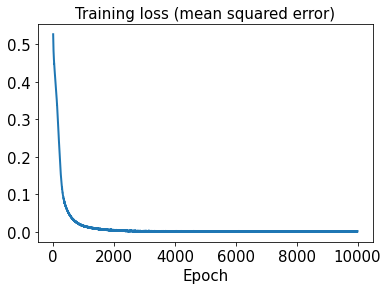

In [29]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

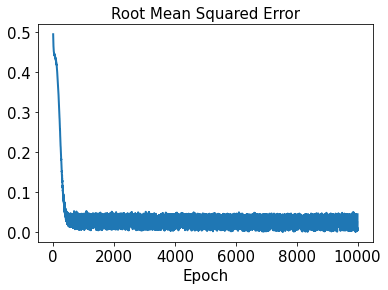

In [30]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [31]:
test_results1 = sd1.evaluate(x_test1)

1/1 [==============================] - 0s 105ms/step - loss: 3.7058e-06 - rmse: 0.0000e+00


In [32]:
decoded_sensor_train1 = sensor_pred1.predict(t_train)

In [33]:
decoded_sensor_test1 = sensor_pred1.predict(t_test)

In [34]:
decoded_train1 = sd1.predict(decoded_sensor_train1)

In [35]:
decoded_test1 = sd1.predict(decoded_sensor_test1)

In [36]:
error_train_abs1 = np.abs(decoded_train1 - y_train1)

In [37]:
error_test_abs1 = np.abs(decoded_test1 - y_test1)

In [38]:
l2_error_train1 = np.sqrt(np.sum((decoded_train1 - y_train1)**2) / np.sum(y_train1**2))
print(l2_error_train1)

0.13109312330194492


In [39]:
l2_error_test1 = np.sqrt(np.sum((decoded_test1 - y_test1)**2) / np.sum(y_test1**2))
print(l2_error_test1)

0.14913321021991477


In [40]:
l2_error_train_list1 = []
for i in range(0, len(x_train1)):
    l2_error_train_data1 = np.sqrt(np.sum((decoded_train1[i] - y_train1[i])**2) / np.sum(y_train1[i]**2))
    l2_error_train_list1.append(l2_error_train_data1)
print(l2_error_train_list1)

[0.05798987667181515, 0.18868843442760386, 0.004600268020246511, 0.130622008834598, 0.009282089205357594, 0.16741542193804554, 0.08118115947313903, 0.11582740166138189, 0.040500961937048365, 0.17626218513096037, 0.1558255767870173, 0.10841450967432578, 0.04454511870215819, 0.18359275327392843, 0.14418344417359774, 0.12584473204855576, 0.0769836256612796, 0.001709286217219187, 0.14331122767514126, 0.09626224306851346, 0.21795326464806428, 0.15974509922916658, 0.19699265173807218, 0.002514614832000015, 0.13568121108039452, 0.1563867418940664, 0.0018423568688863998, 0.0018221986682905715, 0.0020040165951439068, 0.1844968956454572, 0.09917670148145492, 0.06673855771052414, 0.23771024060768972]


In [41]:
l2_error_test_list1 = []
for i in range(0, len(x_test1)):
    l2_error_test_data1 = np.sqrt(np.sum((decoded_test1[i] - y_test1[i])**2) / np.sum(y_test1[i]**2))
    l2_error_test_list1.append(l2_error_test_data1)
print(l2_error_test_list1)

[0.0039092472338200755, 0.11564091373823149, 0.1767222315040629, 0.0060805078017687935, 0.17384137023459845, 0.27788292089443944, 0.00284006077599955, 0.2576874688938079]


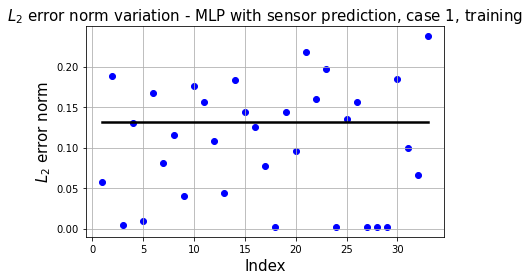

In [42]:
plt.plot(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train1*np.ones(x_train1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

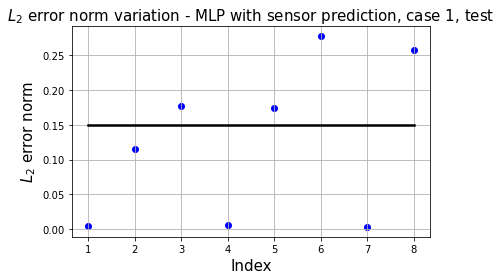

In [43]:
plt.plot(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test1*np.ones(x_test1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

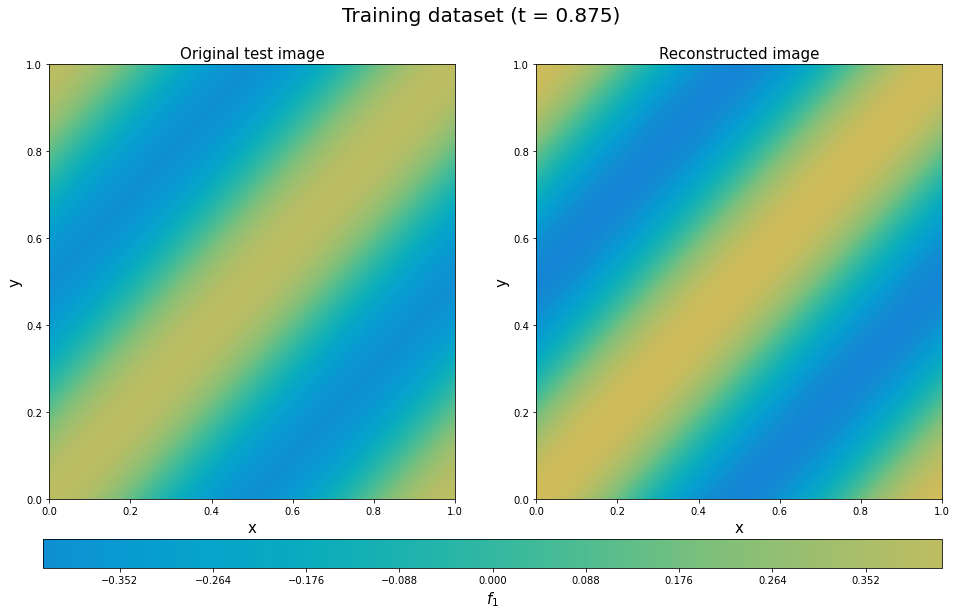

In [44]:
plt.figure(figsize=(16, 8))
y_train1_9_rotate = y_train1[9].T.reshape(101,101)
decoded_rotate1 = decoded_train1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_9_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[35]),fontsize=20)
plt.show()

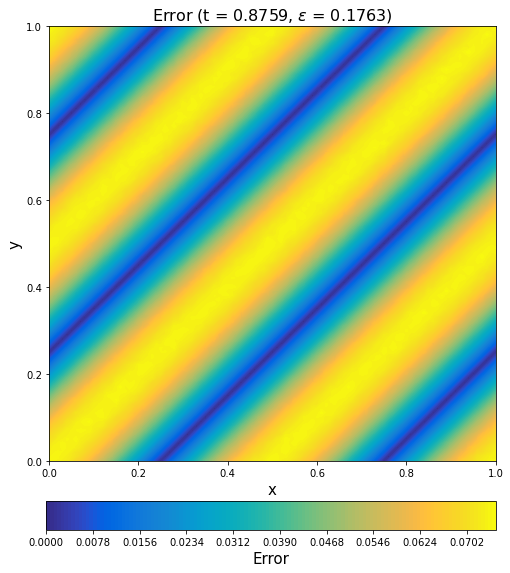

In [45]:
error_train_abs1_rotate9 = error_train_abs1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate9, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.8759, $\epsilon$ = %.4f)' %(l2_error_train_list1[9]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

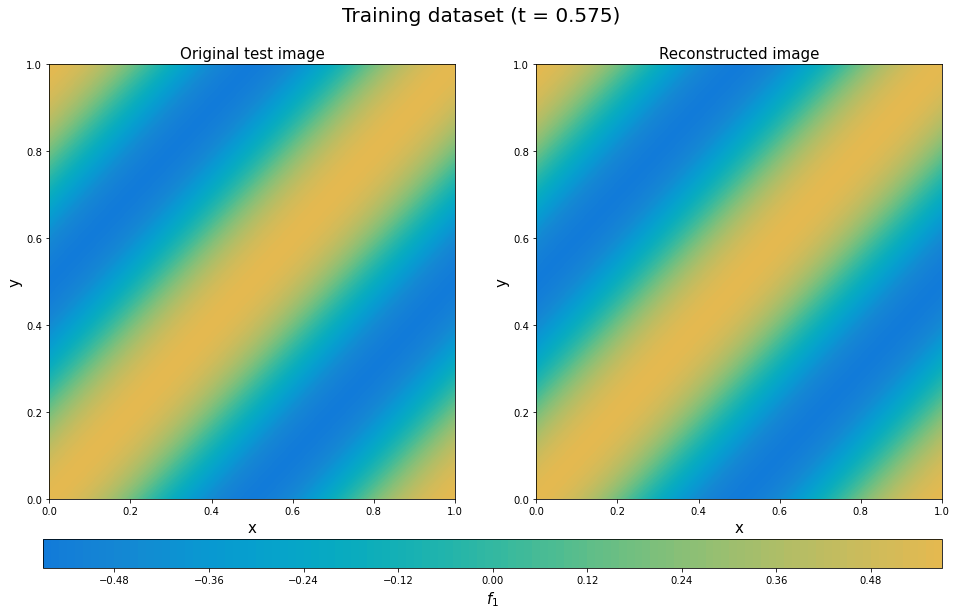

In [46]:
plt.figure(figsize=(16, 8))
y_train1_23_rotate = y_train1[23].T.reshape(101,101)
decoded_rotate1 = decoded_train1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_23_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[23]), fontsize=20)
plt.show()

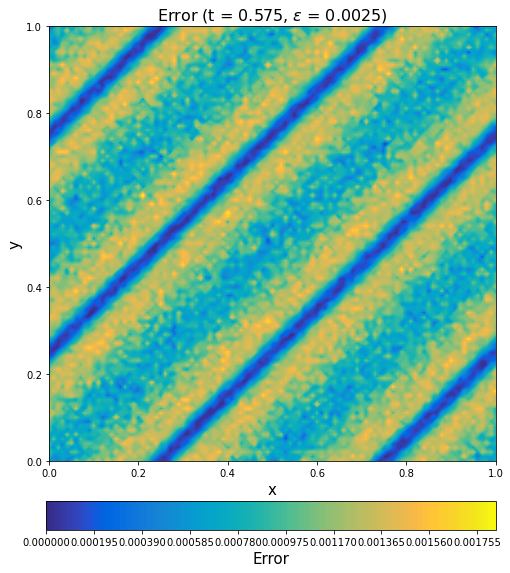

In [47]:
error_train_abs1_rotate23 = error_train_abs1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate23, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.575, $\epsilon$ = %.4f)' %(l2_error_train_list1[23]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

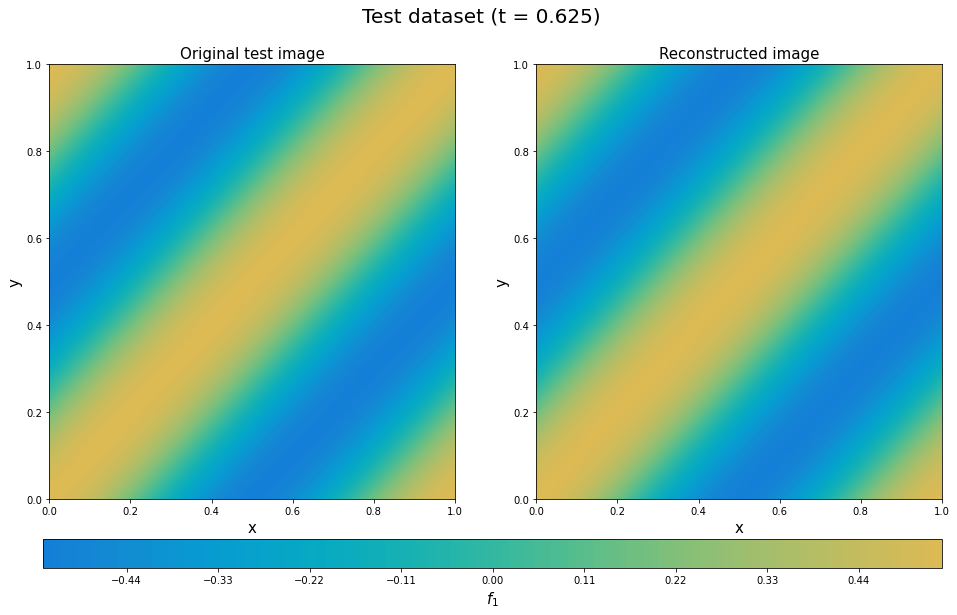

In [48]:
plt.figure(figsize=(16, 8))
y_test1_3_rotate = y_test1[3].T.reshape(101,101)
decoded_rotate1 = decoded_test1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_3_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[25]),fontsize=20)
plt.show()

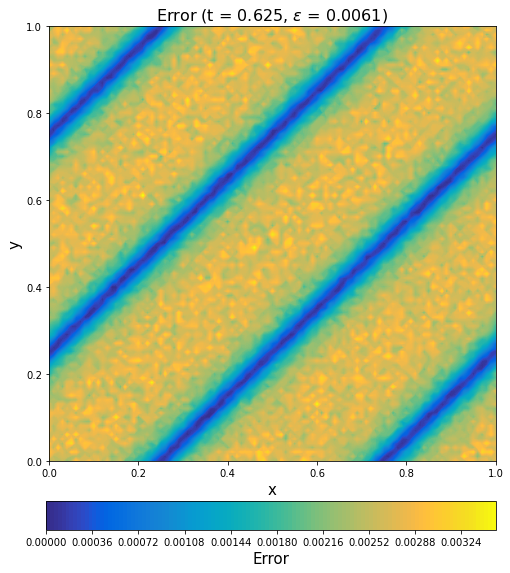

In [49]:
error_test_abs1_rotate3 = error_test_abs1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate3, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.625, $\epsilon$ = %.4f)' %(l2_error_test_list1[3]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

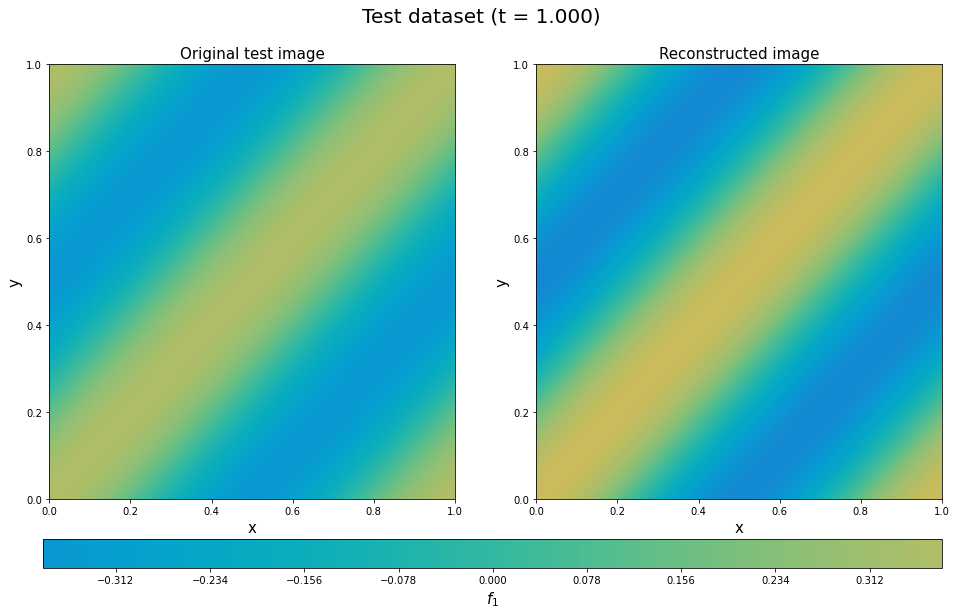

In [50]:
plt.figure(figsize=(16, 8))
y_test1_5_rotate = y_test1[5].T.reshape(101,101)
decoded_rotate1 = decoded_test1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_5_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[40]),fontsize=20)
plt.show()

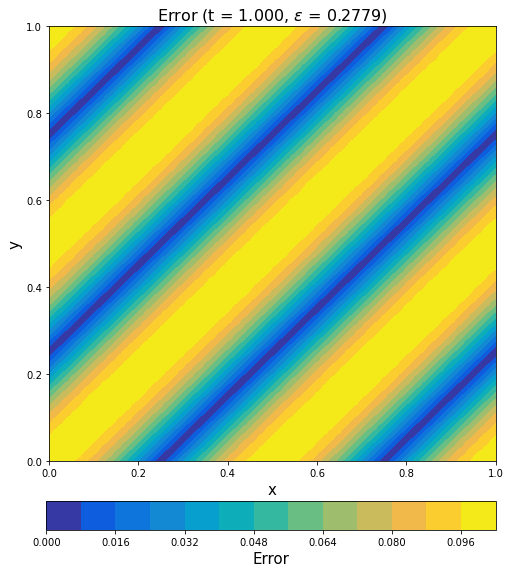

In [51]:
error_test_abs1_rotate5 = error_test_abs1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate5, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 1.000, $\epsilon$ = %.4f)' %(l2_error_test_list1[5]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 2: f2

In [52]:
out2 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out2[i, j, k] = x[j] + y[k] + t[i]

In [53]:
sensor2 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor2[i, j, k] = out2[i, 20*(j+1)+1, 20*(k+1)+1]

In [54]:
sensor2 = sensor2.reshape((41, 16, 1))

In [55]:
sensor2.shape

(41, 16, 1)

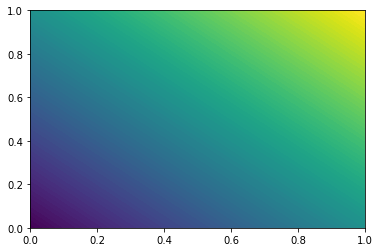

In [56]:
plt.contourf(xmesh, ymesh, out2[0,:,:], levels=128)

In [57]:
x_train2, x_test2, y_train2, y_test2, t_train, t_test = train_test_split(sensor2, out2, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [58]:
x_train2

array([[[1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945],
        [1.545],
        [1.745],
        [1.945],
        [2.145],
        [1.745],
        [1.945],
        [2.145],
        [2.345]],

       [[0.57 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.77 ]],

       [[1.07 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [2.27 ]],

       [[0.72 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [1.52 ],
        [1.12 ],
        [1.32 ],
        

In [59]:
x_test2

array([[[1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [2.22 ]],

       [[0.745],
        [0.945],
        [1.145],
        [1.345],
        [0.945],
        [1.145],
        [1.345],
        [1.545],
        [1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945]],

       [[0.62 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ]],

       [[1.045],
        [1.245],
        [1.445],
        [1.645],
        [1.245],
        [1.445],
        [1.645],
        [1.845],
        [1.445],
        [1.645],
        

In [60]:
sensor_pred2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [61]:
start2 = datetime.datetime.now()
history2 = sensor_pred2.fit(t_train, x_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 14ms/step - loss: 2.5878 - rmse: 1.6085
Epoch 2/10000
2/2 [==============================] - 0s 20ms/step - loss: 2.5811 - rmse: 1.6064
Epoch 3/10000
2/2 [==============================] - 0s 32ms/step - loss: 2.5767 - rmse: 1.6050
Epoch 4/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5715 - rmse: 1.6034
Epoch 5/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5660 - rmse: 1.6017
Epoch 6/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5614 - rmse: 1.6002
Epoch 7/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5572 - rmse: 1.5989
Epoch 8/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5528 - rmse: 1.5976
Epoch 9/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5480 - rmse: 1.5960
Epoch 10/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.5440 - rmse: 1.5948
Epoch 11/10000
2/2 [=====================

Epoch 86/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3017 - rmse: 1.5170
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2989 - rmse: 1.5160
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2991 - rmse: 1.5161
Epoch 89/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2936 - rmse: 1.5143
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2924 - rmse: 1.5139
Epoch 91/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2907 - rmse: 1.5133
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2857 - rmse: 1.5117
Epoch 93/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2874 - rmse: 1.5122
Epoch 94/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2818 - rmse: 1.5104
Epoch 95/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2782 - rmse: 1.5092
Epoch 96/10000
2/2 [==================

2/2 [==============================] - 0s 11ms/step - loss: 1.8951 - rmse: 1.3764
Epoch 254/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8927 - rmse: 1.3755
Epoch 255/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8906 - rmse: 1.3748
Epoch 256/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8909 - rmse: 1.3749
Epoch 257/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8919 - rmse: 1.3752
Epoch 258/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8859 - rmse: 1.3731
Epoch 259/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8820 - rmse: 1.3716
Epoch 260/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8837 - rmse: 1.3723
Epoch 261/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8784 - rmse: 1.3704
Epoch 262/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8758 - rmse: 1.3694
Epoch 263/10000
2/2 [================

2/2 [==============================] - 0s 11ms/step - loss: 1.5375 - rmse: 1.2397
Epoch 420/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5350 - rmse: 1.2387
Epoch 421/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5338 - rmse: 1.2382
Epoch 422/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5301 - rmse: 1.2368
Epoch 423/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5295 - rmse: 1.2365
Epoch 424/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5292 - rmse: 1.2364
Epoch 425/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5237 - rmse: 1.2341
Epoch 426/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5216 - rmse: 1.2333
Epoch 427/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5200 - rmse: 1.2326
Epoch 428/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5248 - rmse: 1.2346
Epoch 429/10000
2/2 [================

2/2 [==============================] - 0s 11ms/step - loss: 1.2057 - rmse: 1.0978
Epoch 586/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1994 - rmse: 1.0949
Epoch 587/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1946 - rmse: 1.0927
Epoch 588/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1928 - rmse: 1.0919
Epoch 589/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1921 - rmse: 1.0916
Epoch 590/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1890 - rmse: 1.0902
Epoch 591/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1869 - rmse: 1.0892
Epoch 592/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1869 - rmse: 1.0892
Epoch 593/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1854 - rmse: 1.0885
Epoch 594/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1874 - rmse: 1.0894
Epoch 595/10000
2/2 [================

2/2 [==============================] - 0s 11ms/step - loss: 0.8853 - rmse: 0.9406
Epoch 752/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8826 - rmse: 0.9392
Epoch 753/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8855 - rmse: 0.9407
Epoch 754/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8807 - rmse: 0.9382
Epoch 755/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8797 - rmse: 0.9376
Epoch 756/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8771 - rmse: 0.9362
Epoch 757/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8739 - rmse: 0.9345
Epoch 758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8752 - rmse: 0.9353
Epoch 759/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8740 - rmse: 0.9346
Epoch 760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8681 - rmse: 0.9314
Epoch 761/10000
2/2 [=================

2/2 [==============================] - 0s 12ms/step - loss: 0.6209 - rmse: 0.7876
Epoch 918/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6174 - rmse: 0.7854
Epoch 919/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6170 - rmse: 0.7852
Epoch 920/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6162 - rmse: 0.7847
Epoch 921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6153 - rmse: 0.7841
Epoch 922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6105 - rmse: 0.7810
Epoch 923/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6059 - rmse: 0.7780
Epoch 924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6042 - rmse: 0.7770
Epoch 925/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6103 - rmse: 0.7809
Epoch 926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6065 - rmse: 0.7784
Epoch 927/10000
2/2 [================

2/2 [==============================] - 0s 9ms/step - loss: 0.4002 - rmse: 0.6322
Epoch 1084/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3983 - rmse: 0.6307
Epoch 1085/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4007 - rmse: 0.6326
Epoch 1086/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3993 - rmse: 0.6315
Epoch 1087/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3948 - rmse: 0.6279
Epoch 1088/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3942 - rmse: 0.6274
Epoch 1089/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3931 - rmse: 0.6265
Epoch 1090/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3949 - rmse: 0.6280
Epoch 1091/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3939 - rmse: 0.6272
Epoch 1092/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3928 - rmse: 0.6263
Epoch 1093/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.3150 - rmse: 0.5607
Epoch 1167/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3137 - rmse: 0.5596
Epoch 1168/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3172 - rmse: 0.5628
Epoch 1169/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3163 - rmse: 0.5619
Epoch 1170/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3168 - rmse: 0.5624
Epoch 1171/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3146 - rmse: 0.5604
Epoch 1172/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3131 - rmse: 0.5591
Epoch 1173/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3130 - rmse: 0.5590
Epoch 1174/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3081 - rmse: 0.5546
Epoch 1175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3072 - rmse: 0.5538
Epoch 1176/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.2512 - rmse: 0.5007
Epoch 1250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2437 - rmse: 0.4931
Epoch 1251/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2447 - rmse: 0.4941
Epoch 1252/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2475 - rmse: 0.4969
Epoch 1253/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2452 - rmse: 0.4947
Epoch 1254/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2400 - rmse: 0.4894
Epoch 1255/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2416 - rmse: 0.4910
Epoch 1256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2383 - rmse: 0.4876
Epoch 1257/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2375 - rmse: 0.4868
Epoch 1258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2377 - rmse: 0.4870
Epoch 1259/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.1896 - rmse: 0.4348
Epoch 1333/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1853 - rmse: 0.4299
Epoch 1334/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1853 - rmse: 0.4298
Epoch 1335/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1828 - rmse: 0.4270
Epoch 1336/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1858 - rmse: 0.4304
Epoch 1337/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1822 - rmse: 0.4262
Epoch 1338/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1825 - rmse: 0.4266
Epoch 1339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1833 - rmse: 0.4276
Epoch 1340/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1796 - rmse: 0.4232
Epoch 1341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1817 - rmse: 0.4257
Epoch 1342/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.1395 - rmse: 0.3728
Epoch 1416/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1434 - rmse: 0.3781
Epoch 1417/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1381 - rmse: 0.3710
Epoch 1418/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1400 - rmse: 0.3735
Epoch 1419/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1425 - rmse: 0.3768
Epoch 1420/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1376 - rmse: 0.3702
Epoch 1421/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1350 - rmse: 0.3667
Epoch 1422/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1374 - rmse: 0.3700
Epoch 1423/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1340 - rmse: 0.3654
Epoch 1424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1388 - rmse: 0.3718
Epoch 1425/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.1015 - rmse: 0.3178
Epoch 1499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1047 - rmse: 0.3229
Epoch 1500/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1042 - rmse: 0.3221
Epoch 1501/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1005 - rmse: 0.3162
Epoch 1502/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1074 - rmse: 0.3269
Epoch 1503/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1003 - rmse: 0.3159
Epoch 1504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1016 - rmse: 0.3180
Epoch 1505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1054 - rmse: 0.3239
Epoch 1506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1035 - rmse: 0.3210
Epoch 1507/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0990 - rmse: 0.3138
Epoch 1508/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0751 - rmse: 0.2731
Epoch 1582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0737 - rmse: 0.2705
Epoch 1583/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0753 - rmse: 0.2735
Epoch 1584/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0737 - rmse: 0.2705
Epoch 1585/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0757 - rmse: 0.2741
Epoch 1586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0773 - rmse: 0.2772
Epoch 1587/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0712 - rmse: 0.2658
Epoch 1588/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0728 - rmse: 0.2689
Epoch 1589/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0714 - rmse: 0.2663
Epoch 1590/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0717 - rmse: 0.2668
Epoch 1591/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0569 - rmse: 0.2375
Epoch 1665/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0538 - rmse: 0.2309
Epoch 1666/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0555 - rmse: 0.2346
Epoch 1667/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0510 - rmse: 0.2246
Epoch 1668/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0507 - rmse: 0.2241
Epoch 1669/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0483 - rmse: 0.2187
Epoch 1670/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0495 - rmse: 0.2214
Epoch 1671/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0497 - rmse: 0.2217
Epoch 1672/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0483 - rmse: 0.2186
Epoch 1673/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0479 - rmse: 0.2177
Epoch 1674/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0375 - rmse: 0.1923
Epoch 1748/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0395 - rmse: 0.1976
Epoch 1749/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0387 - rmse: 0.1955
Epoch 1750/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0354 - rmse: 0.1868
Epoch 1751/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0406 - rmse: 0.2003
Epoch 1752/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0342 - rmse: 0.1837
Epoch 1753/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0357 - rmse: 0.1875
Epoch 1754/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0350 - rmse: 0.1858
Epoch 1755/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0323 - rmse: 0.1784
Epoch 1756/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0329 - rmse: 0.1799
Epoch 1757/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0285 - rmse: 0.1674
Epoch 1831/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0227 - rmse: 0.1490
Epoch 1832/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0282 - rmse: 0.1665
Epoch 1833/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0274 - rmse: 0.1640
Epoch 1834/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0222 - rmse: 0.1475
Epoch 1835/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0239 - rmse: 0.1530
Epoch 1836/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0277 - rmse: 0.1651
Epoch 1837/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0233 - rmse: 0.1511
Epoch 1838/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0254 - rmse: 0.1578
Epoch 1839/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0278 - rmse: 0.1654
Epoch 1840/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0167 - rmse: 0.1272
Epoch 1914/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0178 - rmse: 0.1316
Epoch 1915/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0176 - rmse: 0.1307
Epoch 1916/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0156 - rmse: 0.1228
Epoch 1917/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0135 - rmse: 0.1142
Epoch 1918/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0134 - rmse: 0.1137
Epoch 1919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0139 - rmse: 0.1156
Epoch 1920/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0163 - rmse: 0.1257
Epoch 1921/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0149 - rmse: 0.1200
Epoch 1922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0137 - rmse: 0.1148
Epoch 1923/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0951
Epoch 1997/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0123 - rmse: 0.1086
Epoch 1998/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0108 - rmse: 0.1018
Epoch 1999/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0910
Epoch 2000/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0140 - rmse: 0.1161
Epoch 2001/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0108 - rmse: 0.1017
Epoch 2002/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0117 - rmse: 0.1059
Epoch 2003/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0139 - rmse: 0.1159
Epoch 2004/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0131 - rmse: 0.1122
Epoch 2005/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0130 - rmse: 0.1121
Epoch 2006/10000
2/2 [======

2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0834
Epoch 2080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0102 - rmse: 0.0988
Epoch 2081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0718
Epoch 2082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0716
Epoch 2083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0713
Epoch 2084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0122 - rmse: 0.1082
Epoch 2085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0928
Epoch 2086/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0085 - rmse: 0.0898
Epoch 2087/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0748
Epoch 2088/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0054 - rmse: 0.0699
Epoch 2089/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0483
Epoch 2246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0687
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0415
Epoch 2248/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0686
Epoch 2249/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0650
Epoch 2250/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0584
Epoch 2251/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0591
Epoch 2252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0910
Epoch 2253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0414
Epoch 2254/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0057 - rmse: 0.0725
Epoch 2255/10000
2/2 [============

2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0851
Epoch 2412/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0417
Epoch 2413/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0266
Epoch 2414/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0415
Epoch 2415/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0650
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0369
Epoch 2417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0414
Epoch 2418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0516
Epoch 2419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0260
Epoch 2420/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0264
Epoch 2421/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 8.3510e-04 - rmse: 0.0196
Epoch 2576/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0153e-04 - rmse: 0.0158
Epoch 2577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0794
Epoch 2578/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0388
Epoch 2579/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0486
Epoch 2580/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0689
Epoch 2581/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0240
Epoch 2582/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.0743e-04 - rmse: 0.0189
Epoch 2583/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0883
Epoch 2584/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.3105e-04 - rmse: 0.0167
Epoch 2585/10000


2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0793
Epoch 2740/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0679
Epoch 2741/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0795
Epoch 2742/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0892
Epoch 2743/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0642
Epoch 2744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0250
Epoch 2745/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0462
Epoch 2746/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0673
Epoch 2747/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6565e-04 - rmse: 0.0229
Epoch 2748/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0393
Epoch 2749/10000
2/2 [======

Epoch 2822/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0574
Epoch 2823/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6750e-04 - rmse: 0.0207
Epoch 2824/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1257e-04 - rmse: 0.0193
Epoch 2825/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0703
Epoch 2826/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0466
Epoch 2827/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0379
Epoch 2828/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0620
Epoch 2829/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0249
Epoch 2830/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0708
Epoch 2831/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0256
Epoch 2

2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0636
Epoch 2987/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7179e-04 - rmse: 0.0064
Epoch 2988/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0869
Epoch 2989/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0724
Epoch 2990/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0592
Epoch 2991/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0384
Epoch 2992/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0636
Epoch 2993/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0547
Epoch 2994/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4842e-04 - rmse: 0.0043
Epoch 2995/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0459
Epoch 2996/10000
2/2 [

2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0502
Epoch 3151/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7378e-04 - rmse: 0.0187
Epoch 3152/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4427e-04 - rmse: 0.0228
Epoch 3153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0756
Epoch 3154/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0671
Epoch 3155/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0843
Epoch 3156/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0748
Epoch 3157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0509
Epoch 3158/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0837
Epoch 3159/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0540
Epoch 3160/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0735
Epoch 3315/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0607
Epoch 3316/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0476
Epoch 3317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0681
Epoch 3318/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0684
Epoch 3319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0385
Epoch 3320/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0725
Epoch 3321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0262
Epoch 3322/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6057e-04 - rmse: 0.0121
Epoch 3323/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0817
Epoch 3324/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0810
Epoch 3479/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0518
Epoch 3480/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0796
Epoch 3481/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0626
Epoch 3482/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0513
Epoch 3483/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0850
Epoch 3484/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0794
Epoch 3485/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0594
Epoch 3486/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0889
Epoch 3487/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0663
Epoch 3488/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0727
Epoch 3643/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0683
Epoch 3644/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0417
Epoch 3645/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0504
Epoch 3646/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0679
Epoch 3647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0341
Epoch 3648/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0383
Epoch 3649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0681
Epoch 3650/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0382
Epoch 3651/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3120e-04 - rmse: 0.0152
Epoch 3652/10000
2/2 [====

2/2 [==============================] - 0s 8ms/step - loss: 8.6521e-04 - rmse: 0.0218
Epoch 3807/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6767e-04 - rmse: 0.0218
Epoch 3808/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0610
Epoch 3809/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0451
Epoch 3810/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0566
Epoch 3811/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0255
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0252
Epoch 3813/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0622
Epoch 3814/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4079e-04 - rmse: 0.0158
Epoch 3815/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0794
Epoch 3816/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0795
Epoch 3971/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.8943e-04 - rmse: 0.0246
Epoch 3972/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0562
Epoch 3973/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8771e-04 - rmse: 0.0201
Epoch 3974/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0402
Epoch 3975/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0648
Epoch 3976/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0646
Epoch 3977/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0832
Epoch 3978/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0475
Epoch 3979/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0514
Epoch 3980/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0463
Epoch 4135/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0844
Epoch 4136/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6509e-04 - rmse: 0.0197
Epoch 4137/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0372
Epoch 4138/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0669
Epoch 4139/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0789
Epoch 4140/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0488
Epoch 4141/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0488
Epoch 4142/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0654
Epoch 4143/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0695
Epoch 4144/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0774
Epoch 4299/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0611
Epoch 4300/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0511
Epoch 4301/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.6715e-04 - rmse: 0.0140
Epoch 4302/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0876
Epoch 4303/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0509
Epoch 4304/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8724e-04 - rmse: 0.0147
Epoch 4305/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0348
Epoch 4306/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0742
Epoch 4307/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0773
Epoch 4308/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0428
Epoch 4381/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0272
Epoch 4382/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0273
Epoch 4383/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.4026e-04 - rmse: 0.0131
Epoch 4384/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.4430e-04 - rmse: 0.0133
Epoch 4385/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0347
Epoch 4386/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0647
Epoch 4387/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7051e-04 - rmse: 0.0142
Epoch 4388/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0744
Epoch 4389/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0776
Epoch 4390/10000
2/2

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0459
Epoch 4545/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2915e-04 - rmse: 0.0082
Epoch 4546/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.0005e-04 - rmse: 0.0209
Epoch 4547/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8208e-04 - rmse: 0.0045
Epoch 4548/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0384
Epoch 4549/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0604
Epoch 4550/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0648
Epoch 4551/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0681
Epoch 4552/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0559
Epoch 4553/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0603
Epoch 4554/10000
2

2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0783
Epoch 4709/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0693
Epoch 4710/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0475
Epoch 4711/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0447
Epoch 4712/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0347
Epoch 4713/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0355
Epoch 4714/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0730
Epoch 4715/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0399
Epoch 4716/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0297
Epoch 4717/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0612
Epoch 4718/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0768
Epoch 4792/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0546
Epoch 4793/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0723
Epoch 4794/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.9552e-04 - rmse: 0.0254
Epoch 4795/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.7116e-04 - rmse: 0.0043
Epoch 4796/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0605
Epoch 4797/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.2096e-04 - rmse: 0.0164
Epoch 4798/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6506e-04 - rmse: 0.0035
Epoch 4799/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.7140e-04 - rmse: 0.0109
Epoch 4800/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9770e-04 - rmse: 0.0067
Epoch 4801/10

2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0429
Epoch 4956/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0782
Epoch 4957/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8701e-04 - rmse: 0.0210
Epoch 4958/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0559
Epoch 4959/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0813
Epoch 4960/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0416
Epoch 4961/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6543e-04 - rmse: 0.0043
Epoch 4962/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0738
Epoch 4963/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0825
Epoch 4964/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0592
Epoch 4965/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0680
Epoch 5120/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0826
Epoch 5121/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0504
Epoch 5122/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0416
Epoch 5123/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0429
Epoch 5124/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0373
Epoch 5125/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0561
Epoch 5126/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8069e-04 - rmse: 0.0063
Epoch 5127/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0287
Epoch 5128/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0606
Epoch 5129/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0339
Epoch 5284/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0825
Epoch 5285/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0471
Epoch 5286/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0559
Epoch 5287/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0868
Epoch 5288/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0372
Epoch 5289/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5573e-04 - rmse: 0.0046
Epoch 5290/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0605
Epoch 5291/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0594
Epoch 5292/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0770
Epoch 5293/10000
2/2 [====

2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0268
Epoch 5448/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7973e-04 - rmse: 0.0235
Epoch 5449/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0462
Epoch 5450/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0888
Epoch 5451/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0886
Epoch 5452/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0518
Epoch 5453/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0542
Epoch 5454/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0544
Epoch 5455/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0469
Epoch 5456/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0766
Epoch 5457/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0726
Epoch 5612/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0386
Epoch 5613/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0649
Epoch 5614/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0472
Epoch 5615/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.4540e-04 - rmse: 0.0205
Epoch 5616/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0595
Epoch 5617/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0871
Epoch 5618/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0474
Epoch 5619/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0606
Epoch 5620/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0427
Epoch 5621/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0364
Epoch 5776/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0876
Epoch 5777/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0745
Epoch 5778/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0518
Epoch 5779/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0435
Epoch 5780/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0779
Epoch 5781/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0791
Epoch 5782/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0489
Epoch 5783/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0648
Epoch 5784/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0835
Epoch 5785/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 5.9465e-04 - rmse: 0.0168
Epoch 5940/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5204e-04 - rmse: 0.0118
Epoch 5941/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0384
Epoch 5942/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0592
Epoch 5943/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0549
Epoch 5944/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0342
Epoch 5945/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0605
Epoch 5946/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0682
Epoch 5947/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0636
Epoch 5948/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0288
Epoch 5949/10000
2/2 [

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0353
Epoch 6104/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0484
Epoch 6105/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0821
Epoch 6106/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0381
Epoch 6107/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0656
Epoch 6108/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0455
Epoch 6109/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0277
Epoch 6110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0287
Epoch 6111/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0662
Epoch 6112/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0422
Epoch 6113/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0890
Epoch 6268/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0472
Epoch 6269/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8789e-04 - rmse: 0.0220
Epoch 6270/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0477
Epoch 6271/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0802
Epoch 6272/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0896
Epoch 6273/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0443
Epoch 6274/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0770
Epoch 6275/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0718
Epoch 6276/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0400
Epoch 6277/10000
2/2 [====

2/2 [==============================] - 0s 11ms/step - loss: 7.8436e-04 - rmse: 0.0221
Epoch 6432/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0554
Epoch 6433/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0818
Epoch 6434/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0390
Epoch 6435/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5958e-04 - rmse: 0.0190
Epoch 6436/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0651
Epoch 6437/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0291
Epoch 6438/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0476
Epoch 6439/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0376
Epoch 6440/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0550
Epoch 6441/10000
2/2 

2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0371
Epoch 6595/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2281e-04 - rmse: 0.0114
Epoch 6596/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.2674e-04 - rmse: 0.0208
Epoch 6597/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0471
Epoch 6598/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6867e-04 - rmse: 0.0087
Epoch 6599/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0459
Epoch 6600/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0769
Epoch 6601/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0427
Epoch 6602/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0559
Epoch 6603/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0635
Epoch 6604/10000
2

2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0282
Epoch 6759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0591
Epoch 6760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0460
Epoch 6761/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0474
Epoch 6762/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0287
Epoch 6763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0683
Epoch 6764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0551
Epoch 6765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0828
Epoch 6766/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0512
Epoch 6767/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0728
Epoch 6768/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0657
Epoch 6923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0601
Epoch 6924/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0876
Epoch 6925/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6570e-04 - rmse: 0.0135
Epoch 6926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0787
Epoch 6927/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0831
Epoch 6928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0427
Epoch 6929/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0686
Epoch 6930/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0653
Epoch 6931/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0687e-04 - rmse: 0.0150
Epoch 6932/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0273
Epoch 7087/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0819
Epoch 7088/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0570
Epoch 7089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0570
Epoch 7090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0654
Epoch 7091/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0479
Epoch 7092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0642
Epoch 7093/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0347
Epoch 7094/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.8520e-04 - rmse: 0.0144
Epoch 7095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0431    
Epoch 7096/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 3.1054e-04 - rmse: 0.0061
Epoch 7251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0825
Epoch 7252/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0078 - rmse: 0.0869
Epoch 7253/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0825
Epoch 7254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0725
Epoch 7255/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0780
Epoch 7256/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0283
Epoch 7257/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8714e-04 - rmse: 0.0107
Epoch 7258/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0814
Epoch 7259/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0812
Epoch 7260/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0463
Epoch 7415/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2195e-04 - rmse: 0.0124
Epoch 7416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0607
Epoch 7417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0563
Epoch 7418/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0561
Epoch 7419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0550
Epoch 7420/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0430
Epoch 7421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0593
Epoch 7422/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0549
Epoch 7423/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0781
Epoch 7424/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 9.4780e-04 - rmse: 0.0262
Epoch 7579/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0378
Epoch 7580/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0739
Epoch 7581/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3500e-04 - rmse: 0.0259
Epoch 7582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0289
Epoch 7583/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0162e-04 - rmse: 0.0062
Epoch 7584/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0773e-04 - rmse: 0.0120
Epoch 7585/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0815
Epoch 7586/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4154e-04 - rmse: 0.0219
Epoch 7587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0814
Epoch 7588/10000


2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0831
Epoch 7743/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0470
Epoch 7744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0436
Epoch 7745/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0598
Epoch 7746/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4021e-04 - rmse: 0.0135
Epoch 7747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0874
Epoch 7748/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0338
Epoch 7749/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0651
Epoch 7750/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0827
Epoch 7751/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2737e-04 - rmse: 0.0217
Epoch 7752/10000
2/2 [==

2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0685
Epoch 7907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0383
Epoch 7908/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2767e-04 - rmse: 0.0085
Epoch 7909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0877
Epoch 7910/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0477
Epoch 7911/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0816
Epoch 7912/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0730
Epoch 7913/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8766e-04 - rmse: 0.0231
Epoch 7914/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0379
Epoch 7915/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0613
Epoch 7916/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0687
Epoch 8071/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0348
Epoch 8072/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0653
Epoch 8073/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0566
Epoch 8074/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0772
Epoch 8075/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3494e-04 - rmse: 0.0262
Epoch 8076/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0509
Epoch 8077/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1202e-04 - rmse: 0.0079
Epoch 8078/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0564
Epoch 8079/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0346
Epoch 8080/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0551
Epoch 8235/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0427
Epoch 8236/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0286
Epoch 8237/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0648
Epoch 8238/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7592e-04 - rmse: 0.0207
Epoch 8239/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6102e-04 - rmse: 0.0039
Epoch 8240/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7499e-04 - rmse: 0.0114
Epoch 8241/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9516e-04 - rmse: 0.0122
Epoch 8242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0781
Epoch 8243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0474
Epoch 8244/1000

2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0390
Epoch 8399/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1416e-04 - rmse: 0.0217
Epoch 8400/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7921e-04 - rmse: 0.0117
Epoch 8401/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0434
Epoch 8402/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0775
Epoch 8403/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0479
Epoch 8404/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0394
Epoch 8405/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0829
Epoch 8406/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0654
Epoch 8407/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9185e-04 - rmse: 0.0158
Epoch 8408/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 4.9826e-04 - rmse: 0.0161
Epoch 8563/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0479
Epoch 8564/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0745
Epoch 8565/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0729
Epoch 8566/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0741
Epoch 8567/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0430
Epoch 8568/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0565
Epoch 8569/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0788
Epoch 8570/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0554
Epoch 8571/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0342
Epoch 8572/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0340
Epoch 8727/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0876
Epoch 8728/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0299
Epoch 8729/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5342e-04 - rmse: 0.0148
Epoch 8730/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8688e-04 - rmse: 0.0124
Epoch 8731/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8977e-04 - rmse: 0.0125
Epoch 8732/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0427
Epoch 8733/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4320e-04 - rmse: 0.0145
Epoch 8734/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5161e-04 - rmse: 0.0148
Epoch 8735/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0426
Epoch 8736/

2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0407
Epoch 8809/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0737
Epoch 8810/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6720e-04 - rmse: 0.0154
Epoch 8811/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0489
Epoch 8812/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0648
Epoch 8813/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0835
Epoch 8814/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0746
Epoch 8815/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0876
Epoch 8816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0393
Epoch 8817/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0300
Epoch 8818/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0736
Epoch 8973/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0813
Epoch 8974/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0347
Epoch 8975/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5595e-04 - rmse: 0.0207
Epoch 8976/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0563
Epoch 8977/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0771
Epoch 8978/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0407e-04 - rmse: 0.0133
Epoch 8979/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9688e-04 - rmse: 0.0164
Epoch 8980/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0559
Epoch 8981/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0594
Epoch 8982/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0600
Epoch 9137/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0436
Epoch 9138/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0466
Epoch 9139/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0829
Epoch 9140/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0772
Epoch 9141/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0382
Epoch 9142/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0389
Epoch 9143/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0334
Epoch 9144/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0686
Epoch 9145/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0475
Epoch 9146/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 4.3669e-04 - rmse: 0.0147
Epoch 9301/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0357e-04 - rmse: 0.0261
Epoch 9302/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0641
Epoch 9303/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0785
Epoch 9304/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0389
Epoch 9305/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.1844e-04 - rmse: 0.0264
Epoch 9306/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0419
Epoch 9307/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0596
Epoch 9308/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0889e-04 - rmse: 0.0094
Epoch 9309/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0782
Epoch 9310/10000


2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0679
Epoch 9465/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7209e-04 - rmse: 0.0125
Epoch 9466/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0560
Epoch 9467/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7344e-04 - rmse: 0.0076
Epoch 9468/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0724
Epoch 9469/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0736
Epoch 9470/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.9092e-04 - rmse: 0.0218
Epoch 9471/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7592e-04 - rmse: 0.0077
Epoch 9472/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0739
Epoch 9473/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 9474/10000

2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0506
Epoch 9629/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9913e-04 - rmse: 0.0093
Epoch 9630/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.3189e-04 - rmse: 0.0179
Epoch 9631/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0684
Epoch 9632/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0392
Epoch 9633/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0728
Epoch 9634/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0510
Epoch 9635/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0942e-04 - rmse: 0.0140
Epoch 9636/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0354
Epoch 9637/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5823e-04 - rmse: 0.0121
Epoch 9638/100

2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0356
Epoch 9793/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0482
Epoch 9794/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0403
Epoch 9795/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1889e-04 - rmse: 0.0176
Epoch 9796/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6784e-04 - rmse: 0.0236
Epoch 9797/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0492
Epoch 9798/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0372
Epoch 9799/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0577
Epoch 9800/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0833e-04 - rmse: 0.0245
Epoch 9801/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3782e-04 - rmse: 0.0230
Epoch 9802/100

2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0564
Epoch 9957/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0816
Epoch 9958/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0854e-04 - rmse: 0.0101
Epoch 9959/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9151e-04 - rmse: 0.0136
Epoch 9960/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7139e-04 - rmse: 0.0129
Epoch 9961/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0345
Epoch 9962/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0738
Epoch 9963/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0290
Epoch 9964/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0387
Epoch 9965/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0383
Epoch 9966/10000
2/

In [62]:
time2_sensor = end2 - start2
print("Training time (Case 2, sensor prediction):", time2_sensor)

Training time (Case 2, sensor prediction): 0:03:39.905780


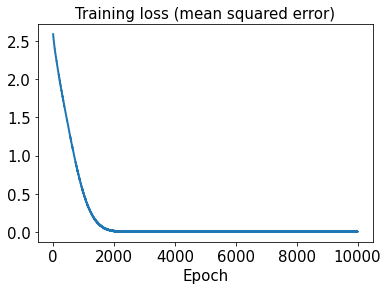

In [63]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

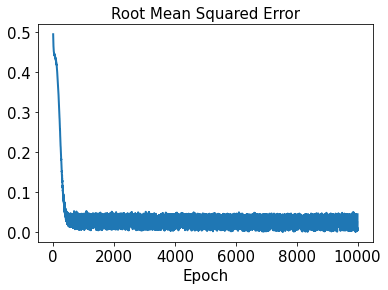

In [64]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [65]:
sd2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [66]:
start2 = datetime.datetime.now()
history2 = sd2.fit(x_train2, y_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 16ms/step - loss: 2.6800 - rmse: 1.6371
Epoch 2/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.6711 - rmse: 1.6343
Epoch 3/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6627 - rmse: 1.6318
Epoch 4/10000
2/2 [==============================] - 0s 26ms/step - loss: 2.6544 - rmse: 1.6292
Epoch 5/10000
2/2 [==============================] - 0s 25ms/step - loss: 2.6460 - rmse: 1.6267
Epoch 6/10000
2/2 [==============================] - 0s 18ms/step - loss: 2.6378 - rmse: 1.6241
Epoch 7/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6296 - rmse: 1.6216
Epoch 8/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6214 - rmse: 1.6191
Epoch 9/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6134 - rmse: 1.6166
Epoch 10/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6055 - rmse: 1.6141
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 1.4135 - rmse: 1.1889
Epoch 171/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4063 - rmse: 1.1858
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4021 - rmse: 1.1840
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3913 - rmse: 1.1795
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3862 - rmse: 1.1773
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3779 - rmse: 1.1738
Epoch 176/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3745 - rmse: 1.1724
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3631 - rmse: 1.1675
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3589 - rmse: 1.1657
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3513 - rmse: 1.1624
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.4238 - rmse: 0.6510
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4166 - rmse: 0.6454
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4161 - rmse: 0.6450
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4124 - rmse: 0.6422
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4054 - rmse: 0.6367
Epoch 343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3999 - rmse: 0.6324
Epoch 344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3945 - rmse: 0.6280
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3944 - rmse: 0.6280
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3926 - rmse: 0.6266
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3857 - rmse: 0.6210
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0744 - rmse: 0.2728
Epoch 507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0696 - rmse: 0.2637
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0665 - rmse: 0.2578
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0688 - rmse: 0.2622
Epoch 510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0649 - rmse: 0.2547
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0707 - rmse: 0.2658
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0695 - rmse: 0.2636
Epoch 513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0667 - rmse: 0.2582
Epoch 514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0686 - rmse: 0.2619
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0646 - rmse: 0.2542
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 675/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0098 - rmse: 0.0988
Epoch 676/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 677/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 678/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0917
Epoch 679/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0115 - rmse: 0.1071
Epoch 680/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 681/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0120 - rmse: 0.1094
Epoch 682/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 683/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 684/10000
2/2 [=================

2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 851/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4248e-04 - rmse: 0.0301
Epoch 852/10000
2/2 [=====================

2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 1009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 1010/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5723e-04 - rmse: 0.0180
Epoch 1011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0743
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 1017/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.0973e-04 - rmse: 0.0296
Epoch 1018/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 8.7787e-04 - rmse: 0.0291
Epoch 1173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 1174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3718e-04 - rmse: 0.0103
Epoch 1175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3283e-04 - rmse: 0.0101
Epoch 1176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1737e-04 - rmse: 0.0093
Epoch 1177/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2220e-04 - rmse: 0.0263
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5806e-04 - rmse: 0.0113
Epoch 1179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 1180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6617e-04 - rmse: 0.0154
Epoch 118

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 1255/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 1256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 1257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 1258/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2793e-04 - rmse: 0.0173
Epoch 1259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 1260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 1263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 1264/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 1419/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6907e-04 - rmse: 0.0156
Epoch 1420/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 1421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 1422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 1423/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7692e-04 - rmse: 0.0158
Epoch 1424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 1425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8216e-04 - rmse: 0.0189
Epoch 1427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 1428/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0104 - rmse: 0.1021
Epoch 1584/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 1585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 1586/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0977
Epoch 1587/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 1588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0925
Epoch 1589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 1590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 1591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 1593/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 1749/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 1750/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 1751/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 1752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0706
Epoch 1753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 1754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 1755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 1756/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1179e-04 - rmse: 0.0281
Epoch 1757/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2907e-04 - rmse: 0.0284
Epoch 1758/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 1831/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4636e-04 - rmse: 0.0111
Epoch 1832/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 1833/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 1834/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 1835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 1836/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0436e-04 - rmse: 0.0091
Epoch 1837/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 1838/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 1839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 1840/10000
2/2 [=======

Epoch 1913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 1914/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8030e-04 - rmse: 0.0293
Epoch 1915/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 1916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0849
Epoch 1917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0759
Epoch 1918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 1919/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0688
Epoch 1920/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 1921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 1922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 1923/10000

2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 2078/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.2930e-04 - rmse: 0.0225
Epoch 2079/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 2080/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2081/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 2082/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 2083/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5591e-04 - rmse: 0.0306
Epoch 2084/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2085/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0885
Epoch 2086/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 2087/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 8.6144e-04 - rmse: 0.0290
Epoch 2161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 2162/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 2163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 2164/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 2165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 2166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 2167/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3498e-04 - rmse: 0.0227
Epoch 2168/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 2169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 2170/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 2325/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 2326/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 2327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 2328/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 2329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 2330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 2331/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 2332/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0302e-04 - rmse: 0.0261
Epoch 2333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 2334/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 2489/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 2490/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 2491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0717
Epoch 2492/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 2493/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0923
Epoch 2494/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 2495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 2496/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 2497/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 2498/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 2653/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 2654/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0796
Epoch 2655/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 2656/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 2657/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 2658/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8855e-04 - rmse: 0.0277
Epoch 2659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 2660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0918
Epoch 2661/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2662/10000
2/2 [====

2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 2736/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 2737/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3432e-04 - rmse: 0.0248
Epoch 2738/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7981e-04 - rmse: 0.0257
Epoch 2739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 2740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 2741/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 2742/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 2743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 2744/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6556e-04 - rmse: 0.0273
Epoch 2745/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 2900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 2901/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 2902/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4040e-04 - rmse: 0.0205
Epoch 2903/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 2904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 2906/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 2907/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 2908/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 2909/10000
2/2 [===========

2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 3064/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 3065/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 3066/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 3067/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0776
Epoch 3068/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 3069/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0708
Epoch 3070/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 3071/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 3072/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 3073/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0106 - rmse: 0.1028
Epoch 3228/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 3229/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 3230/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0855
Epoch 3231/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 3232/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0722
Epoch 3233/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 3234/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0710
Epoch 3235/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 3236/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0764
Epoch 3237/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0917
Epoch 3311/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 3312/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 3313/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9510e-04 - rmse: 0.0240
Epoch 3314/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 3315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0757
Epoch 3316/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 3317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 3318/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 3319/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5197e-04 - rmse: 0.0153
Epoch 3320/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 3476/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 3477/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 3478/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 3479/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1961e-04 - rmse: 0.0201
Epoch 3480/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7725e-04 - rmse: 0.0215
Epoch 3481/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5749e-04 - rmse: 0.0210
Epoch 3482/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 3483/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 3484/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 3485/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 3640/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 3641/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 3642/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 3643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 3644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 3645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 3646/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9267e-04 - rmse: 0.0166
Epoch 3647/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4122e-04 - rmse: 0.0250
Epoch 3648/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 3649/10000
2/2 [====

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 3804/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 3805/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 3806/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2107e-04 - rmse: 0.0201
Epoch 3807/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0890
Epoch 3808/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0700
Epoch 3809/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 3810/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 3811/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4020e-04 - rmse: 0.0150
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0119e-04 - rmse: 0.0136
Epoch 3813/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 6.5905e-04 - rmse: 0.0254
Epoch 3968/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 3969/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 3970/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 3971/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5586e-04 - rmse: 0.0210
Epoch 3972/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 3973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 3974/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 3975/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 3976/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 3977/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 7.8320e-05 - rmse: 0.0079
Epoch 4132/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 4133/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 4134/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 4135/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.1438e-04 - rmse: 0.0245
Epoch 4136/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 4137/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 4138/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 4139/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 4140/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 4141/10000
2/2

2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 4296/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 4297/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 4298/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 4299/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 4300/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 4301/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9110e-04 - rmse: 0.0279
Epoch 4302/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 4303/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0723
Epoch 4304/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 4305/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 4460/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9270e-04 - rmse: 0.0279
Epoch 4461/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5332e-04 - rmse: 0.0209
Epoch 4462/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 4463/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8172e-04 - rmse: 0.0238
Epoch 4464/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 4465/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 4466/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4529e-04 - rmse: 0.0305
Epoch 4467/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 4468/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 4469/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4543/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 4544/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8441e-04 - rmse: 0.0239
Epoch 4545/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 4546/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 4547/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 4548/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 4549/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 4550/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 4552/10000
2/2 [===========

Epoch 4707/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 4708/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 4709/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 4710/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 4711/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9159e-05 - rmse: 0.0092
Epoch 4712/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0868
Epoch 4713/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 4714/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.7935e-04 - rmse: 0.0258
Epoch 4715/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 4716/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5269e-04 - rmse: 0.0209

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 4872/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7227e-04 - rmse: 0.0126
Epoch 4873/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0874
Epoch 4874/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4875/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 4876/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 4877/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8417e-04 - rmse: 0.0130
Epoch 4878/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1218e-04 - rmse: 0.0173
Epoch 4879/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 4880/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 4881/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 5036/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8312e-04 - rmse: 0.0130
Epoch 5037/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5983e-04 - rmse: 0.0157
Epoch 5038/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2731e-04 - rmse: 0.0106
Epoch 5039/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5040/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 5041/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 5042/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 5043/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6126e-04 - rmse: 0.0211
Epoch 5044/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 5045/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 5200/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 5201/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4330e-04 - rmse: 0.0288
Epoch 5202/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3162e-04 - rmse: 0.0109
Epoch 5203/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 5204/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 5205/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 5206/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 5207/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 5208/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5612e-04 - rmse: 0.0307
Epoch 5209/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 5364/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5365/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 5366/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6099e-04 - rmse: 0.0121
Epoch 5367/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 5368/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 5369/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2226e-04 - rmse: 0.0104
Epoch 5370/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 5371/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 5372/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0269e-04 - rmse: 0.0197
Epoch 5373/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 5528/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 5529/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 5530/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 5531/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3739e-04 - rmse: 0.0287
Epoch 5532/10000
2/2 [==============================] - 0s 17ms/step - loss: 1.6295e-04 - rmse: 0.0122
Epoch 5533/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0851e-04 - rmse: 0.0140
Epoch 5534/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 5535/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 5536/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9186e-04 - rmse: 0.0195
Epoch 5537/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 5693/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 5694/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2800e-04 - rmse: 0.0204
Epoch 5695/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 5696/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6570e-04 - rmse: 0.0188
Epoch 5697/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0989e-04 - rmse: 0.0223
Epoch 5698/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 5699/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4459e-04 - rmse: 0.0182
Epoch 5700/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4371e-04 - rmse: 0.0152
Epoch 5701/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 5702/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 5857/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 5858/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 5859/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 5860/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 5861/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 5862/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 5863/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 5864/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 5865/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 5866/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 5940/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 5941/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 5942/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 5943/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9448e-04 - rmse: 0.0261
Epoch 5944/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5945/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 5946/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 5947/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 5948/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.9935e-04 - rmse: 0.0169
Epoch 5949/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 1.7250e-04 - rmse: 0.0127
Epoch 6023/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 6024/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 6025/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2609e-04 - rmse: 0.0177
Epoch 6026/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 6027/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 6028/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 6029/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 6030/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 6031/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 6032/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 6187/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 6188/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0757
Epoch 6189/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 6190/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3879e-04 - rmse: 0.0288
Epoch 6191/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0089 - rmse: 0.0940
Epoch 6192/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 6193/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 6194/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 6195/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6196/10000
2/2 [===========

Epoch 6351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6352/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 6353/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 6354/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.6578e-04 - rmse: 0.0275
Epoch 6355/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0855
Epoch 6356/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 6357/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 6358/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6359/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1133e-04 - rmse: 0.0223
Epoch 6360/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 6361/1

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 6435/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 6436/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 6437/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 6438/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 6439/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5350e-04 - rmse: 0.0210
Epoch 6440/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8620e-04 - rmse: 0.0193
Epoch 6441/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6743e-04 - rmse: 0.0213
Epoch 6442/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 6443/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 6444/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 6599/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.3679e-05 - rmse: 0.0057
Epoch 6600/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 6601/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 6602/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.8341e-04 - rmse: 0.0217
Epoch 6603/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.5206e-04 - rmse: 0.0290
Epoch 6604/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 6605/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 6606/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 6607/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8852e-04 - rmse: 0.0313
Epoch 6608/1000

2/2 [==============================] - 0s 6ms/step - loss: 8.3811e-04 - rmse: 0.0287
Epoch 6682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 6683/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3862e-04 - rmse: 0.0113
Epoch 6684/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 6685/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 6686/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 6687/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 6688/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 6689/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7218e-04 - rmse: 0.0127
Epoch 6690/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 6691/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 1.0019e-04 - rmse: 0.0094
Epoch 6846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 6847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 6848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 6849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 6850/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 6851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 6852/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7736e-04 - rmse: 0.0277
Epoch 6853/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 6854/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 6855/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.8656e-04 - rmse: 0.0166
Epoch 7010/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8358e-05 - rmse: 0.0041
Epoch 7011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 7012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 7013/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9795e-04 - rmse: 0.0137
Epoch 7014/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 7015/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 7016/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4494e-05 - rmse: 0.0066
Epoch 7017/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7018/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4075e-04 - rmse: 0.0151
Epoch 7019/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0859
Epoch 7176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 7177/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 7178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 7179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 7180/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0721
Epoch 7181/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 7182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0716
Epoch 7183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 7184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 7185/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 7259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 7260/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 7261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 7262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 7263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 7264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 7265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 7266/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 7267/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0860
Epoch 7268/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 7425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 7426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7428/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9295e-04 - rmse: 0.0297
Epoch 7429/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6941e-04 - rmse: 0.0236
Epoch 7430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 7431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7432/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 7433/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 7434/10000
2/2 [=======

Epoch 7507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 7508/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5407e-04 - rmse: 0.0211
Epoch 7509/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3831e-05 - rmse: 0.0057
Epoch 7510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 7511/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8371e-04 - rmse: 0.0131
Epoch 7512/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8578e-04 - rmse: 0.0296
Epoch 7513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 7514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 7515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 7516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoc

2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 7673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 7674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0874
Epoch 7675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 7677/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5367e-04 - rmse: 0.0290
Epoch 7678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 7679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 7681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 7682/10000
2/2 [===========

2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 7838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0710
Epoch 7839/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 7840/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 7841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 7842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 7843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 7844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 7845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 7846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 7847/10000
2/2 [============

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 7922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 7923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 7924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 7927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 7928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7929/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5423e-04 - rmse: 0.0290
Epoch 7930/10000
2/2 [===========

2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 8085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 8086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 8087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 8088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 8089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 8090/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6412e-04 - rmse: 0.0292
Epoch 8091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 8092/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3811e-04 - rmse: 0.0151
Epoch 8093/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5002e-04 - rmse: 0.0290
Epoch 8094/10000
2/2 [==

2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8249/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 8250/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7127e-04 - rmse: 0.0276
Epoch 8251/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 8252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 8253/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1422e-04 - rmse: 0.0224
Epoch 8254/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 8255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 8256/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 8257/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8344e-04 - rmse: 0.0218
Epoch 8258/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 8413/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7959e-04 - rmse: 0.0192
Epoch 8414/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9559e-04 - rmse: 0.0298
Epoch 8415/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 8416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 8417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 8418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 8419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0720
Epoch 8421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0864
Epoch 8422/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 8577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 8578/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.9959e-04 - rmse: 0.0221
Epoch 8579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 8580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0764
Epoch 8581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0852
Epoch 8582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 8583/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 8584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 8585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 8586/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 6.1314e-04 - rmse: 0.0246
Epoch 8660/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 8661/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.2467e-04 - rmse: 0.0302
Epoch 8662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 8663/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 8664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 8665/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 8666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 8667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 8668/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9449e-04 - rmse: 0.0220
Epoch 8669/10000
2/2 [===

Epoch 8824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 8825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 8826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 8827/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 8828/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 8829/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 8830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 8831/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 8832/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 8833/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 8834/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 8990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 8991/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0849
Epoch 8992/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 8993/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 8994/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 8995/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 8997/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2450e-04 - rmse: 0.0267
Epoch 8998/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2678e-04 - rmse: 0.0248
Epoch 8999/10000
2/2 [=======

Epoch 9072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0797
Epoch 9073/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 9074/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 9075/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 9076/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.2152e-04 - rmse: 0.0302
Epoch 9077/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4741e-04 - rmse: 0.0252
Epoch 9078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 9079/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1079e-04 - rmse: 0.0300
Epoch 9080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 9081/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0790
Epoch 90

2/2 [==============================] - 0s 7ms/step - loss: 5.0181e-04 - rmse: 0.0222
Epoch 9238/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0042e-04 - rmse: 0.0170
Epoch 9239/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 9240/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 9241/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 9242/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 9243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 9244/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 9245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 9246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0749
Epoch 9247/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9402/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 9403/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 9404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 9405/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 9406/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9334e-04 - rmse: 0.0314
Epoch 9407/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 9408/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 9409/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9363e-04 - rmse: 0.0242
Epoch 9410/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 9411/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 9485/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 9486/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 9487/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9488/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 9489/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2691e-04 - rmse: 0.0147
Epoch 9490/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 9491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 9492/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 9493/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 9494/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 9650/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 9651/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 9652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 9653/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 9654/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 9655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0863
Epoch 9656/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 9657/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 9658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 9659/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 9733/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.8476e-04 - rmse: 0.0166
Epoch 9734/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7879e-04 - rmse: 0.0192
Epoch 9735/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 9736/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 9737/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7247e-04 - rmse: 0.0215
Epoch 9738/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3209e-04 - rmse: 0.0206
Epoch 9739/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9394e-04 - rmse: 0.0196
Epoch 9740/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4124e-04 - rmse: 0.0231
Epoch 9741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 9742/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 9897/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 9898/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 9899/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 9900/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 9901/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5920e-05 - rmse: 0.0061
Epoch 9902/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 9903/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 9904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 9905/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 9906/10000
2/2 [===========

In [67]:
time2 = end2 - start2
print("Training time (Case 2):", time2)

Training time (Case 2): 0:02:57.832709


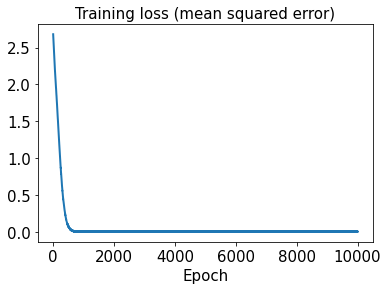

In [68]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

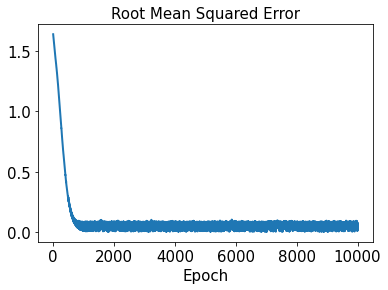

In [69]:
plt.plot(hist2['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [70]:
test_results2 = sd2.evaluate(x_test2)

1/1 [==============================] - 0s 83ms/step - loss: 9.2780e-06 - rmse: 0.0000e+00


In [71]:
decoded_sensor_train2 = sensor_pred2.predict(t_train)

In [72]:
decoded_sensor_test2 = sensor_pred2.predict(t_test)

In [73]:
decoded_train2 = sd2.predict(decoded_sensor_train2)

In [74]:
decoded_test2 = sd2.predict(decoded_sensor_test2)

In [75]:
error_train_abs2 = np.abs(decoded_train2 - y_train2)

In [76]:
error_test_abs2 = np.abs(decoded_test2 - y_test2)

In [77]:
l2_error_train2 = np.sqrt(np.sum((decoded_train2 - y_train2)**2) / np.sum(y_train2**2))
print(l2_error_train2)

0.0762962086338174


In [78]:
l2_error_test2 = np.sqrt(np.sum((decoded_test2 - y_test2)**2) / np.sum(y_test2**2))
print(l2_error_test2)

0.05358132186886648


In [79]:
l2_error_train_list2 = []
for i in range(0, len(x_train2)):
    l2_error_train_data2 = np.sqrt(np.sum((decoded_train2[i] - y_train2[i])**2) / np.sum(y_train2[i]**2))
    l2_error_train_list2.append(l2_error_train_data2)
print(l2_error_train_list2)

[0.08642000882499005, 0.10999021233413267, 0.0685267899110292, 0.04572736257148276, 0.001596696548950812, 0.07782113284082198, 0.016974751901664847, 0.0952820784965675, 0.007992879601113535, 0.08303991637542119, 0.09087961500010519, 0.14314728813351316, 0.07506077279081602, 0.11995084060535277, 0.05598812840300294, 0.13800202104134932, 0.09162666617270729, 0.03323056326392333, 0.1330637968503531, 0.09563698180586502, 0.054698710464876156, 0.12832353530694957, 0.06868827889172296, 0.04794955620023498, 0.09525053032960637, 0.06670849490995155, 0.04070043124336655, 0.009436293868403604, 0.02553110971409386, 0.10123728254389633, 0.026304160274987026, 0.08113216205045735, 0.04106982333323324]


In [80]:
l2_error_test_list2 = []
for i in range(0, len(x_test2)):
    l2_error_test_data2 = np.sqrt(np.sum((decoded_test2[i] - y_test2[i])**2) / np.sum(y_test2[i]**2))
    l2_error_test_list2.append(l2_error_test_data2)
print(l2_error_test_list2)

[0.054986405345148856, 0.035964549414140894, 0.08909843394516401, 0.061819989952400484, 0.12419305423835962, 0.015171163049553278, 0.017596756331157207, 0.027922543041764003]


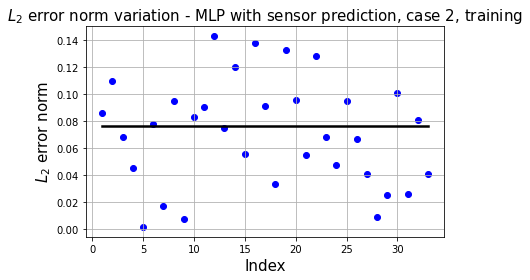

In [81]:
plt.plot(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train2*np.ones(x_train2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

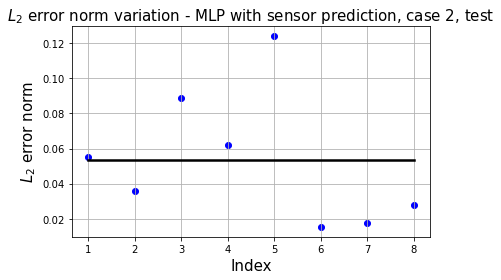

In [82]:
plt.plot(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test2*np.ones(x_test2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

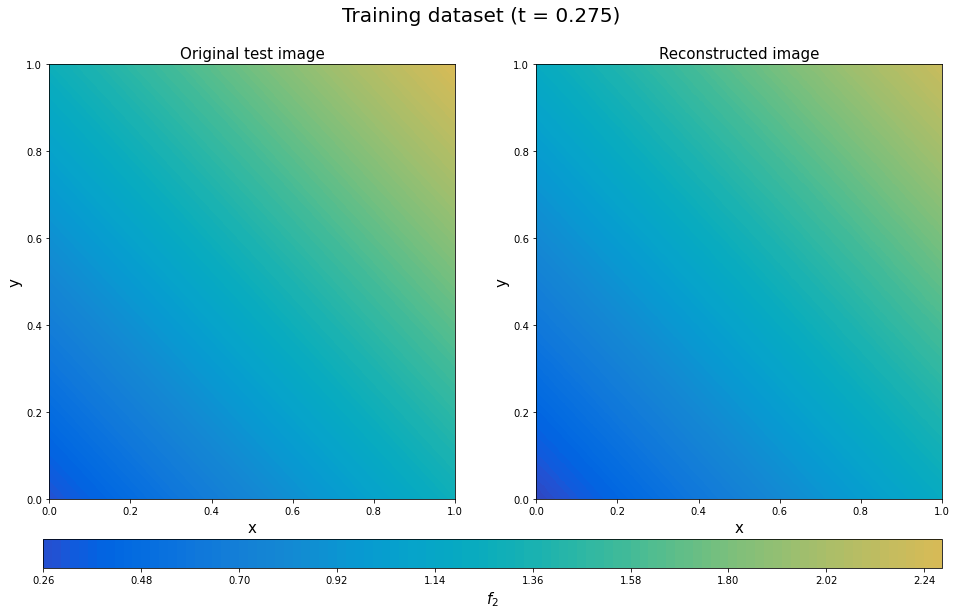

In [83]:
plt.figure(figsize=(16, 8))
y_train2_14_rotate = y_train2[14].T.reshape(101,101)
decoded_rotate2 = decoded_train2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_14_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[11]),fontsize=20)
plt.show()

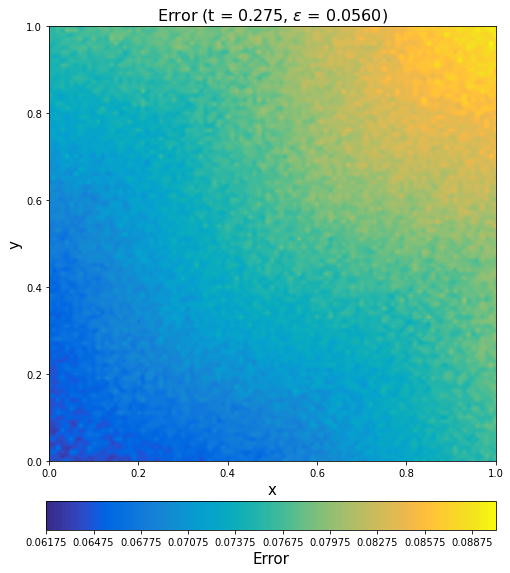

In [84]:
error_train_abs2_rotate14 = error_train_abs2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate14, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.275, $\epsilon$ = %.4f)' %(l2_error_train_list2[14]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

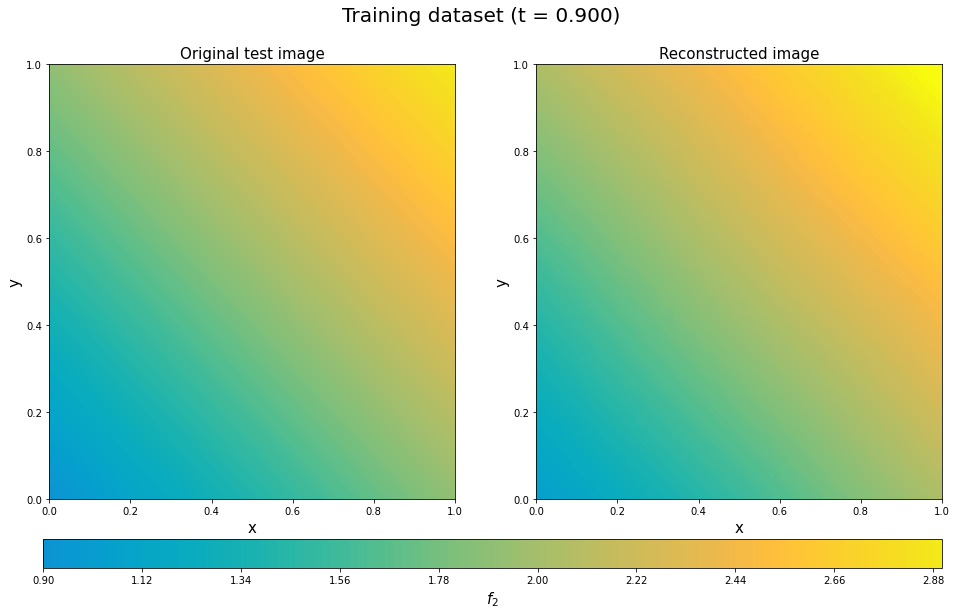

In [85]:
plt.figure(figsize=(16, 8))
y_train2_22_rotate = y_train2[22].T.reshape(101,101)
decoded_rotate2 = decoded_train2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_22_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[36]), fontsize=20)
plt.show()

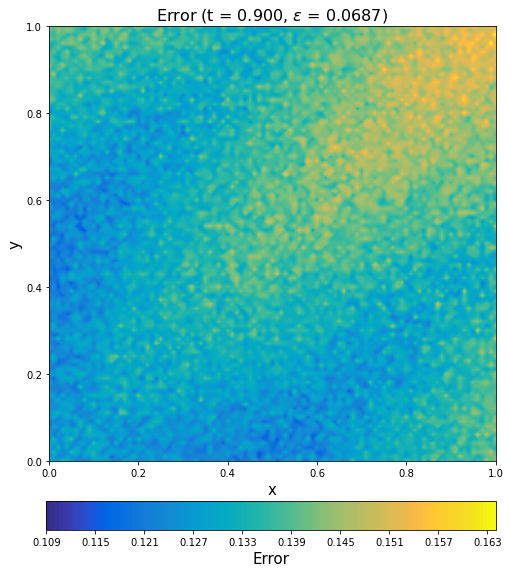

In [86]:
error_train_abs2_rotate22 = error_train_abs2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate22, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.900, $\epsilon$ = %.4f)' %(l2_error_train_list2[22]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

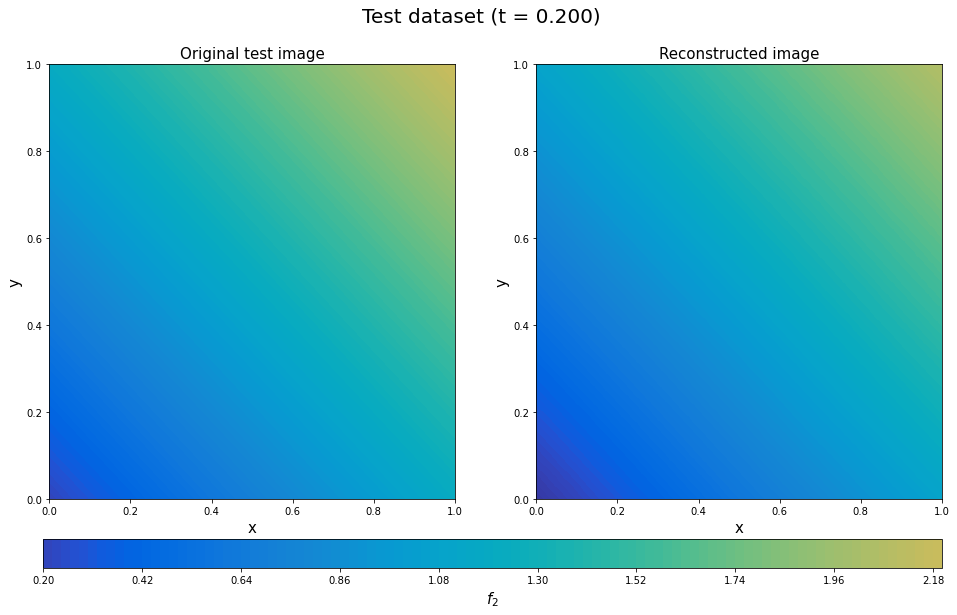

In [87]:
plt.figure(figsize=(16, 8))
y_test2_2_rotate = y_test2[2].T.reshape(101,101)
decoded_rotate2 = decoded_test2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

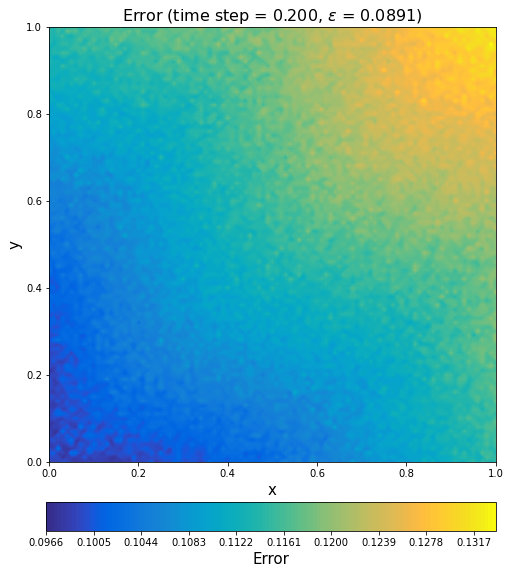

In [88]:
error_test_abs2_rotate2 = error_test_abs2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (time step = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list2[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

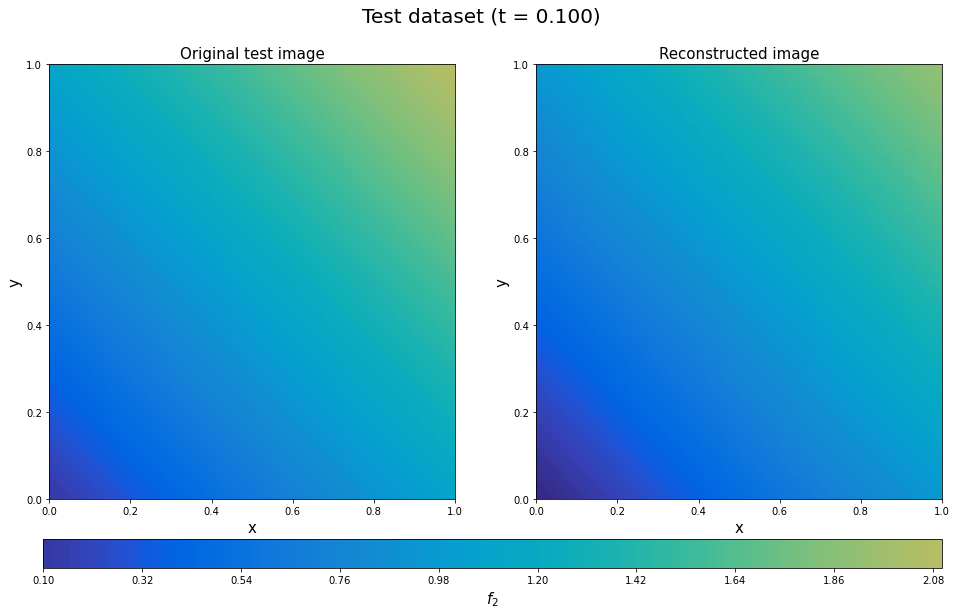

In [89]:
plt.figure(figsize=(16, 8))
y_test2_4_rotate = y_test2[4].T.reshape(101,101)
decoded_rotate2 = decoded_test2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_4_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[4]),fontsize=20)
plt.show()

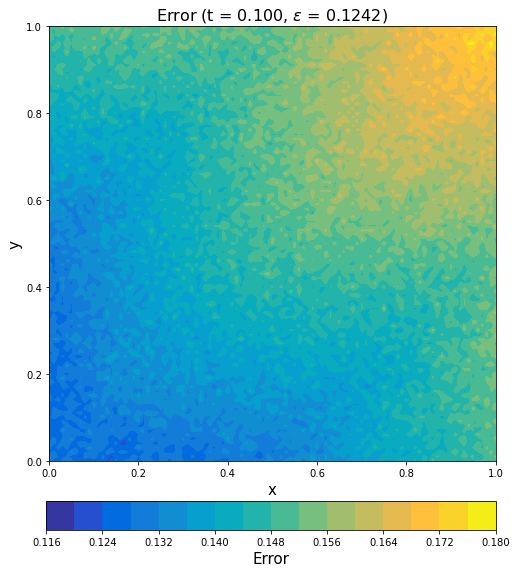

In [90]:
error_test_abs2_rotate4 = error_test_abs2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate4, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.100, $\epsilon$ = %.4f)' %(l2_error_test_list2[4]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 3: f3

In [91]:
out3 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out3[i, j, k] = np.exp(-t[i])*(2*np.sin(2*np.pi*x[j]) + np.sin(2*np.pi*x[j])*np.cos(2*np.pi*y[k]))

In [92]:
sensor3 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor3[i, j, k] = out3[i, 20*(j+1)+1, 20*(k+1)+1]

In [93]:
sensor3 = sensor3.reshape((41, 16, 1))

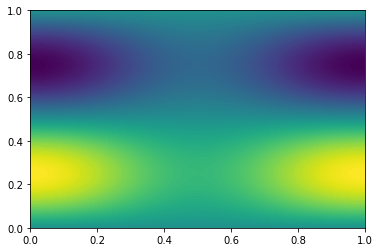

In [94]:
plt.contourf(xmesh, ymesh, out3[0,:,:], levels=128)

In [95]:
x_train3, x_test3, y_train3, y_test3, t_train, t_test = train_test_split(sensor3, out3, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [96]:
x_test3

array([[[ 1.19533543],
        [ 0.61432027],
        [ 0.65355792],
        [ 1.25882328],
        [ 0.66126769],
        [ 0.33984615],
        [ 0.36155269],
        [ 0.6963896 ],
        [-0.78664952],
        [-0.4042838 ],
        [-0.43010607],
        [-0.82843084],
        [-1.14744383],
        [-0.58970728],
        [-0.62737286],
        [-1.20838802]],

       [[ 1.57369576],
        [ 0.80877148],
        [ 0.86042905],
        [ 1.65727946],
        [ 0.8705792 ],
        [ 0.44741788],
        [ 0.4759952 ],
        [ 0.91681827],
        [-1.03564822],
        [-0.53225202],
        [-0.56624783],
        [-1.09065461],
        [-1.510645  ],
        [-0.77636772],
        [-0.82595561],
        [-1.59087989]],

       [[ 1.78323092],
        [ 0.91645815],
        [ 0.97499384],
        [ 1.87794366],
        [ 0.98649548],
        [ 0.50699088],
        [ 0.53937323],
        [ 1.03889121],
        [-1.17354318],
        [-0.60312055],
        [-0.64164286],
       

In [97]:
sensor_pred3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [98]:
start3 = datetime.datetime.now()
history3 = sensor_pred3.fit(t_train, x_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 10ms/step - loss: 3.8654 - rmse: 1.9660
Epoch 2/10000
2/2 [==============================] - 0s 56ms/step - loss: 3.8504 - rmse: 1.9622
Epoch 3/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.8351 - rmse: 1.9583
Epoch 4/10000
2/2 [==============================] - 0s 27ms/step - loss: 3.8219 - rmse: 1.9549
Epoch 5/10000
2/2 [==============================] - 0s 19ms/step - loss: 3.8117 - rmse: 1.9523
Epoch 6/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7999 - rmse: 1.9493
Epoch 7/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7897 - rmse: 1.9467
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7793 - rmse: 1.9440
Epoch 9/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.7696 - rmse: 1.9415
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7595 - rmse: 1.9389
Epoch 11/10000
2/2 [=======================

2/2 [==============================] - 0s 8ms/step - loss: 2.8444 - rmse: 1.6865
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8400 - rmse: 1.6852
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8338 - rmse: 1.6833
Epoch 173/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8290 - rmse: 1.6819
Epoch 174/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8264 - rmse: 1.6811
Epoch 175/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8232 - rmse: 1.6802
Epoch 176/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8172 - rmse: 1.6784
Epoch 177/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8114 - rmse: 1.6767
Epoch 178/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8063 - rmse: 1.6751
Epoch 179/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8063 - rmse: 1.6751
Epoch 180/10000
2/2 [=====================

2/2 [==============================] - 0s 11ms/step - loss: 2.2068 - rmse: 1.4855
Epoch 339/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2015 - rmse: 1.4837
Epoch 340/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1987 - rmse: 1.4827
Epoch 341/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1953 - rmse: 1.4816
Epoch 342/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1930 - rmse: 1.4808
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1884 - rmse: 1.4793
Epoch 344/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1853 - rmse: 1.4782
Epoch 345/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1826 - rmse: 1.4773
Epoch 346/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1798 - rmse: 1.4763
Epoch 347/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1759 - rmse: 1.4750
Epoch 348/10000
2/2 [==================

2/2 [==============================] - 0s 8ms/step - loss: 1.9607 - rmse: 1.4002
Epoch 423/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9541 - rmse: 1.3978
Epoch 424/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9525 - rmse: 1.3972
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9501 - rmse: 1.3964
Epoch 426/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9457 - rmse: 1.3948
Epoch 427/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9430 - rmse: 1.3938
Epoch 428/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9431 - rmse: 1.3939
Epoch 429/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9391 - rmse: 1.3924
Epoch 430/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9361 - rmse: 1.3914
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9352 - rmse: 1.3910
Epoch 432/10000
2/2 [===================

2/2 [==============================] - 0s 12ms/step - loss: 1.7452 - rmse: 1.3210
Epoch 507/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7408 - rmse: 1.3193
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7367 - rmse: 1.3177
Epoch 509/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7342 - rmse: 1.3168
Epoch 510/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7323 - rmse: 1.3161
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7292 - rmse: 1.3149
Epoch 512/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7275 - rmse: 1.3142
Epoch 513/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7249 - rmse: 1.3133
Epoch 514/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7222 - rmse: 1.3123
Epoch 515/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7198 - rmse: 1.3113
Epoch 516/10000
2/2 [==================

2/2 [==============================] - 0s 8ms/step - loss: 1.5530 - rmse: 1.2461
Epoch 591/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5495 - rmse: 1.2447
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5468 - rmse: 1.2436
Epoch 593/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5472 - rmse: 1.2438
Epoch 594/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5452 - rmse: 1.2430
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5406 - rmse: 1.2411
Epoch 596/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5408 - rmse: 1.2412
Epoch 597/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5396 - rmse: 1.2407
Epoch 598/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5346 - rmse: 1.2387
Epoch 599/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5324 - rmse: 1.2378
Epoch 600/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 1.3842 - rmse: 1.1764
Epoch 675/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3809 - rmse: 1.1750
Epoch 676/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3809 - rmse: 1.1750
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3772 - rmse: 1.1734
Epoch 678/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3760 - rmse: 1.1729
Epoch 679/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3804 - rmse: 1.1748
Epoch 680/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3737 - rmse: 1.1720
Epoch 681/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3719 - rmse: 1.1712
Epoch 682/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3697 - rmse: 1.1703
Epoch 683/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3669 - rmse: 1.1690
Epoch 684/10000
2/2 [===================

2/2 [==============================] - 0s 12ms/step - loss: 1.2334 - rmse: 1.1105
Epoch 759/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2315 - rmse: 1.1096
Epoch 760/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2309 - rmse: 1.1094
Epoch 761/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2282 - rmse: 1.1081
Epoch 762/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2337 - rmse: 1.1106
Epoch 763/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2247 - rmse: 1.1066
Epoch 764/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2264 - rmse: 1.1073
Epoch 765/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2246 - rmse: 1.1065
Epoch 766/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2203 - rmse: 1.1046
Epoch 767/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2180 - rmse: 1.1036
Epoch 768/10000
2/2 [===================

2/2 [==============================] - 0s 11ms/step - loss: 0.9843 - rmse: 0.9920
Epoch 926/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9808 - rmse: 0.9903
Epoch 927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.9782 - rmse: 0.9889
Epoch 928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9802 - rmse: 0.9900
Epoch 929/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9754 - rmse: 0.9875
Epoch 930/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9752 - rmse: 0.9874
Epoch 931/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9744 - rmse: 0.9870
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.9744 - rmse: 0.9870
Epoch 933/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9700 - rmse: 0.9848
Epoch 934/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9687 - rmse: 0.9841
Epoch 935/10000
2/2 [==================

Epoch 1009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8723 - rmse: 0.9339
Epoch 1010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8760 - rmse: 0.9358
Epoch 1011/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8700 - rmse: 0.9326
Epoch 1012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8673 - rmse: 0.9312
Epoch 1013/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8672 - rmse: 0.9311
Epoch 1014/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8648 - rmse: 0.9298
Epoch 1015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8660 - rmse: 0.9305
Epoch 1016/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8640 - rmse: 0.9294
Epoch 1017/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8625 - rmse: 0.9286
Epoch 1018/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8659 - rmse: 0.9304
Epoch 1019/100

2/2 [==============================] - 0s 12ms/step - loss: 0.7719 - rmse: 0.8784
Epoch 1093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7746 - rmse: 0.8800
Epoch 1094/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7697 - rmse: 0.8772
Epoch 1095/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7687 - rmse: 0.8766
Epoch 1096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7746 - rmse: 0.8800
Epoch 1097/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7664 - rmse: 0.8753
Epoch 1098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7674 - rmse: 0.8759
Epoch 1099/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7703 - rmse: 0.8775
Epoch 1100/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7663 - rmse: 0.8753
Epoch 1101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7624 - rmse: 0.8730
Epoch 1102/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.5980 - rmse: 0.7732
Epoch 1259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6002 - rmse: 0.7746
Epoch 1260/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5970 - rmse: 0.7725
Epoch 1261/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5964 - rmse: 0.7721
Epoch 1262/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5954 - rmse: 0.7715
Epoch 1263/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5969 - rmse: 0.7725
Epoch 1264/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5942 - rmse: 0.7707
Epoch 1265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5947 - rmse: 0.7710
Epoch 1266/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5935 - rmse: 0.7703
Epoch 1267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5903 - rmse: 0.7682
Epoch 1268/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.4506 - rmse: 0.6711
Epoch 1425/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4498 - rmse: 0.6705
Epoch 1426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4489 - rmse: 0.6698
Epoch 1427/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4478 - rmse: 0.6690
Epoch 1428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4498 - rmse: 0.6705
Epoch 1429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4461 - rmse: 0.6677
Epoch 1430/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4485 - rmse: 0.6695
Epoch 1431/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4485 - rmse: 0.6696
Epoch 1432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4457 - rmse: 0.6675
Epoch 1433/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4433 - rmse: 0.6656
Epoch 1434/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.3299 - rmse: 0.5742
Epoch 1591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3281 - rmse: 0.5727
Epoch 1592/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3259 - rmse: 0.5707
Epoch 1593/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3255 - rmse: 0.5703
Epoch 1594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3247 - rmse: 0.5697
Epoch 1595/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3239 - rmse: 0.5689
Epoch 1596/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3232 - rmse: 0.5683
Epoch 1597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3242 - rmse: 0.5692
Epoch 1598/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3227 - rmse: 0.5679
Epoch 1599/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3212 - rmse: 0.5666
Epoch 1600/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.2315 - rmse: 0.4809
Epoch 1757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2272 - rmse: 0.4765
Epoch 1758/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2228 - rmse: 0.4718
Epoch 1759/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2249 - rmse: 0.4741
Epoch 1760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2253 - rmse: 0.4744
Epoch 1761/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2286 - rmse: 0.4779
Epoch 1762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2215 - rmse: 0.4704
Epoch 1763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2224 - rmse: 0.4714
Epoch 1764/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2222 - rmse: 0.4711
Epoch 1765/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2190 - rmse: 0.4678
Epoch 1766/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.1459 - rmse: 0.3817
Epoch 1923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1493 - rmse: 0.3861
Epoch 1924/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1437 - rmse: 0.3788
Epoch 1925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1493 - rmse: 0.3862
Epoch 1926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1489 - rmse: 0.3856
Epoch 1927/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1433 - rmse: 0.3784
Epoch 1928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1417 - rmse: 0.3762
Epoch 1929/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1422 - rmse: 0.3768
Epoch 1930/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1433 - rmse: 0.3783
Epoch 1931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1444 - rmse: 0.3797
Epoch 1932/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0848 - rmse: 0.2908
Epoch 2089/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0930 - rmse: 0.3046
Epoch 2090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0844 - rmse: 0.2902
Epoch 2091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0850 - rmse: 0.2913
Epoch 2092/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0861 - rmse: 0.2931
Epoch 2093/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0917 - rmse: 0.3025
Epoch 2094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0855 - rmse: 0.2920
Epoch 2095/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0841 - rmse: 0.2897
Epoch 2096/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0907 - rmse: 0.3008
Epoch 2097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0873 - rmse: 0.2951
Epoch 2098/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0454 - rmse: 0.2127
Epoch 2255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0482 - rmse: 0.2190
Epoch 2256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0452 - rmse: 0.2121
Epoch 2257/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0470 - rmse: 0.2163
Epoch 2258/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0450 - rmse: 0.2116
Epoch 2259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0481 - rmse: 0.2189
Epoch 2260/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0509 - rmse: 0.2252
Epoch 2261/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0507 - rmse: 0.2248
Epoch 2262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0450 - rmse: 0.2118
Epoch 2263/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0475 - rmse: 0.2175
Epoch 2264/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0274 - rmse: 0.1649
Epoch 2421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0296 - rmse: 0.1715
Epoch 2422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0269 - rmse: 0.1635
Epoch 2423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0268 - rmse: 0.1632
Epoch 2424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0248 - rmse: 0.1567
Epoch 2425/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0261 - rmse: 0.1609
Epoch 2426/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0238 - rmse: 0.1536
Epoch 2427/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0235 - rmse: 0.1528
Epoch 2428/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0250 - rmse: 0.1575
Epoch 2429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0234 - rmse: 0.1523
Epoch 2430/10000
2/2 [============

2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.1042
Epoch 2587/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0119 - rmse: 0.1084
Epoch 2588/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0183 - rmse: 0.1347
Epoch 2589/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0143 - rmse: 0.1188
Epoch 2590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0182 - rmse: 0.1341
Epoch 2591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0113 - rmse: 0.1057
Epoch 2592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0107 - rmse: 0.1024
Epoch 2593/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0170 - rmse: 0.1295
Epoch 2594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0128 - rmse: 0.1123
Epoch 2595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.1012
Epoch 2596/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0881
Epoch 2753/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0749
Epoch 2754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 2755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0122 - rmse: 0.1098
Epoch 2756/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0672
Epoch 2757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0733
Epoch 2758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0860
Epoch 2759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0843
Epoch 2760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0910
Epoch 2761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0781
Epoch 2762/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0616
Epoch 2919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0445
Epoch 2920/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0742
Epoch 2921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0525
Epoch 2922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0655
Epoch 2923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0544
Epoch 2924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0439
Epoch 2925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0677
Epoch 2926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0404
Epoch 2927/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 2928/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0378
Epoch 3085/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0670
Epoch 3086/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0468
Epoch 3087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0822
Epoch 3088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0716
Epoch 3089/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0078 - rmse: 0.0872
Epoch 3090/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0049 - rmse: 0.0688
Epoch 3091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0638
Epoch 3092/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0613
Epoch 3093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0383
Epoch 3094/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0383
Epoch 3250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0437
Epoch 3251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0667
Epoch 3252/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0569
Epoch 3253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0437
Epoch 3254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0521
Epoch 3255/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0083 - rmse: 0.0901
Epoch 3256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0575
Epoch 3257/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8219e-04 - rmse: 0.0270
Epoch 3258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0483
Epoch 3259/10000
2/2 [===========

Epoch 3332/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.3058e-04 - rmse: 0.0219
Epoch 3333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0465
Epoch 3334/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0451
Epoch 3335/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0410
Epoch 3336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0549
Epoch 3337/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0767
Epoch 3338/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2077e-04 - rmse: 0.0192
Epoch 3339/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.6572e-04 - rmse: 0.0227
Epoch 3340/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7092e-04 - rmse: 0.0268
Epoch 3341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0091 - rmse: 0.0948
Ep

2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0880
Epoch 3497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0430
Epoch 3498/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6741e-04 - rmse: 0.0229
Epoch 3499/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9555e-04 - rmse: 0.0235
Epoch 3500/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6159e-04 - rmse: 0.0204
Epoch 3501/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0945
Epoch 3502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0667
Epoch 3503/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0513
Epoch 3504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0541
Epoch 3505/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6710e-04 - rmse: 0.0229
Epoch 3506/1000

2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0603
Epoch 3661/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.1156e-04 - rmse: 0.0259
Epoch 3662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0410
Epoch 3663/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 3664/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6795e-04 - rmse: 0.0207
Epoch 3665/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0609
Epoch 3666/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.6880e-04 - rmse: 0.0230
Epoch 3667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 3668/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9767e-04 - rmse: 0.0293
Epoch 3669/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8011e-04 - rmse: 0.0253
Epoch 3670/10000


2/2 [==============================] - 0s 6ms/step - loss: 6.7096e-04 - rmse: 0.0232
Epoch 3825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0649
Epoch 3826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0596
Epoch 3827/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0518
Epoch 3828/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0572
Epoch 3829/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0571
Epoch 3830/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.0873e-04 - rmse: 0.0218
Epoch 3831/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0449
Epoch 3832/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0518
Epoch 3833/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4079e-04 - rmse: 0.0247
Epoch 3834/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0391
Epoch 3989/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0397
Epoch 3990/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2099e-04 - rmse: 0.0199
Epoch 3991/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0542
Epoch 3992/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6361e-04 - rmse: 0.0253
Epoch 3993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 3994/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0540
Epoch 3995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0567
Epoch 3996/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6678e-04 - rmse: 0.0185
Epoch 3997/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0423e-04 - rmse: 0.0167
Epoch 3998/10000


2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0352
Epoch 4153/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0459e-04 - rmse: 0.0169
Epoch 4154/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0667
Epoch 4155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0882
Epoch 4156/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0400
Epoch 4157/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0540
Epoch 4158/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0565
Epoch 4159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0308
Epoch 4160/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0647
Epoch 4161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0592
Epoch 4162/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 4317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0530
Epoch 4318/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0557
Epoch 4319/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5891e-04 - rmse: 0.0156
Epoch 4320/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0609
Epoch 4321/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4269e-04 - rmse: 0.0151
Epoch 4322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0533
Epoch 4323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0388
Epoch 4324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0660
Epoch 4325/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0558
Epoch 4326/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 4481/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3614e-04 - rmse: 0.0206
Epoch 4482/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7178e-04 - rmse: 0.0127
Epoch 4483/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 4484/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3451e-04 - rmse: 0.0180
Epoch 4485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0383
Epoch 4486/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0430
Epoch 4487/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0874
Epoch 4488/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.1575e-04 - rmse: 0.0143
Epoch 4489/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 4490/10000


2/2 [==============================] - 0s 7ms/step - loss: 9.5038e-04 - rmse: 0.0290
Epoch 4563/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5420e-04 - rmse: 0.0211
Epoch 4564/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0326
Epoch 4565/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1825e-04 - rmse: 0.0176
Epoch 4566/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4973e-04 - rmse: 0.0210
Epoch 4567/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0502
Epoch 4568/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 4569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0814
Epoch 4570/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 4571/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3942e-04 - rmse: 0.0152
Epoch 4572/1

2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0754
Epoch 4727/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0531
Epoch 4728/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4729/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4041e-04 - rmse: 0.0232
Epoch 4730/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3676e-04 - rmse: 0.0153
Epoch 4731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0555
Epoch 4732/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 4733/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0585
Epoch 4734/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4378e-04 - rmse: 0.0290
Epoch 4735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0530
Epoch 4736/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 5.7088e-04 - rmse: 0.0217
Epoch 4891/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0653
Epoch 4892/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9296e-04 - rmse: 0.0199
Epoch 4893/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0946
Epoch 4894/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0573
Epoch 4895/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0400
Epoch 4896/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0881
Epoch 4897/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0487
Epoch 4898/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5989e-04 - rmse: 0.0162
Epoch 4899/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4413e-04 - rmse: 0.0157
Epoch 4900/1000

2/2 [==============================] - 0s 7ms/step - loss: 2.7185e-04 - rmse: 0.0133
Epoch 5055/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 5056/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 5057/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0530
Epoch 5058/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9782e-04 - rmse: 0.0143
Epoch 5059/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 5060/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 5061/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0386
Epoch 5062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0877
Epoch 5063/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 5064/10000
2/2 [=======

Epoch 5137/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2879e-04 - rmse: 0.0154
Epoch 5138/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0943
Epoch 5139/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1983e-04 - rmse: 0.0207
Epoch 5140/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0347
Epoch 5141/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.3293e-04 - rmse: 0.0210
Epoch 5142/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.4647e-04 - rmse: 0.0213
Epoch 5143/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0545
Epoch 5144/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0489
Epoch 5145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0670
Epoch 5146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoc

2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0531
Epoch 5302/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0585
Epoch 5303/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0250e-04 - rmse: 0.0177
Epoch 5304/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0633
Epoch 5305/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0582
Epoch 5306/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 5307/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0334
Epoch 5308/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4570e-04 - rmse: 0.0126
Epoch 5309/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0530
Epoch 5310/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 5311/10000
2/2 [

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0486
Epoch 5384/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 5385/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0398
Epoch 5386/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7911e-04 - rmse: 0.0171
Epoch 5387/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0944
Epoch 5388/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0447
Epoch 5389/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9811e-04 - rmse: 0.0203
Epoch 5390/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0519
Epoch 5391/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0949
Epoch 5392/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9175e-04 - rmse: 0.0202
Epoch 5393/10000
2

2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 5548/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.2284e-04 - rmse: 0.0233
Epoch 5549/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5550/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 5551/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0656
Epoch 5552/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6359e-04 - rmse: 0.0280
Epoch 5553/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9774e-04 - rmse: 0.0204
Epoch 5554/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 5555/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0388
Epoch 5556/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 5557/10000
2

2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0818
Epoch 5712/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 5713/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 5714/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 5715/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9982e-04 - rmse: 0.0179
Epoch 5716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 5717/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1399e-04 - rmse: 0.0252
Epoch 5718/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0762
Epoch 5719/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.8504e-04 - rmse: 0.0202
Epoch 5720/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0540
Epoch 5721/10000
2

2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0334
Epoch 5876/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 5877/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 5878/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 5879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0583
Epoch 5880/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0608
Epoch 5881/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 5882/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0814
Epoch 5883/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2142e-04 - rmse: 0.0211
Epoch 5884/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 5885/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0529
Epoch 5958/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 5959/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1038e-04 - rmse: 0.0117
Epoch 5960/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 5961/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.0508e-04 - rmse: 0.0288
Epoch 5962/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0501
Epoch 5963/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6404e-04 - rmse: 0.0197
Epoch 5964/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 5965/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3255e-04 - rmse: 0.0126
Epoch 5966/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4828e-04 - rmse: 0.0166
Epoch 5967

2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0585
Epoch 6040/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9880e-04 - rmse: 0.0181
Epoch 6041/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 6042/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 6043/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 6044/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 6045/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 6046/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2376e-04 - rmse: 0.0235
Epoch 6047/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0812
Epoch 6048/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0557
Epoch 6049/10000
2/2 [=

2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 6203/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0812
Epoch 6204/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 6205/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0529
Epoch 6206/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0812
Epoch 6207/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 6208/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0528
Epoch 6209/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 6210/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 6211/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0556
Epoch 6212/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 6366/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 6367/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 6368/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6369/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 6370/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7087e-04 - rmse: 0.0225
Epoch 6371/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 6372/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0943
Epoch 6373/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0333
Epoch 6374/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 6375/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 4.3326e-04 - rmse: 0.0192
Epoch 6530/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7533e-04 - rmse: 0.0203
Epoch 6531/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7693e-04 - rmse: 0.0106
Epoch 6532/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 6533/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 6534/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 6535/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7402e-04 - rmse: 0.0202
Epoch 6536/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0411
Epoch 6537/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2754e-04 - rmse: 0.0162
Epoch 6538/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 6539/1

2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 6694/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0942
Epoch 6695/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 6696/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 6697/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 6698/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 6699/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6700/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 6701/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5775e-04 - rmse: 0.0244
Epoch 6702/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4504e-04 - rmse: 0.0168
Epoch 6703/10000
2/2 [==

2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0938
Epoch 6858/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 6859/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 6860/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 6861/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 6862/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 6863/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 6864/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6673e-04 - rmse: 0.0175
Epoch 6865/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0413
Epoch 6866/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0499
Epoch 6867/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 7022/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0530
Epoch 7023/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0609
Epoch 7024/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6616e-04 - rmse: 0.0176
Epoch 7025/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7026/10000
2/2 [==============================] - 0s 18ms/step - loss: 2.7734e-04 - rmse: 0.0148
Epoch 7027/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1014e-04 - rmse: 0.0213
Epoch 7028/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0813
Epoch 7029/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 7030/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 7031/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 7186/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3785e-04 - rmse: 0.0168
Epoch 7187/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 7188/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 7189/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 7190/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 7191/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0556
Epoch 7192/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 7193/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 7194/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 7195/10000
2/2 [====

2/2 [==============================] - 0s 9ms/step - loss: 1.8701e-04 - rmse: 0.0116
Epoch 7350/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5586e-04 - rmse: 0.0224
Epoch 7351/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8849e-04 - rmse: 0.0116
Epoch 7352/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 7353/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6658e-04 - rmse: 0.0203
Epoch 7354/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 7355/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 7356/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4191e-04 - rmse: 0.0170
Epoch 7357/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 7358/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 7359

2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0656
Epoch 7513/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 7514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 7515/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7855e-04 - rmse: 0.0151
Epoch 7516/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 7517/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6512e-04 - rmse: 0.0146
Epoch 7518/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 7519/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 7520/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7325e-04 - rmse: 0.0287
Epoch 7521/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 7522/10000
2

Epoch 7594/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 7596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 7597/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6334e-04 - rmse: 0.0285
Epoch 7598/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0964e-04 - rmse: 0.0190
Epoch 7599/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 7600/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 7601/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 7602/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2647e-04 - rmse: 0.0133
Epoch 7603/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0424
Ep

2/2 [==============================] - 0s 9ms/step - loss: 3.4647e-04 - rmse: 0.0173
Epoch 7758/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5135e-04 - rmse: 0.0224
Epoch 7759/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 7760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 7761/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 7762/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 7763/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 7764/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 7765/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 7766/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 7767/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 7922/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2179e-04 - rmse: 0.0166
Epoch 7923/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3142e-04 - rmse: 0.0169
Epoch 7924/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0350
Epoch 7925/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 7926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 7927/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 7928/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 7929/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 7930/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8584e-04 - rmse: 0.0118
Epoch 7931/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 8086/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 8087/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 8088/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 8089/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 8090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0529
Epoch 8091/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 8092/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 8093/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5625e-04 - rmse: 0.0105
Epoch 8094/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4778e-04 - rmse: 0.0101
Epoch 8095/10000
2/2 [=

2/2 [==============================] - 0s 9ms/step - loss: 8.9450e-04 - rmse: 0.0292
Epoch 8168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 8169/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 8170/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7634e-04 - rmse: 0.0231
Epoch 8171/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 8172/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9451e-04 - rmse: 0.0123
Epoch 8173/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 8174/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7161e-04 - rmse: 0.0151
Epoch 8175/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0531
Epoch 8176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0610
Epoch 8177/100

2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 8250/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0403
Epoch 8251/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0649
Epoch 8252/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 8253/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 8254/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 8255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 8257/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0947
Epoch 8258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0944
Epoch 8259/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 8414/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1797e-04 - rmse: 0.0166
Epoch 8415/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0872
Epoch 8416/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3440e-04 - rmse: 0.0198
Epoch 8417/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 8418/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.5011e-04 - rmse: 0.0225
Epoch 8419/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8420/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 8421/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 8422/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 8423/10000
2/2

2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0501
Epoch 8578/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 8579/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 8580/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9849e-04 - rmse: 0.0126
Epoch 8581/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0334
Epoch 8582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0529
Epoch 8583/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 8584/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 8585/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8587/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8742/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8743/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 8744/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 8745/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 8746/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 8747/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 8748/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 8749/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0757
Epoch 8750/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 8751/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 8906/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 8907/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 8908/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5528e-04 - rmse: 0.0178
Epoch 8909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8910/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0879
Epoch 8911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 8912/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5620e-04 - rmse: 0.0303
Epoch 8913/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 8914/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4225e-04 - rmse: 0.0246
Epoch 8915/10000
2

2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 8988/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 8989/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 8990/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 8991/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.1565e-04 - rmse: 0.0296
Epoch 8992/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 8993/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0602e-04 - rmse: 0.0216
Epoch 8994/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9511e-04 - rmse: 0.0236
Epoch 8995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 8996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 8997/10000
2/2

2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 9152/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 9153/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 9154/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 9155/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 9156/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 9158/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1367e-04 - rmse: 0.0133
Epoch 9159/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 9160/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 9161/10000
2/2 [====

2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 9234/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 9235/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 9236/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9237/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 9238/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.1779e-04 - rmse: 0.0280
Epoch 9239/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9240/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9328e-04 - rmse: 0.0126
Epoch 9241/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 9242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9243/10000
2/2 

Epoch 9315/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 9316/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 9317/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 9318/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 9319/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 9320/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 9321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 9322/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 9323/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9187e-04 - rmse: 0.0189
Epoch 9324/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0942
Epoch 9325/1

Epoch 9397/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0753
Epoch 9398/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 9399/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0086e-04 - rmse: 0.0129
Epoch 9400/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7251e-04 - rmse: 0.0118
Epoch 9401/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 9402/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 9403/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 9404/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 9405/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8324e-04 - rmse: 0.0291
Epoch 9406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0357
E

Epoch 9479/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 9480/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 9481/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9396e-04 - rmse: 0.0190
Epoch 9482/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9483/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8230e-04 - rmse: 0.0158
Epoch 9484/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9485/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 9486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 9487/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1938e-04 - rmse: 0.0136
Epoch 9488/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4424e-04 - rmse: 0.01

2/2 [==============================] - 0s 11ms/step - loss: 1.9652e-04 - rmse: 0.0128
Epoch 9562/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7802e-04 - rmse: 0.0186
Epoch 9563/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 9564/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 9565/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 9566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 9567/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 9568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 9569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 9570/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 9571/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 4.4993e-04 - rmse: 0.0204
Epoch 9644/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 9645/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9646/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 9647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 9648/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 9649/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2585e-04 - rmse: 0.0097
Epoch 9650/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8033e-04 - rmse: 0.0157
Epoch 9651/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1347e-04 - rmse: 0.0195
Epoch 9652/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 9653/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 9726/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9727/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 9728/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 9729/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 9730/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 9731/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 9732/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 9733/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 9734/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5164e-04 - rmse: 0.0148
Epoch 9735/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 9890/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 9891/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3155e-04 - rmse: 0.0142
Epoch 9892/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5934e-04 - rmse: 0.0207
Epoch 9893/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 9894/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 9895/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0502
Epoch 9896/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4999e-04 - rmse: 0.0148
Epoch 9897/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0936
Epoch 9898/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4389e-04 - rmse: 0.0177
Epoch 9899/10000

In [99]:
time3_sensor = end3 - start3
print("Training time (Case 3, sensor prediction):", time3_sensor)

Training time (Case 3, sensor prediction): 0:03:30.255477


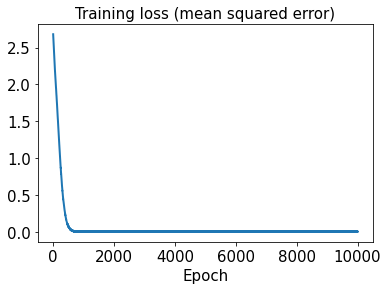

In [100]:
hist3 = history3.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

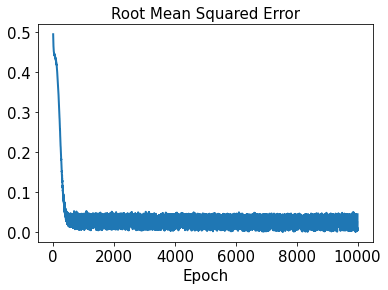

In [101]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [102]:
sd3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [103]:
start3 = datetime.datetime.now()
history3 = sd3.fit(x_train3, y_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 21ms/step - loss: 3.7581 - rmse: 1.9386
Epoch 2/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7377 - rmse: 1.9333
Epoch 3/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7171 - rmse: 1.9280
Epoch 4/10000
2/2 [==============================] - 0s 22ms/step - loss: 3.6966 - rmse: 1.9226
Epoch 5/10000
2/2 [==============================] - 0s 18ms/step - loss: 3.6762 - rmse: 1.9173
Epoch 6/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.6559 - rmse: 1.9120
Epoch 7/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6358 - rmse: 1.9068
Epoch 8/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6157 - rmse: 1.9015
Epoch 9/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.5957 - rmse: 1.8962
Epoch 10/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5758 - rmse: 1.8910
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 7ms/step - loss: 1.6141 - rmse: 1.2704
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6040 - rmse: 1.2664
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5984 - rmse: 1.2642
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5909 - rmse: 1.2612
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5835 - rmse: 1.2583
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5765 - rmse: 1.2555
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5705 - rmse: 1.2531
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5634 - rmse: 1.2502
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5573 - rmse: 1.2478
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5528 - rmse: 1.2460
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.8290 - rmse: 0.9103
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8249 - rmse: 0.9080
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8252 - rmse: 0.9082
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8198 - rmse: 0.9052
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8165 - rmse: 0.9034
Epoch 343/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.8126 - rmse: 0.9012
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8131 - rmse: 0.9015
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8080 - rmse: 0.8987
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8042 - rmse: 0.8966
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8009 - rmse: 0.8947
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.4347 - rmse: 0.6591
Epoch 507/10000
2/2 [==============================] - 0s 2ms/step - loss: 0.4399 - rmse: 0.6630
Epoch 508/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4311 - rmse: 0.6563
Epoch 509/10000
2/2 [==============================] - 0s 2ms/step - loss: 0.4363 - rmse: 0.6603
Epoch 510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4305 - rmse: 0.6559
Epoch 511/10000
2/2 [==============================] - 0s 2ms/step - loss: 0.4273 - rmse: 0.6534
Epoch 512/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4244 - rmse: 0.6512
Epoch 513/10000
2/2 [==============================] - 0s 2ms/step - loss: 0.4241 - rmse: 0.6510
Epoch 514/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4202 - rmse: 0.6480
Epoch 515/10000
2/2 [==============================] - 0s 0s/step - loss: 0.4212 - rmse: 0.6488
Epoch 516/10000
2/2 [======================

2/2 [==============================] - 0s 7ms/step - loss: 0.2124 - rmse: 0.4607
Epoch 675/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2133 - rmse: 0.4616
Epoch 676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2082 - rmse: 0.4562
Epoch 677/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2072 - rmse: 0.4550
Epoch 678/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2069 - rmse: 0.4547
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2092 - rmse: 0.4572
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2051 - rmse: 0.4527
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2043 - rmse: 0.4518
Epoch 682/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2101 - rmse: 0.4582
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2015 - rmse: 0.4488
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 14ms/step - loss: 0.0837 - rmse: 0.2892
Epoch 843/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0844 - rmse: 0.2904
Epoch 844/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0888 - rmse: 0.2978
Epoch 845/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0835 - rmse: 0.2888
Epoch 846/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0847 - rmse: 0.2908
Epoch 847/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0826 - rmse: 0.2872
Epoch 848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0811 - rmse: 0.2846
Epoch 849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0839 - rmse: 0.2894
Epoch 850/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0813 - rmse: 0.2850
Epoch 851/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0801 - rmse: 0.2829
Epoch 852/10000
2/2 [====================

2/2 [==============================] - 0s 7ms/step - loss: 0.0303 - rmse: 0.1739
Epoch 1011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0291 - rmse: 0.1703
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0319 - rmse: 0.1786
Epoch 1013/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0290 - rmse: 0.1700
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0299 - rmse: 0.1728
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0354 - rmse: 0.1880
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0327 - rmse: 0.1806
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0372 - rmse: 0.1928
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0295 - rmse: 0.1716
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0311 - rmse: 0.1763
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 1177/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0090 - rmse: 0.0944
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0914
Epoch 1179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0145 - rmse: 0.1201
Epoch 1180/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0086 - rmse: 0.0927
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0990
Epoch 1183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0916
Epoch 1184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 1185/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0843
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 1343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0797
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 1348/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 1349/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0530
Epoch 1350/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0788
Epoch 1351/10000
2/2 [==============================] - 0s 22ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 1352/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 1508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0976
Epoch 1509/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7191e-04 - rmse: 0.0232
Epoch 1510/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4711e-04 - rmse: 0.0203
Epoch 1511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3010e-04 - rmse: 0.0282
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3641e-04 - rmse: 0.0200
Epoch 1514/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 1515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 1516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 1517/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 1672/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7564e-04 - rmse: 0.0119
Epoch 1673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0913
Epoch 1674/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 1675/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 1676/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 1677/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0492
Epoch 1678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 1679/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 1680/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0099 - rmse: 0.0995
Epoch 1681/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 4.3274e-04 - rmse: 0.0200
Epoch 1755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 1756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 1757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 1759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 1761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 1762/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.0771e-04 - rmse: 0.0133
Epoch 1763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 1764/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 2.4727e-04 - rmse: 0.0148
Epoch 1919/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0907
Epoch 1920/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0390
Epoch 1921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 1922/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 1923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 1924/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 1925/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 1926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 1927/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 1928/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 4.9986e-04 - rmse: 0.0217
Epoch 2083/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4622e-04 - rmse: 0.0286
Epoch 2084/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 2085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 2086/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4972e-04 - rmse: 0.0304
Epoch 2087/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.5324e-04 - rmse: 0.0269
Epoch 2088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 2089/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 2090/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 2091/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 2092/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 2247/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 2248/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7037e-04 - rmse: 0.0120
Epoch 2249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 2250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 2251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 2252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 2253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 2254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 2255/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 2256/10000
2/2 [===========

2/2 [==============================] - 0s 18ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 2411/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 2412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 2413/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.2959e-04 - rmse: 0.0175
Epoch 2414/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 2415/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8061e-05 - rmse: 0.0073
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 2417/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 2418/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.3554e-04 - rmse: 0.0247
Epoch 2419/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 2420/10000
2/2

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 2575/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6921e-05 - rmse: 0.0066
Epoch 2576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0531
Epoch 2577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 2578/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0161e-04 - rmse: 0.0133
Epoch 2579/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 2580/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 2581/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 2582/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2001e-04 - rmse: 0.0098
Epoch 2583/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7391e-04 - rmse: 0.0123
Epoch 2584/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 2739/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 2740/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 2741/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 2742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 2743/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 2744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0906
Epoch 2745/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0580e-04 - rmse: 0.0136
Epoch 2746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 2747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 2748/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 2903/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 2904/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 2905/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 2906/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4303e-04 - rmse: 0.0149
Epoch 2907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 2908/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3790e-05 - rmse: 0.0079
Epoch 2909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 2910/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0501e-04 - rmse: 0.0092
Epoch 2911/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 2912/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 3067/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5127e-04 - rmse: 0.0115
Epoch 3068/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 3069/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 3070/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 3071/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 3073/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 3074/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 3075/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 3076/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 3231/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0168e-04 - rmse: 0.0297
Epoch 3232/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 3233/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6739e-04 - rmse: 0.0212
Epoch 3234/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 3235/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 3236/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3931e-04 - rmse: 0.0304
Epoch 3237/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 3238/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 3239/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 3240/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 4.3196e-04 - rmse: 0.0204
Epoch 3395/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 3396/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3214e-04 - rmse: 0.0147
Epoch 3397/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 3398/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3399/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 3400/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6512e-04 - rmse: 0.0212
Epoch 3401/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 3402/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7064e-04 - rmse: 0.0124
Epoch 3403/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 3404/10000


2/2 [==============================] - 0s 7ms/step - loss: 3.8719e-04 - rmse: 0.0193
Epoch 3560/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 3561/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 3562/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6002e-04 - rmse: 0.0186
Epoch 3563/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8274e-04 - rmse: 0.0163
Epoch 3564/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 3565/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 3566/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 3567/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 3568/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0817e-04 - rmse: 0.0096
Epoch 3569/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 4.8384e-04 - rmse: 0.0217
Epoch 3724/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 3725/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2444e-04 - rmse: 0.0105
Epoch 3726/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 3727/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 3728/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1822e-05 - rmse: 0.0076
Epoch 3729/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4081e-04 - rmse: 0.0112
Epoch 3730/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 3731/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3732/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8611e-04 - rmse: 0.0131
Epoch 3733/10000


2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 3888/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6164e-04 - rmse: 0.0255
Epoch 3889/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 3890/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 3891/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 3892/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4821e-04 - rmse: 0.0252
Epoch 3893/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 3894/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 3895/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0719
Epoch 3896/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.9760e-04 - rmse: 0.0314
Epoch 3897/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 4053/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1670e-04 - rmse: 0.0174
Epoch 4054/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3635e-04 - rmse: 0.0206
Epoch 4055/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 4056/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 4057/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4058/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4059/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 4060/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 4061/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 4062/10000
2/2 [======

Epoch 4217/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4494e-04 - rmse: 0.0182
Epoch 4218/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2586e-05 - rmse: 0.0090
Epoch 4219/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8585e-04 - rmse: 0.0165
Epoch 4220/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4221/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.1645e-04 - rmse: 0.0102
Epoch 4222/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1797e-04 - rmse: 0.0144
Epoch 4223/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2267e-04 - rmse: 0.0176
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 4226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 4382/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.0275e-04 - rmse: 0.0281
Epoch 4383/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 4384/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4186e-04 - rmse: 0.0114
Epoch 4385/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.8362e-05 - rmse: 0.0069
Epoch 4386/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 4387/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 4388/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 4389/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8586e-04 - rmse: 0.0132
Epoch 4390/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4391/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 4546/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 4547/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 4548/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 4549/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 4550/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 4551/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 4552/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8810e-04 - rmse: 0.0313
Epoch 4553/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0103 - rmse: 0.1014
Epoch 4554/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 4555/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 4710/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7862e-04 - rmse: 0.0164
Epoch 4711/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0277e-04 - rmse: 0.0243
Epoch 4712/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1289e-04 - rmse: 0.0201
Epoch 4713/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0985
Epoch 4714/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 4715/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1086e-04 - rmse: 0.0200
Epoch 4716/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 4717/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 4718/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 4719/10000
2/2

2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 4874/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4875/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 4876/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7134e-04 - rmse: 0.0237
Epoch 4877/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1138e-04 - rmse: 0.0245
Epoch 4878/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0863
Epoch 4879/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0703
Epoch 4880/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 4881/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 4882/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0980
Epoch 4883/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 5038/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 5039/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 5040/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4105e-04 - rmse: 0.0208
Epoch 5041/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0573e-04 - rmse: 0.0199
Epoch 5042/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5055e-04 - rmse: 0.0290
Epoch 5043/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9790e-05 - rmse: 0.0095
Epoch 5044/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 5045/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.5230e-05 - rmse: 0.0092
Epoch 5046/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5256e-04 - rmse: 0.0119
Epoch 5047/10

2/2 [==============================] - 0s 8ms/step - loss: 7.2660e-04 - rmse: 0.0268
Epoch 5202/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0995
Epoch 5203/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 5204/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 5205/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 5206/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 5207/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 5208/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 5209/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 5210/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 5211/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 1.1642e-04 - rmse: 0.0103
Epoch 5366/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7416e-05 - rmse: 0.0088
Epoch 5367/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 5368/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1728e-05 - rmse: 0.0057
Epoch 5369/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8274e-04 - rmse: 0.0165
Epoch 5370/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 5371/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 5372/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 5373/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 5374/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0473
Epoch 5375/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5530/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5531/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 5532/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2927e-04 - rmse: 0.0228
Epoch 5533/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 5534/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 5535/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8946e-04 - rmse: 0.0297
Epoch 5536/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5537/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 5538/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 5539/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 9.7940e-04 - rmse: 0.0311
Epoch 5695/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 5696/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 5697/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0701
Epoch 5698/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 5699/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 5700/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 5701/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 5702/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8011e-04 - rmse: 0.0278
Epoch 5703/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 5704/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 1.2158e-04 - rmse: 0.0106
Epoch 5859/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.6119e-04 - rmse: 0.0274
Epoch 5860/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 5861/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2182e-04 - rmse: 0.0106
Epoch 5862/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 5863/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 5864/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 5865/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 5866/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 5867/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.0342e-04 - rmse: 0.0244
Epoch 5868/10

2/2 [==============================] - 0s 6ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 6023/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.8223e-04 - rmse: 0.0218
Epoch 6024/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 6025/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0352
Epoch 6026/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0990
Epoch 6027/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6108e-04 - rmse: 0.0274
Epoch 6028/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3498e-04 - rmse: 0.0269
Epoch 6029/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6030/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 6031/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 6032/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 6188/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5819e-04 - rmse: 0.0122
Epoch 6189/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.6498e-04 - rmse: 0.0125
Epoch 6190/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 6191/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 6192/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 6193/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 6194/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 6195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 6196/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6197/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 6271/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6457e-04 - rmse: 0.0125
Epoch 6272/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 6273/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 6274/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3901e-04 - rmse: 0.0114
Epoch 6275/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 6276/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.1732e-04 - rmse: 0.0284
Epoch 6277/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 6278/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 6279/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 6280/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 6436/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7180e-04 - rmse: 0.0294
Epoch 6437/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 6438/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 6439/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6440/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 6441/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 6442/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 6443/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 6444/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 6445/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 4.9549e-04 - rmse: 0.0221
Epoch 6600/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 6601/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0434e-04 - rmse: 0.0244
Epoch 6602/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 6603/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 6604/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6605/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6816e-04 - rmse: 0.0257
Epoch 6606/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 6607/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 6608/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 6609/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6764/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2217e-04 - rmse: 0.0107
Epoch 6765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6766/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2479e-04 - rmse: 0.0108
Epoch 6767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 6768/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9697e-04 - rmse: 0.0137
Epoch 6769/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3683e-04 - rmse: 0.0207
Epoch 6770/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 6771/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 6772/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 6773/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 6928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 6929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 6930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 6931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6932/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8827e-04 - rmse: 0.0195
Epoch 6933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 6934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 6935/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7506e-04 - rmse: 0.0277
Epoch 6936/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 6937/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 7092/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5336e-04 - rmse: 0.0186
Epoch 7093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 7094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7095/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4787e-04 - rmse: 0.0118
Epoch 7096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7097/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1322e-04 - rmse: 0.0175
Epoch 7098/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0464e-04 - rmse: 0.0172
Epoch 7099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 7100/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6567e-04 - rmse: 0.0126
Epoch 7101/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 7256/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.2408e-04 - rmse: 0.0178
Epoch 7257/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8995e-04 - rmse: 0.0280
Epoch 7258/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.9496e-05 - rmse: 0.0079
Epoch 7259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 7261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 7262/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8730e-04 - rmse: 0.0167
Epoch 7263/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3563e-04 - rmse: 0.0113
Epoch 7264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 7265/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 7420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 7421/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2012e-04 - rmse: 0.0302
Epoch 7422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 7423/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7989e-04 - rmse: 0.0193
Epoch 7424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 7425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 7426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 7427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0981
Epoch 7428/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4906e-04 - rmse: 0.0233
Epoch 7429/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 7584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 7585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 7586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 7587/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 7588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 7590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 7591/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6286e-05 - rmse: 0.0070
Epoch 7592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 7593/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 7749/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 7750/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 7751/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7693e-04 - rmse: 0.0239
Epoch 7752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 7753/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0995
Epoch 7754/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 7755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0715
Epoch 7756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 7757/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0695
Epoch 7758/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0833
Epoch 7913/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7736e-04 - rmse: 0.0278
Epoch 7914/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 7915/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.8389e-05 - rmse: 0.0096
Epoch 7916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 7917/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 7918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 7919/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.6228e-04 - rmse: 0.0275
Epoch 7920/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 7921/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 7922/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 9.6318e-04 - rmse: 0.0309
Epoch 8077/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 8078/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 8079/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0550e-04 - rmse: 0.0141
Epoch 8080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0833
Epoch 8081/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3514e-04 - rmse: 0.0230
Epoch 8082/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0833
Epoch 8083/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 8084/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 8085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 8086/10000
2/2 [===

Epoch 8159/10000
2/2 [==============================] - 0s 17ms/step - loss: 1.3836e-04 - rmse: 0.0115
Epoch 8160/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.8274e-04 - rmse: 0.0166
Epoch 8161/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 8162/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.0338e-04 - rmse: 0.0172
Epoch 8163/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 8164/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 8166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 8167/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.7157e-04 - rmse: 0.0216
Epoch 8168/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5964e-04 - rmse: 

2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 8324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0902
Epoch 8325/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0839
Epoch 8326/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 8327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 8328/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 8329/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 8330/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6451e-04 - rmse: 0.0189
Epoch 8331/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 8332/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 8333/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 8488/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 8489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 8490/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8361e-04 - rmse: 0.0133
Epoch 8491/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 8492/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 8493/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 8494/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 8495/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7403e-05 - rmse: 0.0095
Epoch 8496/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8017e-05 - rmse: 0.0034
Epoch 8497/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 8652/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9730e-05 - rmse: 0.0086
Epoch 8653/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 8654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 8655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 8656/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 8657/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 8658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 8659/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9265e-04 - rmse: 0.0280
Epoch 8660/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 8661/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 8816/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7748e-04 - rmse: 0.0165
Epoch 8817/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 8818/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 8819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 8820/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8426e-04 - rmse: 0.0240
Epoch 8821/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0352
Epoch 8822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 8823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 8824/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 8825/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 8981/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8456e-04 - rmse: 0.0279
Epoch 8982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8983/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 8984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 8985/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7130e-04 - rmse: 0.0238
Epoch 8986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0429
Epoch 8987/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7982e-04 - rmse: 0.0218
Epoch 8988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8989/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 8990/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 9145/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.1458e-04 - rmse: 0.0301
Epoch 9146/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 9147/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 9148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 9149/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9284e-04 - rmse: 0.0242
Epoch 9150/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 9151/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 9152/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 9153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 9154/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 9.3611e-04 - rmse: 0.0305
Epoch 9309/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.4841e-04 - rmse: 0.0233
Epoch 9310/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 9311/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 9312/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5281e-04 - rmse: 0.0308
Epoch 9313/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9314/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5680e-04 - rmse: 0.0255
Epoch 9315/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 9316/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 9317/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6443e-04 - rmse: 0.0161
Epoch 9318/10000


2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 9473/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0514
Epoch 9474/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3513e-04 - rmse: 0.0181
Epoch 9475/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7050e-04 - rmse: 0.0215
Epoch 9476/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2578e-05 - rmse: 0.0051
Epoch 9477/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2741e-04 - rmse: 0.0179
Epoch 9478/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4738e-04 - rmse: 0.0210
Epoch 9479/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0380
Epoch 9480/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 9481/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 9482/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 9637/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 9638/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 9639/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0304e-04 - rmse: 0.0172
Epoch 9640/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6243e-04 - rmse: 0.0125
Epoch 9641/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5898e-04 - rmse: 0.0159
Epoch 9642/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 9643/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0839
Epoch 9644/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9599e-04 - rmse: 0.0221
Epoch 9645/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 9646/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 9801/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 9802/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 9803/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 9804/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9001e-04 - rmse: 0.0314
Epoch 9805/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 9806/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9807/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1012e-04 - rmse: 0.0201
Epoch 9808/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5825e-04 - rmse: 0.0159
Epoch 9809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 9810/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 9.3498e-06 - rmse: 0.0018
Epoch 9965/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5878e-05 - rmse: 0.0089
Epoch 9966/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 9967/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4895e-04 - rmse: 0.0273
Epoch 9968/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9316e-05 - rmse: 0.0048
Epoch 9969/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 9970/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 9971/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7571e-04 - rmse: 0.0130
Epoch 9972/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 9973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 9974/10000


In [104]:
time3 = end3 - start3
print("Training time (Case 3):", time3)

Training time (Case 3): 0:02:52.723203


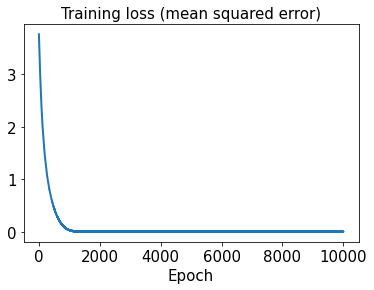

In [105]:
hist3 = history3.history
plt.plot(hist3['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

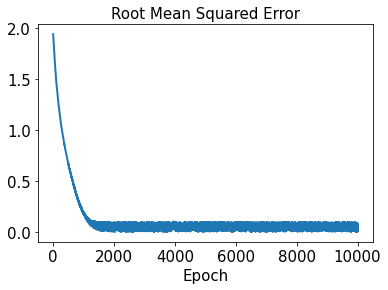

In [106]:
plt.plot(hist3['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [107]:
test_results3 = sd3.evaluate(x_test3)

1/1 [==============================] - 0s 83ms/step - loss: 6.0263e-06 - rmse: 0.0000e+00


In [108]:
decoded_sensor_train3 = sensor_pred3.predict(t_train)

In [109]:
decoded_sensor_test3 = sensor_pred3.predict(t_test)

In [110]:
decoded_train3 = sd3.predict(decoded_sensor_train3)

In [111]:
decoded_test3 = sd3.predict(decoded_sensor_test3)

In [112]:
error_train_abs3 = np.abs(decoded_train3 - y_train3)

In [113]:
error_test_abs3 = np.abs(decoded_test3 - y_test3)

In [114]:
l2_error_train3 = np.sqrt(np.sum((decoded_train3 - y_train3)**2) / np.sum(y_train3**2))
print(l2_error_train3)

0.09021292781359892


In [115]:
l2_error_test3 = np.sqrt(np.sum((decoded_test3 - y_test3)**2) / np.sum(y_test3**2))
print(l2_error_test3)

0.09962619293855832


In [116]:
l2_error_train_list3 = []
for i in range(0, len(x_train3)):
    l2_error_train_data3 = np.sqrt(np.sum((decoded_train3[i] - y_train3[i])**2) / np.sum(y_train3[i]**2))
    l2_error_train_list3.append(l2_error_train_data3)
print(l2_error_train_list3)

[0.05102840847882969, 0.10883456097920736, 0.0289049424722155, 0.07646955136264925, 0.019899304063897907, 0.0969389941696369, 0.046176190471813414, 0.08252130057592637, 0.033669052907395206, 0.12469113938581848, 0.10936119300836719, 0.1113072453922539, 0.035313024127195475, 0.11109315429645975, 0.08432023873410782, 0.11262347278605876, 0.0604236399249853, 0.009784147192882202, 0.11329428812331138, 0.07090446860004271, 0.1594530511827817, 0.11328622172367482, 0.14136892366476841, 0.014999658338498973, 0.09532254176484249, 0.09112790550929227, 0.012011688788650983, 0.005879580708578628, 0.008273525167119048, 0.10574994358788238, 0.05744688145262622, 0.0426728599679375, 0.17900284646367154]


In [117]:
l2_error_test_list3 = []
for i in range(0, len(x_test3)):
    l2_error_test_data3 = np.sqrt(np.sum((decoded_test3[i] - y_test3[i])**2) / np.sum(y_test3[i]**2))
    l2_error_test_list3.append(l2_error_test_data3)
print(l2_error_test_list3)

[0.01878688768707591, 0.0675283074504852, 0.10179828386196463, 0.023409496854241034, 0.11256461476529017, 0.22275463276988078, 0.005736091207158933, 0.20008231447588593]


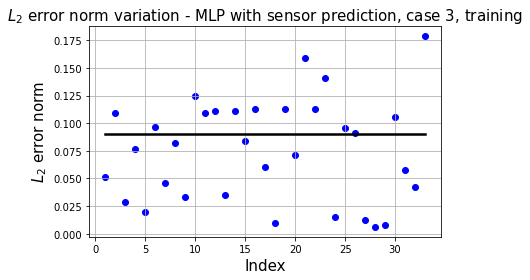

In [118]:
plt.plot(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train3*np.ones(x_train3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

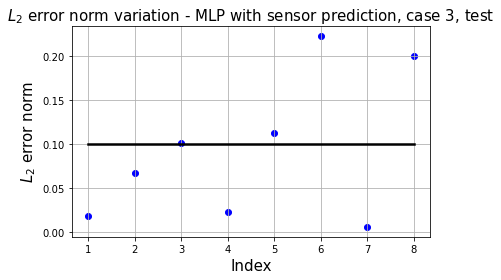

In [119]:
plt.plot(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test3*np.ones(x_test3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

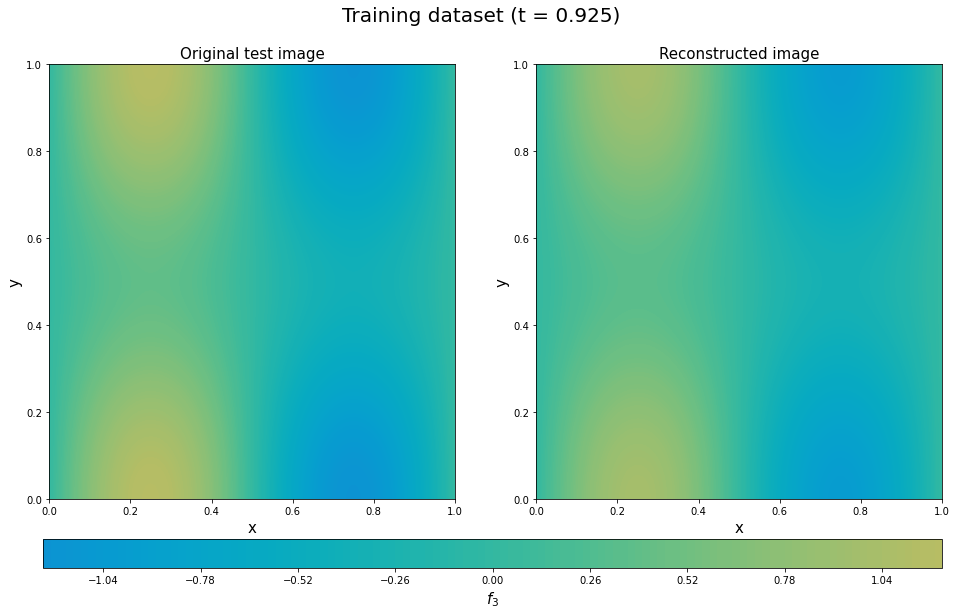

In [120]:
plt.figure(figsize=(16, 8))
y_train3_20_rotate = y_train3[20].T.reshape(101,101)
decoded_rotate3 = decoded_train3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_20_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[37]),fontsize=20)
plt.show()

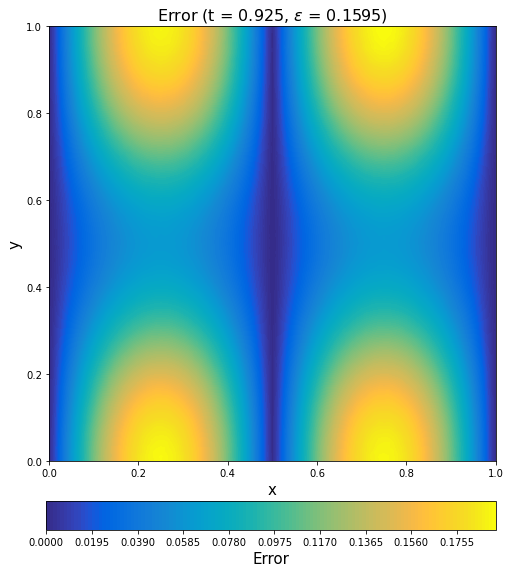

In [121]:
error_train_abs3_rotate20 = error_train_abs3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate20, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.925, $\epsilon$ = %.4f)' %(l2_error_train_list3[20]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

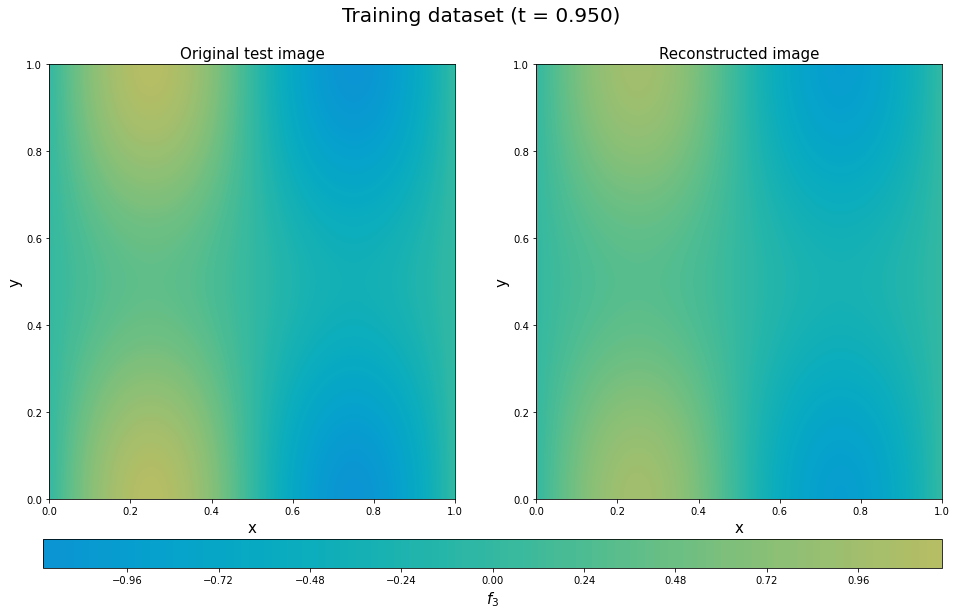

In [122]:
plt.figure(figsize=(16, 8))
y_train3_32_rotate = y_train3[32].T.reshape(101,101)
decoded_rotate3 = decoded_train3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_32_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[38]), fontsize=20)
plt.show()

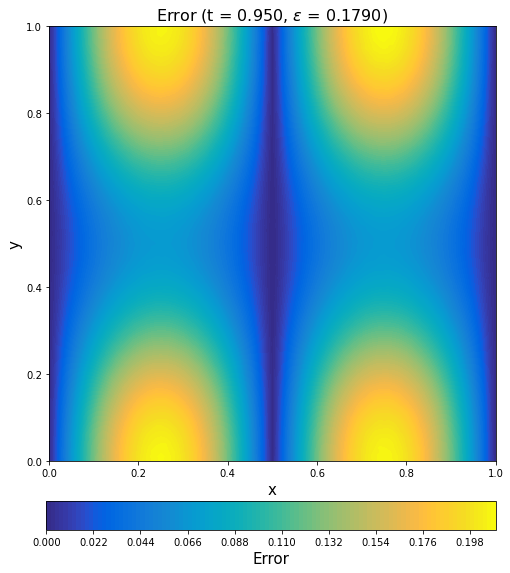

In [123]:
error_train_abs3_rotate32 = error_train_abs3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate32, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.950, $\epsilon$ = %.4f)' %(l2_error_train_list3[32]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

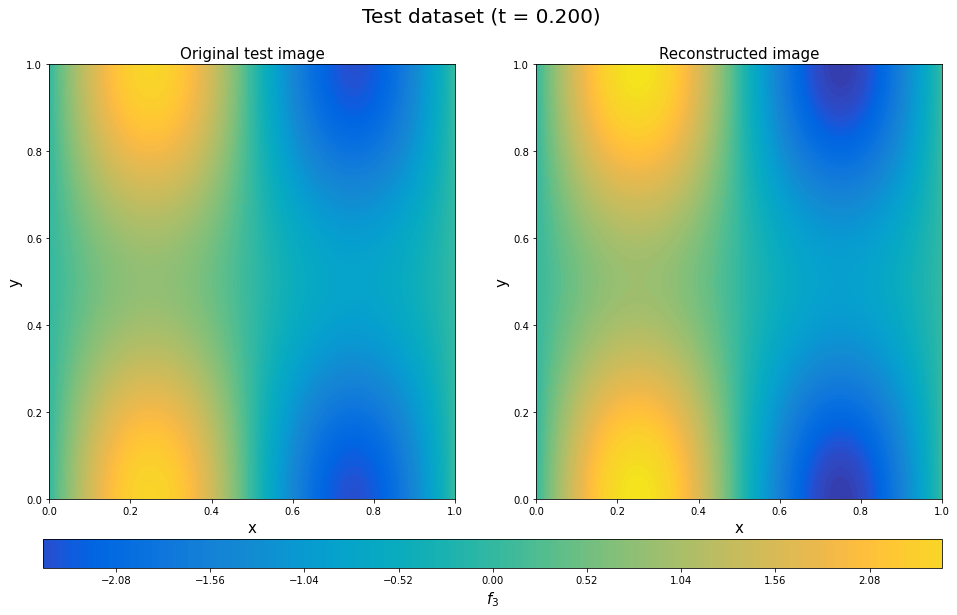

In [124]:
plt.figure(figsize=(16, 8))
y_test3_2_rotate = y_test3[2].T.reshape(101,101)
decoded_rotate3 = decoded_test3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

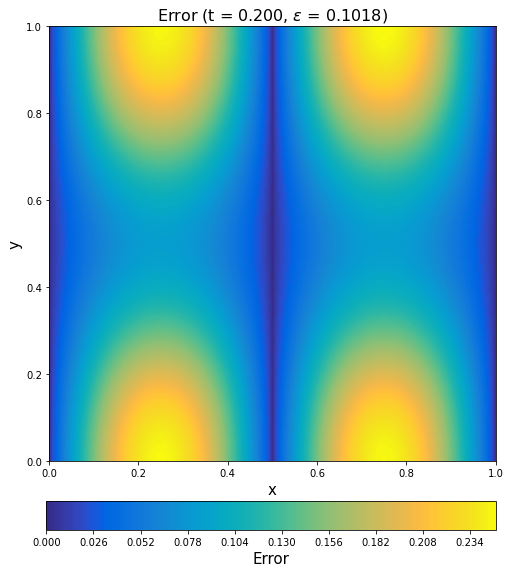

In [125]:
error_test_abs3_rotate2 = error_test_abs3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list3[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

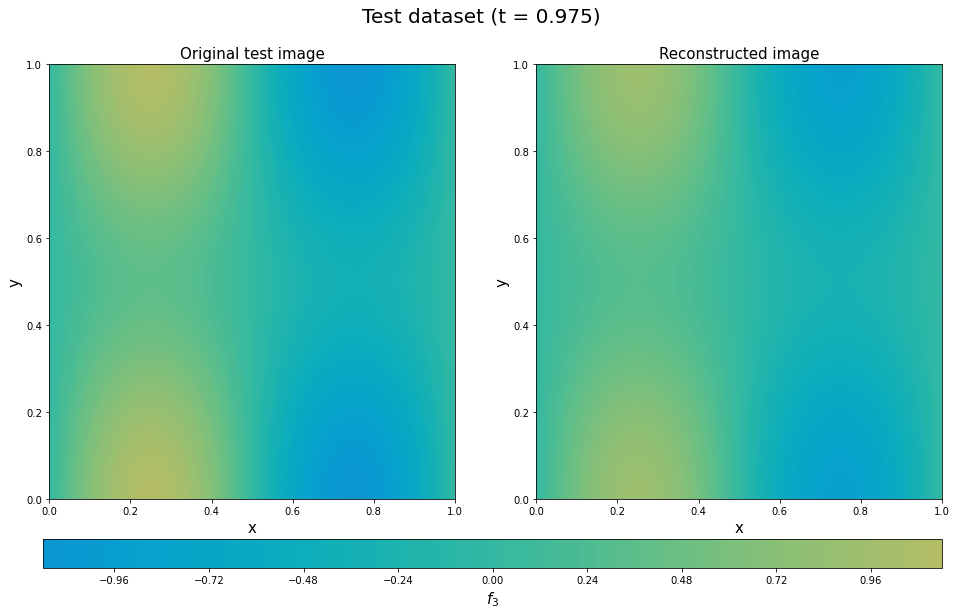

In [126]:
plt.figure(figsize=(16, 8))
y_test3_7_rotate = y_test3[7].T.reshape(101,101)
decoded_rotate3 = decoded_test3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_7_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[39]),fontsize=20)
plt.show()

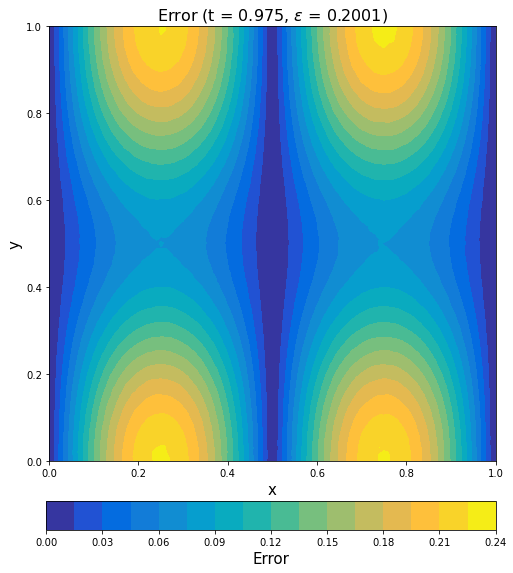

In [127]:
error_test_abs3_rotate7 = error_test_abs3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate7, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.975, $\epsilon$ = %.4f)' %(l2_error_test_list3[7]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()